In [1]:
# a=['id_sitio',
# 'corte_evento',
# 'Daily_Date',
# 'VolUnCorrected',
# 'VolCorrected',
# 'Pressure',
# 'Temperature',
# 'MaxPressure',
# 'MaxPressureTime',
# 'MinPressure',
# 'MinPressureTime',
# 'MaxFlow',
# 'maxFlowTime',
# 'MinFlow',
# 'MinFlowTime',
# 'MaxTemp',
# 'maxTempTime',
# 'MinTemp',
# 'MinTempTime',
# 'id_RTU']

In [35]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import datetime

In [3]:
def mytabla(data):
    nulls = pd.DataFrame(data.isnull().sum()/data.shape[0]*100, columns=['% de datos nulos'])
    ceros = pd.DataFrame((data==0).sum()/data.shape[0]*100, columns=['% de ceros'])
    tipo = pd.DataFrame(data.dtypes,columns=['Tipo de datos'])
    val = pd.DataFrame(data.nunique(),columns=['# de valores diferentes'])
    mis_val_table = pd.concat([nulls, ceros,tipo, val], axis=1)
    return mis_val_table

In [4]:
name = r"C:\Users\jibar\OneDrive - Universidad de los andes\Clases_Maestria\CIENCIA DE DATOS\Proyecto\General\General\Data\Daily.csv"

data =pd.read_csv(name,sep='|',error_bad_lines=False, warn_bad_lines= False,index_col=False,header=0, low_memory=False)

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 396887 entries, 0 to 396886
Data columns (total 20 columns):
id_sitio           396887 non-null int64
corte_evento       396887 non-null bool
Daily_Date         396887 non-null object
VolUnCorrected     396835 non-null object
VolCorrected       396818 non-null object
Pressure           396503 non-null object
Temperature        396503 non-null object
MaxPressure        9114 non-null float64
MaxPressureTime    9114 non-null object
MinPressure        9114 non-null float64
MinPressureTime    9114 non-null object
MaxFlow            9114 non-null float64
maxFlowTime        9114 non-null object
MinFlow            9114 non-null float64
MinFlowTime        9114 non-null object
MaxTemp            9114 non-null float64
maxTempTime        9114 non-null object
MinTemp            9114 non-null float64
MinTempTime        9114 non-null object
id_RTU             396625 non-null float64
dtypes: bool(1), float64(7), int64(1), object(11)
memory usage: 57.9+

In [6]:
data.head()


,id_sitio,corte_evento,Daily_Date,VolUnCorrected,VolCorrected,Pressure,Temperature,MaxPressure,MaxPressureTime,MinPressure,MinPressureTime,MaxFlow,maxFlowTime,MinFlow,MinFlowTime,MaxTemp,maxTempTime,MinTemp,MinTempTime,id_RTU
0,34,False,2013-08-19 23:59:59,"39,390000000000001","727,25",NaN,NaN,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,81.0
1,163,False,2013-08-21 23:59:59,"1434,9300000000001","24170,799999999999",NaN,NaN,0.0,2013-08-21 00:00:00,0.0,2013-08-21 00:00:00,0.0,2013-08-21 00:00:00,0.0,2013-08-21 00:00:00,0.0,2013-08-21 00:00:00,0.0,2013-08-21 00:00:00,3.0
2,40,False,2013-08-19 23:59:59,"7709,2600000000002","69097,570000000007",NaN,NaN,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,98.0
3,41,False,2013-08-19 23:59:59,"404,13999999999999","7004,7700000000004",NaN,NaN,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,89.0
4,50,False,2013-08-19 23:59:59,"3296,0100000000002","15331,190000000001",NaN,NaN,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,0.0,2013-08-19 00:00:00,87.0


In [7]:
# mytabla(data)

In [8]:
data['MaxPressure'].value_counts()

0.0    9114
Name: MaxPressure, dtype: int64

In [9]:
def eliminar_coma(x):
    x=str(x).replace(',','.')
    return x

In [10]:

data['VolUnCorrected']=data['VolUnCorrected'].apply(eliminar_coma)
data['VolCorrected']=data['VolCorrected'].apply(eliminar_coma)
data['Pressure']=data['Pressure'].apply(eliminar_coma)
data['Temperature']=data['Temperature'].apply(eliminar_coma)


convert = {'id_sitio':'object',
          'VolUnCorrected':float,
          'VolCorrected':float,
          'Pressure':float,
          'Temperature':float,
          'MaxPressure':float,
          'MinPressure':float,
          'MaxFlow':float,
          'MinFlow':float,
          'MaxTemp':float,
          'MinTemp':float,
          'id_RTU':'object'}
data = data.astype(convert)

## desde este punto se puede entender mejor lo que hay en la BD

In [11]:
data.shape

(396887, 20)

In [25]:
# data.dtypes

In [13]:
mytabla(data)

,% de datos nulos,% de ceros,Tipo de datos,# de valores diferentes
id_sitio,0.000000,0.000000,object,306
corte_evento,0.000000,100.000000,bool,1
Daily_Date,0.000000,0.000000,object,1907
VolUnCorrected,0.013102,5.477126,float64,114051
VolCorrected,0.017385,5.358452,float64,243108
Pressure,0.096753,1.574756,float64,21409
Temperature,0.096753,1.444492,float64,4189
MaxPressure,97.703628,2.296372,float64,1
MaxPressureTime,97.703628,0.000000,object,92
MinPressure,97.703628,2.296372,float64,1


In [14]:
numer = data.select_dtypes([float])
objeto= data.select_dtypes(['object'])

In [24]:
# numer.describe()

In [16]:
numer['MaxTemp'].value_counts()

0.0    9114
Name: MaxTemp, dtype: int64

In [26]:
# objeto.describe()

In [23]:
data.duplicated().sum()

0

In [22]:
data.drop_duplicates(inplace=True)

In [27]:
data.columns

Index(['id_sitio', 'corte_evento', 'Daily_Date', 'VolUnCorrected',
       'VolCorrected', 'Pressure', 'Temperature', 'MaxPressure',
       'MaxPressureTime', 'MinPressure', 'MinPressureTime', 'MaxFlow',
       'maxFlowTime', 'MinFlow', 'MinFlowTime', 'MaxTemp', 'maxTempTime',
       'MinTemp', 'MinTempTime', 'id_RTU'],
      dtype='object')

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


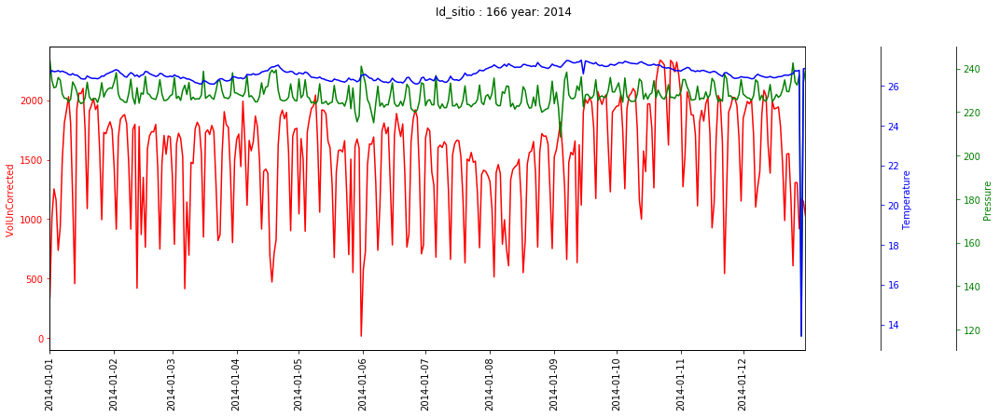

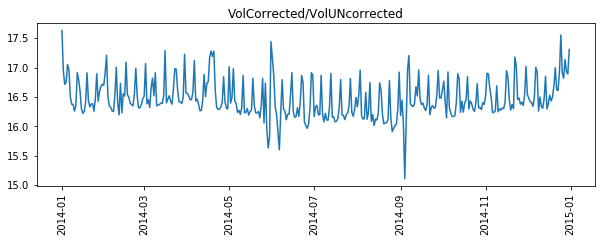

In [181]:
id_rtu =166
data['Daily_Date']   = pd.to_datetime(data['Daily_Date'])
data['Day'] =data['Daily_Date'].dt.date
data['Year'] =data['Daily_Date'].dt.year
def todo_en(id_sitio=166, year = 2014):
    p = (data[data['id_sitio']==id_sitio]).copy() 

    p.sort_values(by='Day', inplace=True)

    p.set_index('Daily_Date', inplace=True)





    variable = ('VolUnCorrected','Pressure','Temperature')
#     for i in p['Year'].unique():
    
    y = (p[p['Year']==year]).copy()
    fig, ax = plt.subplots(figsize = (18,6))

    # Twin the x-axis twice to make independent y-axes.
    axes = [ax, ax.twinx(),ax.twinx() ]

    # Make some space on the right side for the extra y-axis.
    fig.subplots_adjust(right=0.75)

    # Move the last y-axis spine over to the right by 20% of the width of the axes
    axes[-1].spines['right'].set_position(('axes', 1.1))
    axes[-2].spines['right'].set_position(('axes', 1.2))

    # To make the border of the right-most axis visible, we need to turn the frame
    # on. This hides the other plots, however, so we need to turn its fill off.
    axes[-1].set_frame_on(True)
    axes[-1].patch.set_visible(False)

#          And finally we get to plot things...
    colors = ('Red', 'Green', 'Blue')

#         for ax, color , variable in zip(axes, colors, variable):
    for ax, color , variable in zip(axes, colors, variable):

        ax.plot(y['Day'], y[variable], color=color)
        ax.set_ylabel('%s ' % variable, color=color)
        ax.tick_params(axis='y', colors=color)
        ax.set_xlim([datetime.date(year, 1, 1), datetime.date(year, 12, 31)])
        xlabels = y['Day']
        ax.set_xticklabels(xlabels, Rotation= 90 )
        print('-'*100)
        print('# de valores nulos en la serie {} : {}'.format(variable,y[variable].isnull().sum()) ,variable,y[variable][y[variable].isnull()])



        fig.suptitle('Id_sitio : {} year: {}'.format(id_sitio,year))
    plt.figure(figsize=(10,3))
    plt.plot(y['Day'], y['VolCorrected']/y['VolUnCorrected'])
    plt.title('VolCorrected/VolUNcorrected')
    plt.xticks(rotation=90)
    
    
    
    
    
    
    
    
    
    
    
    
    
    
    plt.show()

todo_en()

In [177]:
# data['Daily_Date'].dt.year.unique()xticks

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 2 Pressure Daily_Date
2013-08-19 23:59:59   NaN
2013-08-21 23:59:59   NaN
Name: Pressure, dtype: float64
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 2 Temperature Daily_Date
2013-08-19 23:59:59   NaN
2013-08-21 23:59:59   NaN
Name: Temperature, dtype: float64


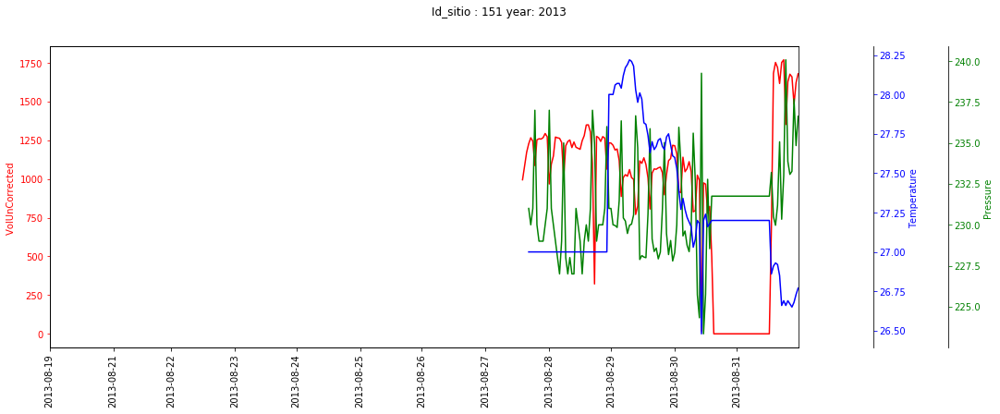

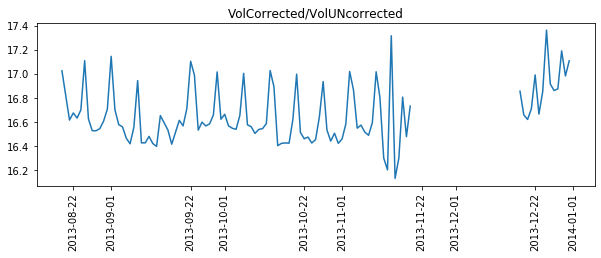

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


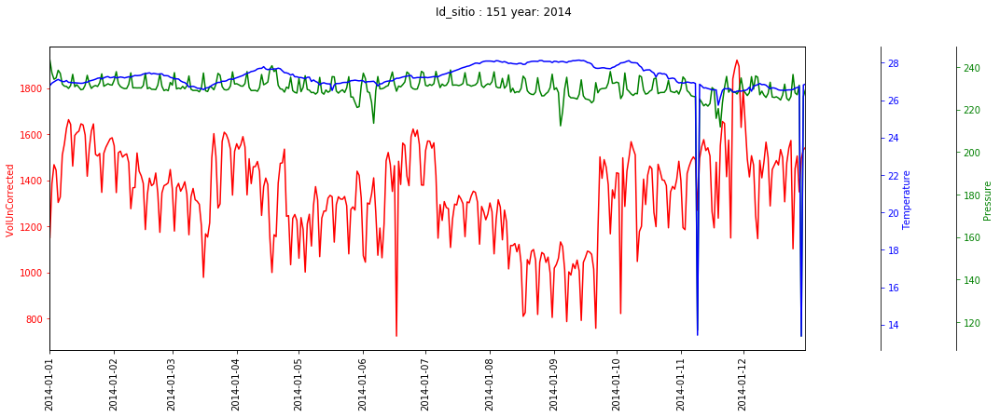

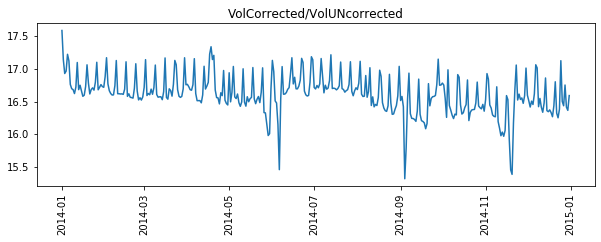

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


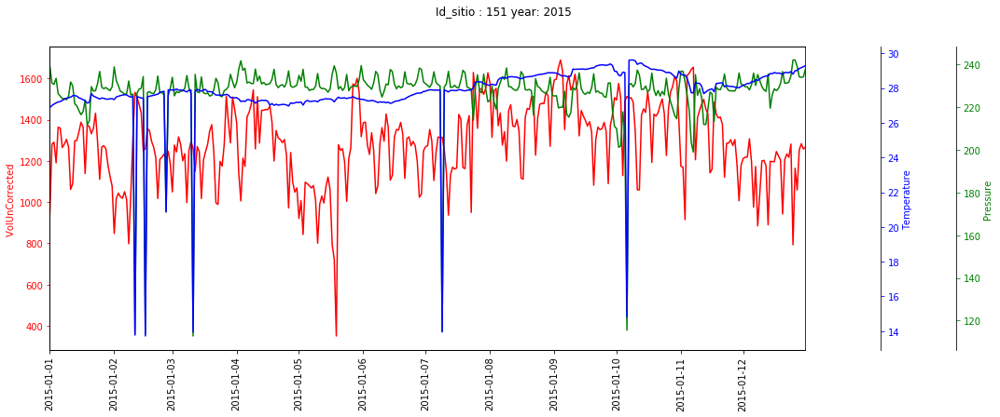

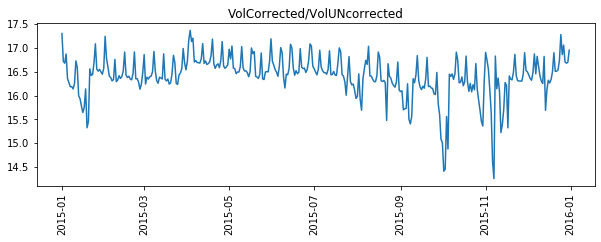

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


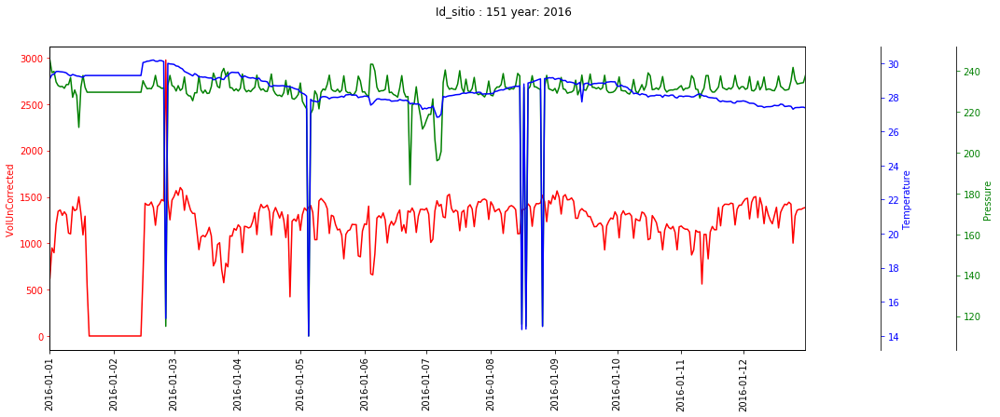

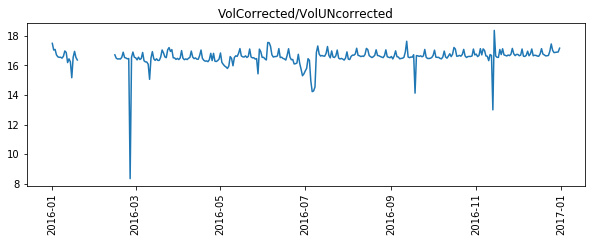

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


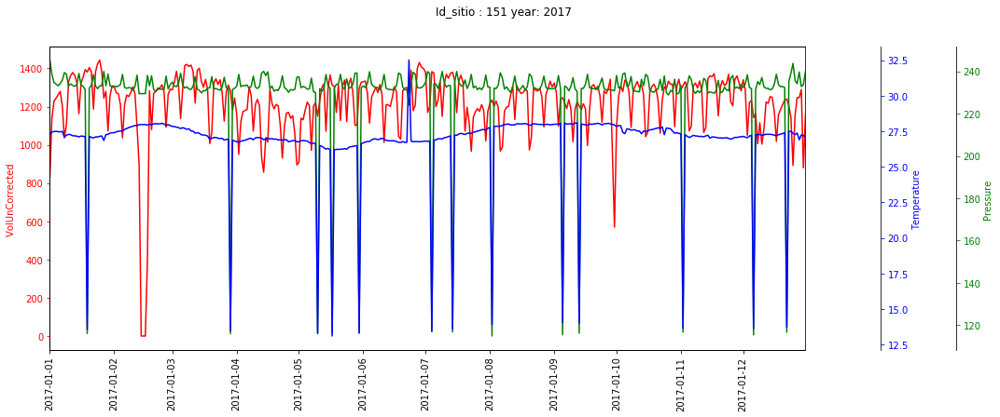

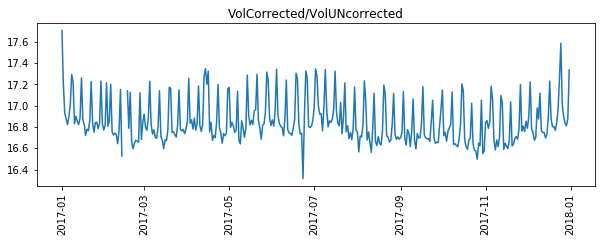

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


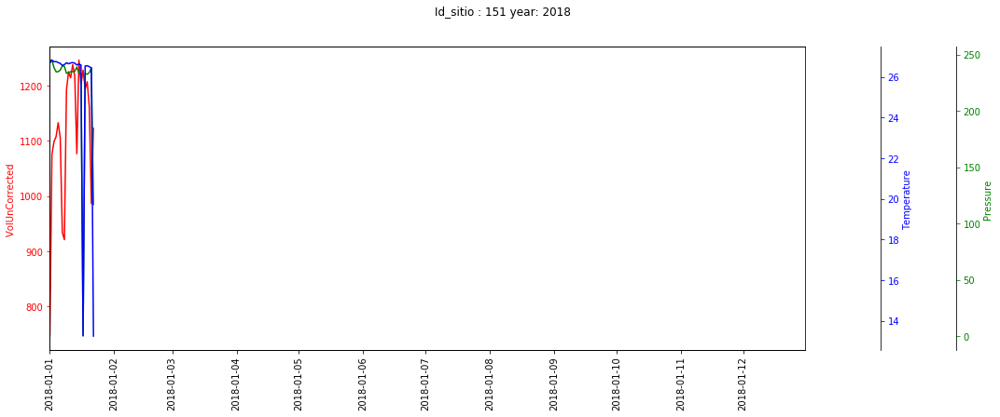

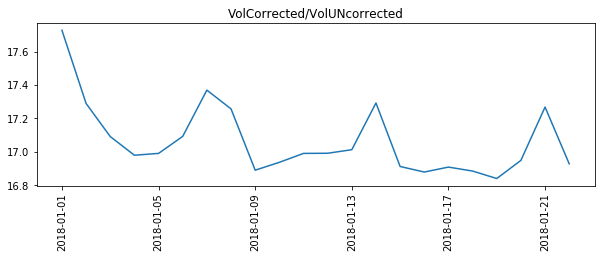

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 2 Pressure Daily_Date
2013-08-19 23:59:59   NaN
2013-08-21 23:59:59   NaN
Name: Pressure, dtype: float64
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 2 Temperature Daily_Date
2013-08-19 23:59:59   NaN
2013-08-21 23:59:59   NaN
Name: Temperature, dtype: float64


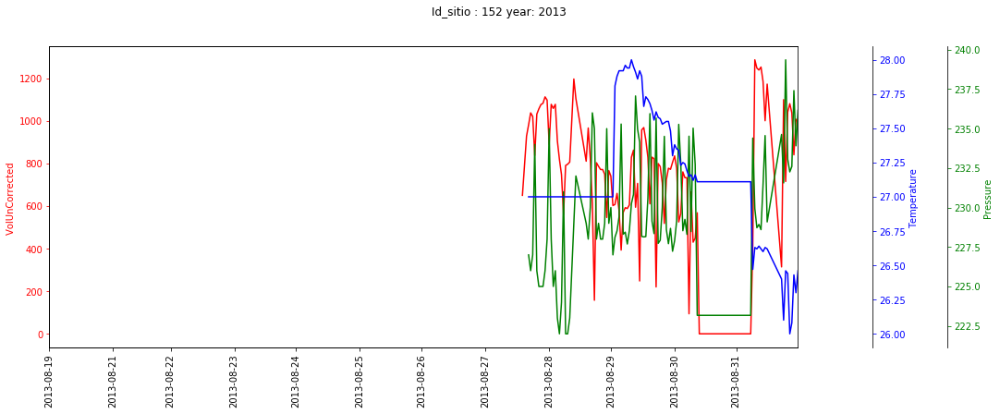

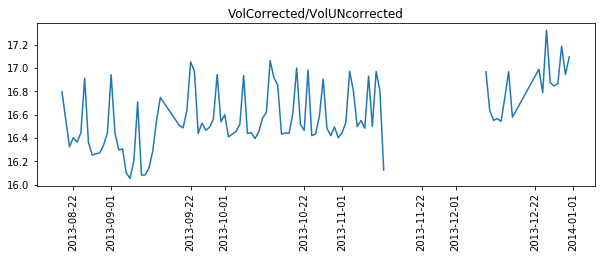

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


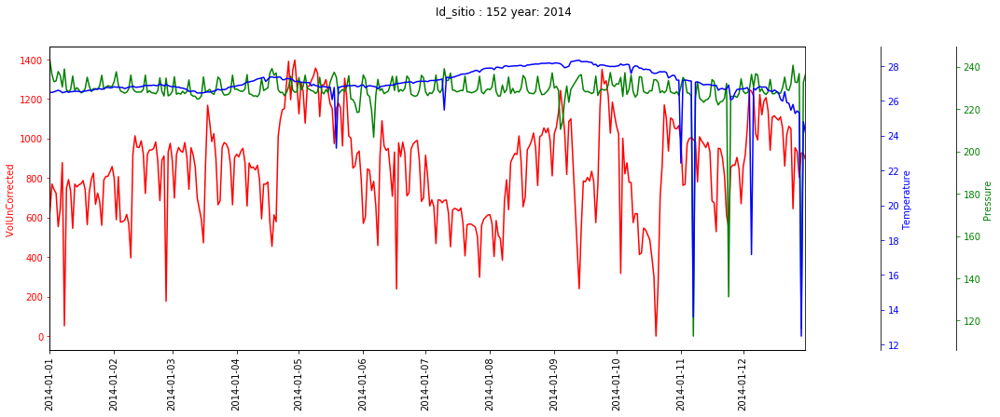

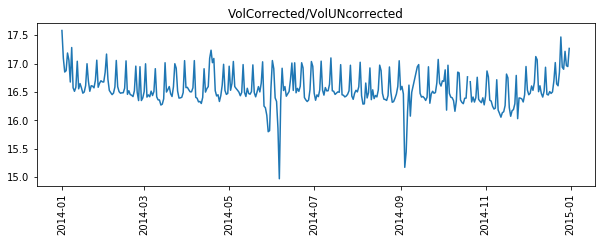

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


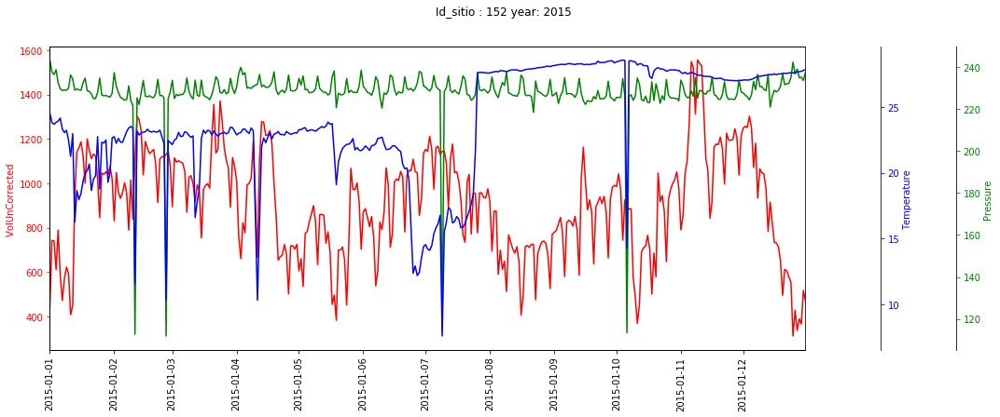

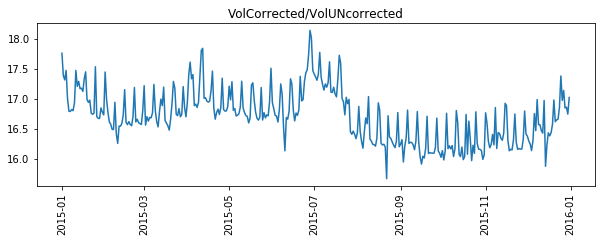

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


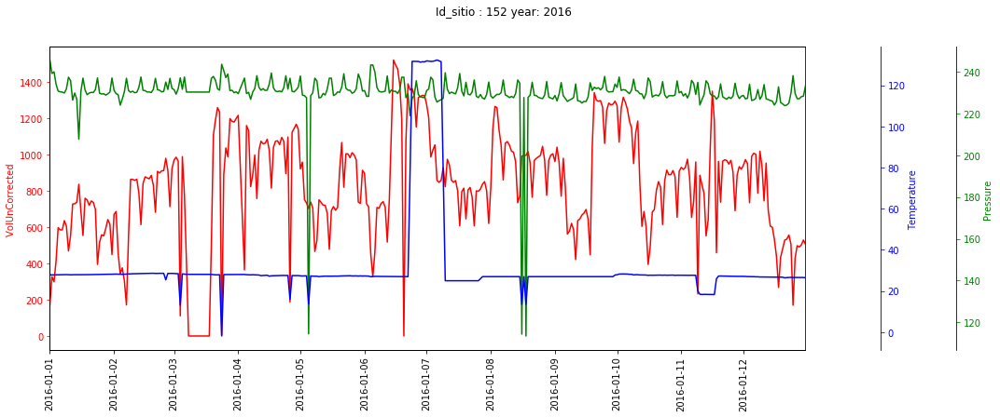

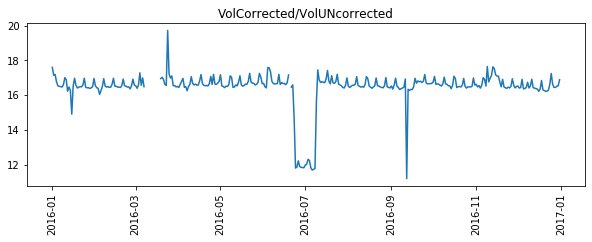

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


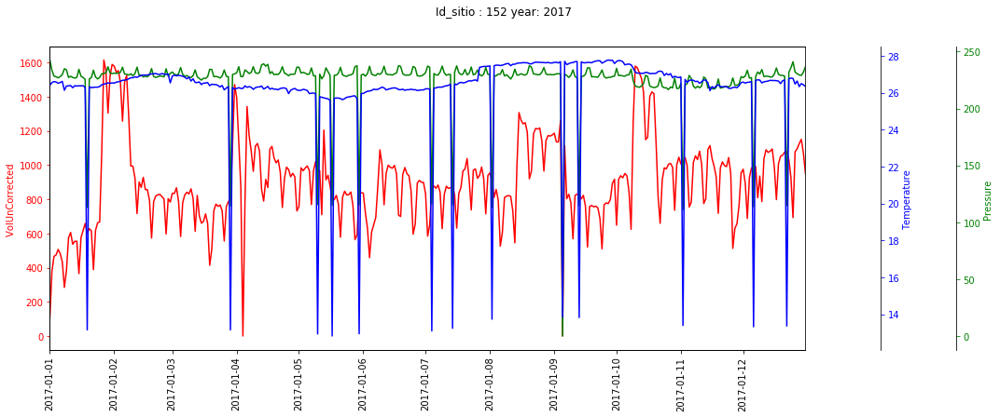

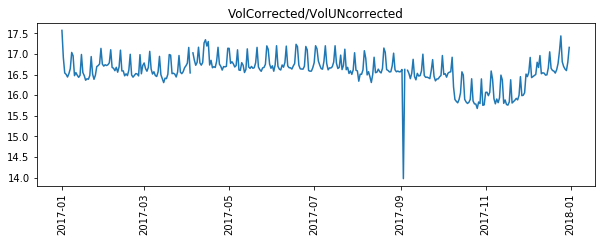

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


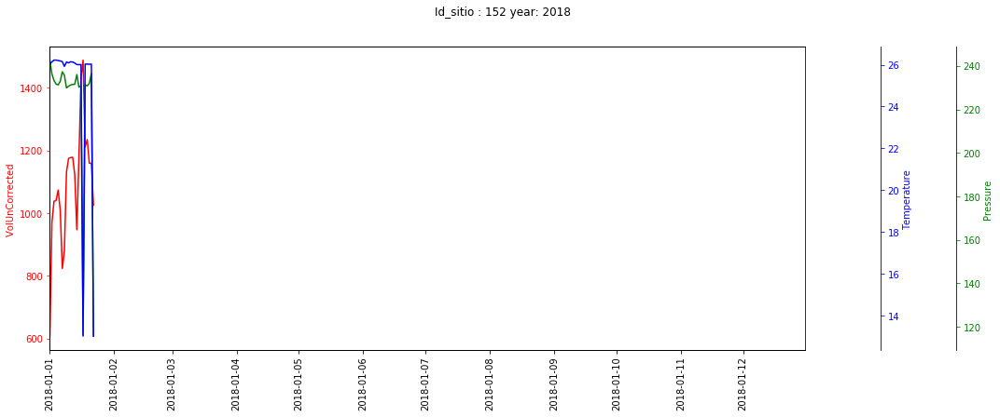

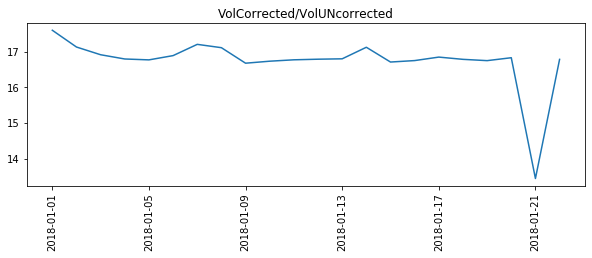

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 2 Pressure Daily_Date
2013-08-19 23:59:59   NaN
2013-08-21 23:59:59   NaN
Name: Pressure, dtype: float64
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 2 Temperature Daily_Date
2013-08-19 23:59:59   NaN
2013-08-21 23:59:59   NaN
Name: Temperature, dtype: float64


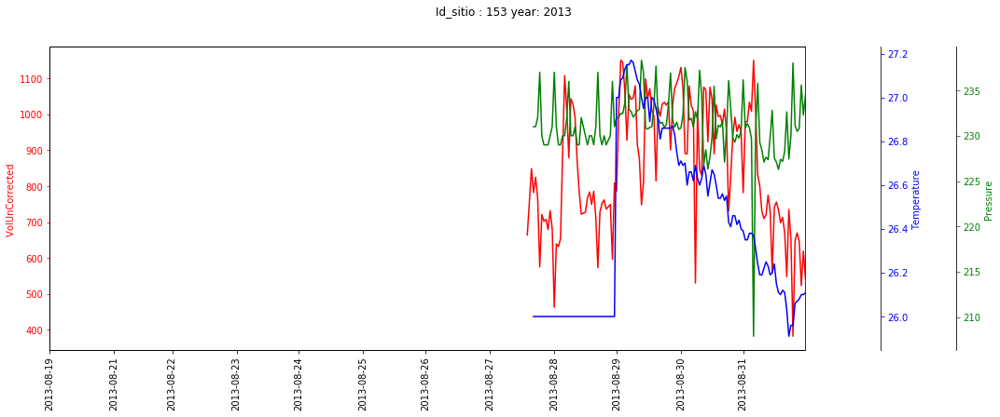

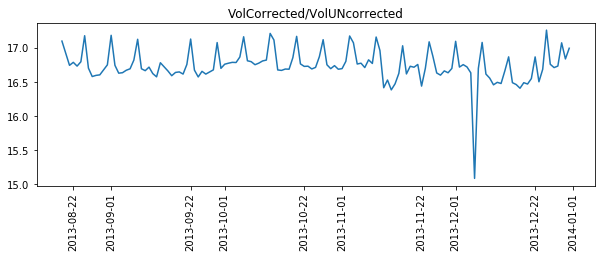

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


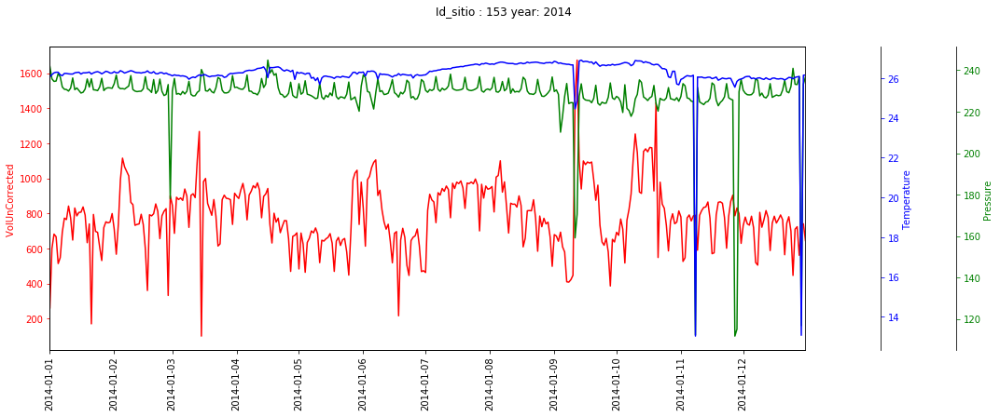

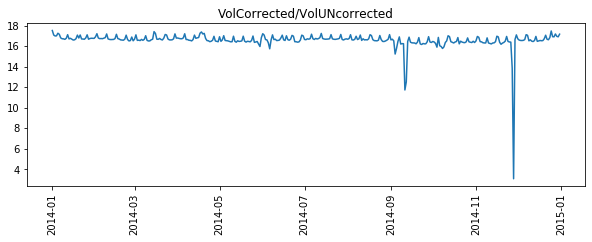

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


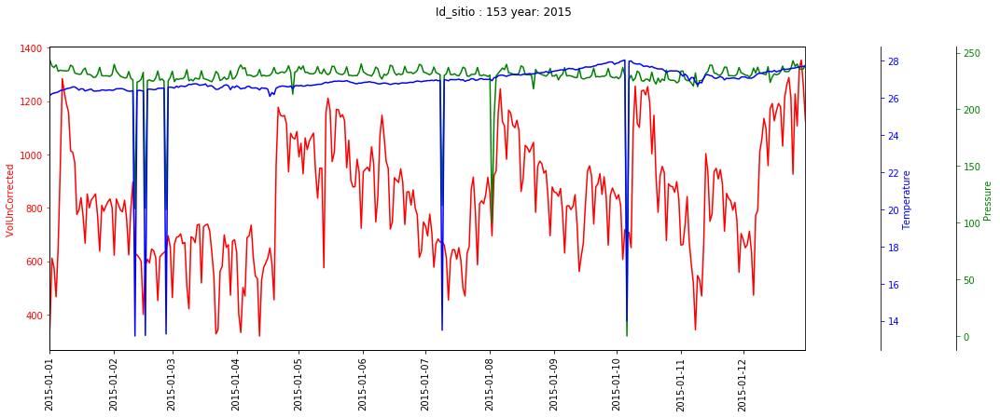

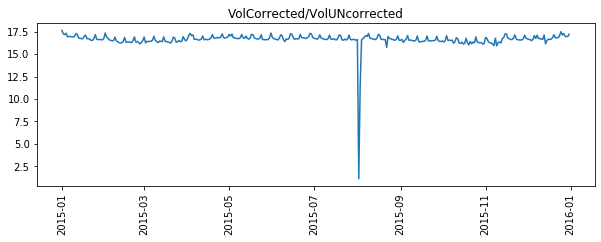

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


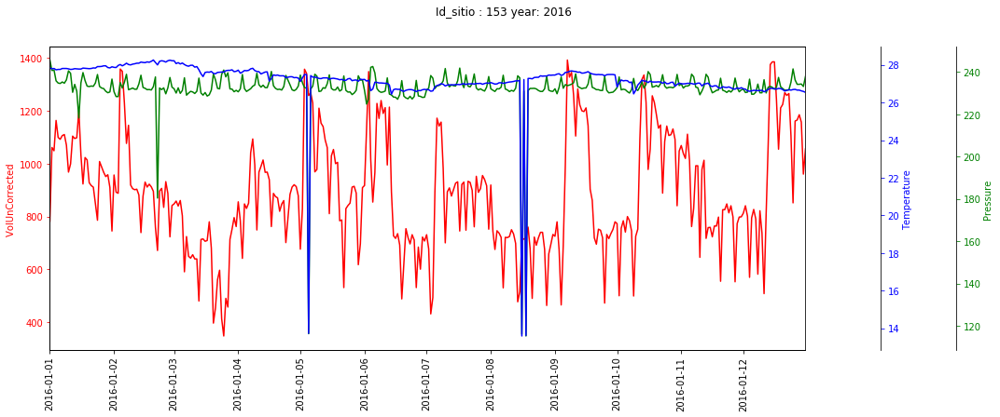

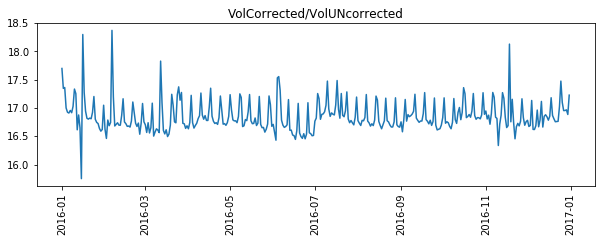

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


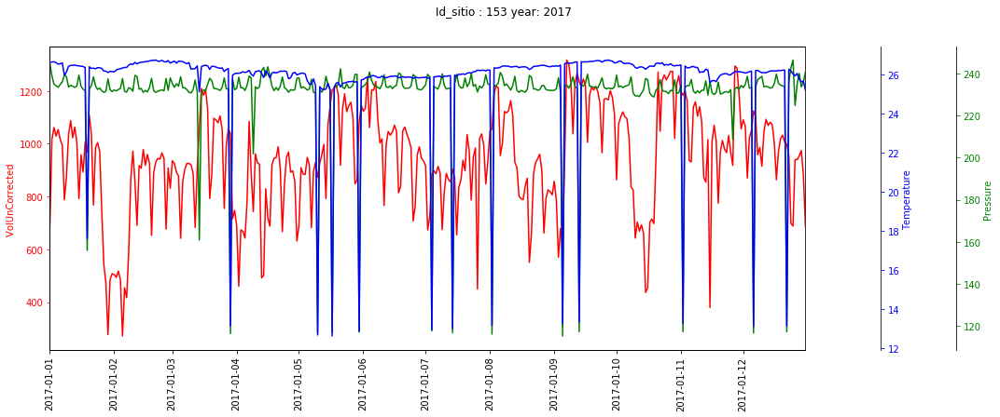

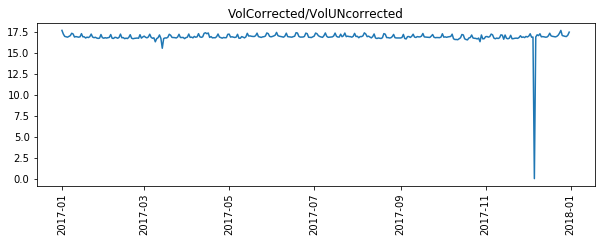

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


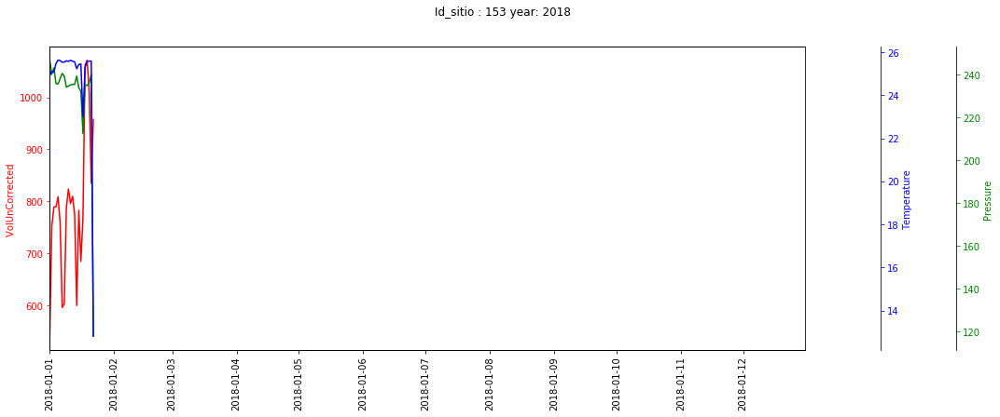

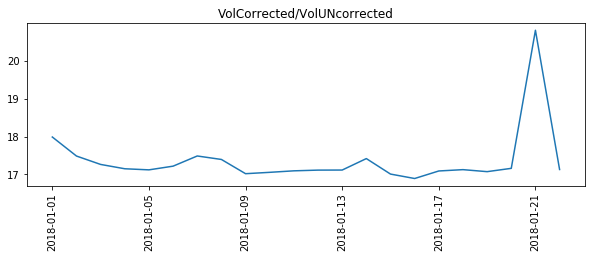

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 2 Pressure Daily_Date
2013-08-19 23:59:59   NaN
2013-08-21 23:59:59   NaN
Name: Pressure, dtype: float64
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 2 Temperature Daily_Date
2013-08-19 23:59:59   NaN
2013-08-21 23:59:59   NaN
Name: Temperature, dtype: float64


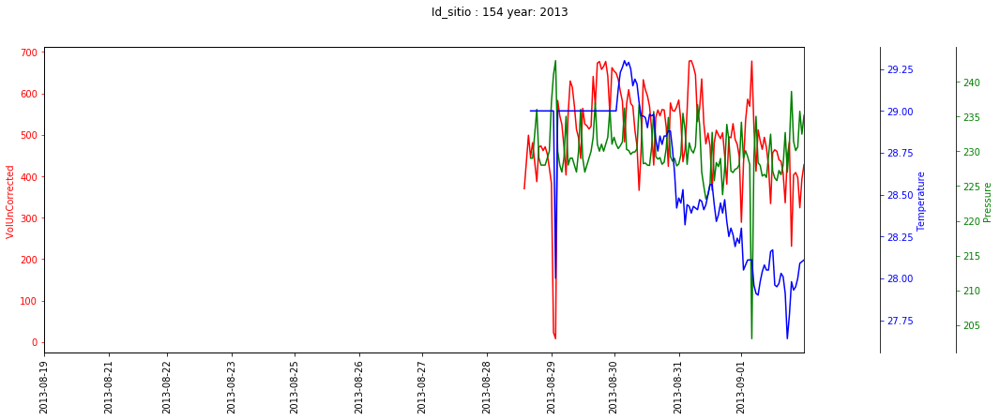

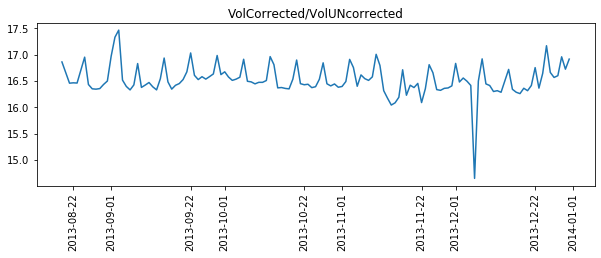

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


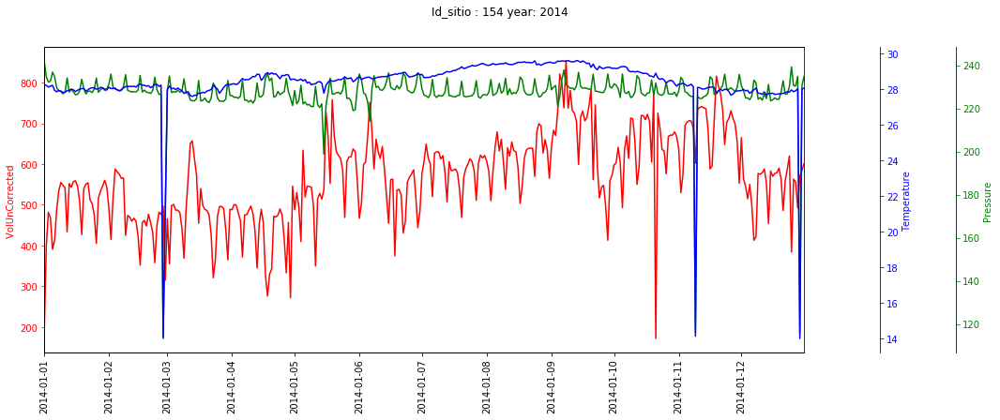

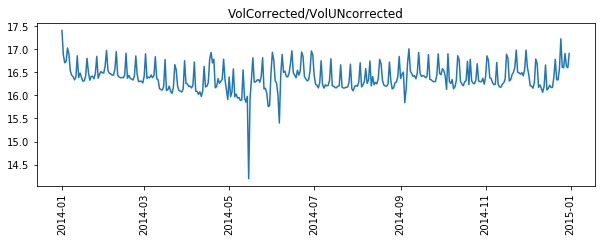

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


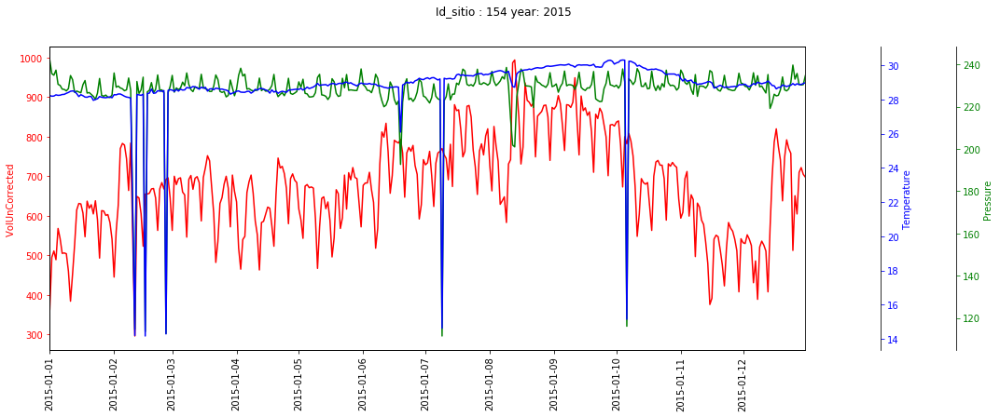

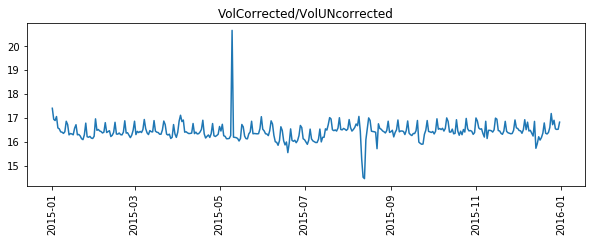

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


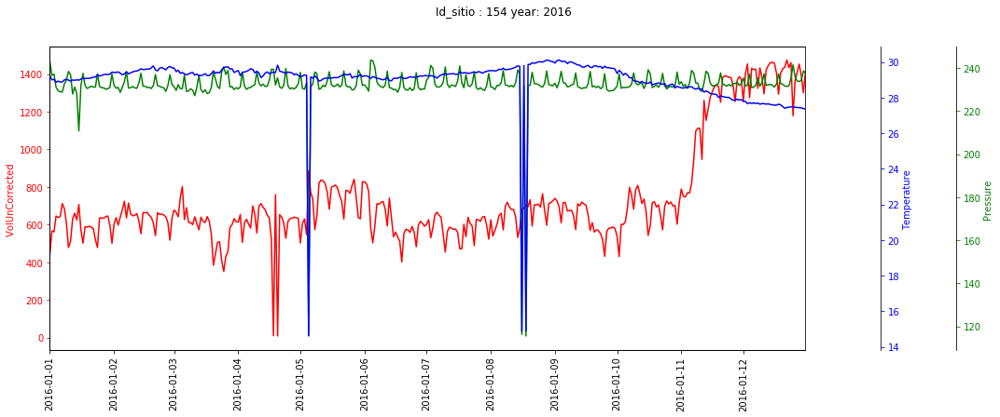

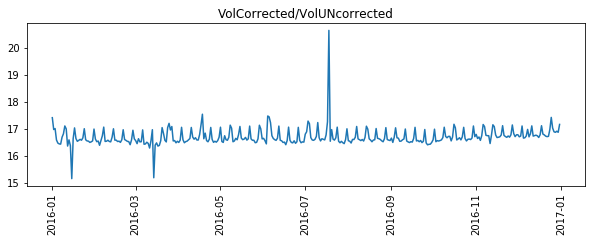

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


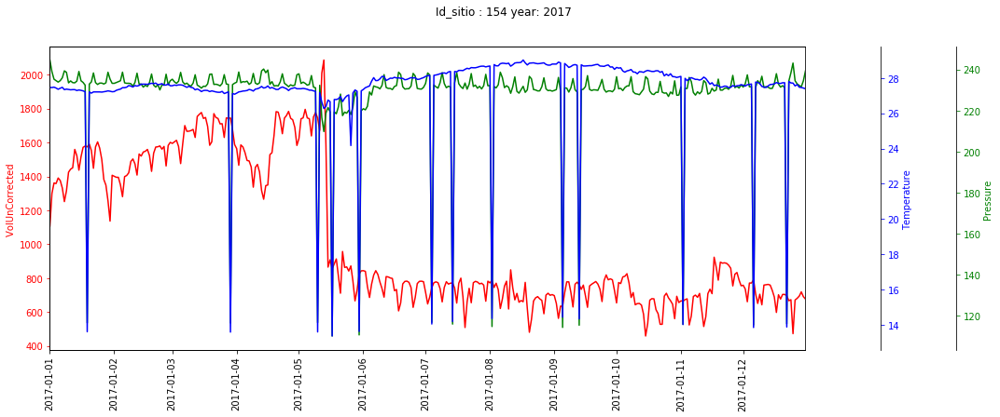

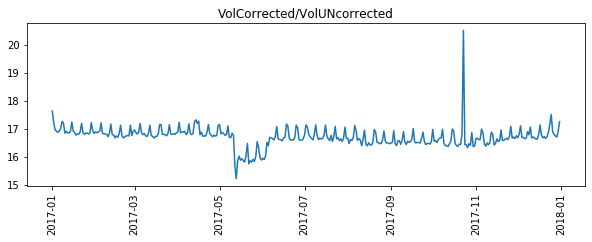

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


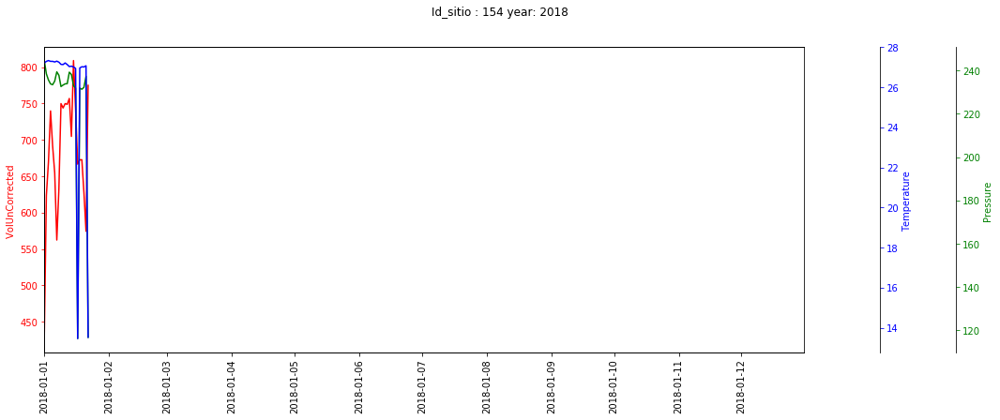

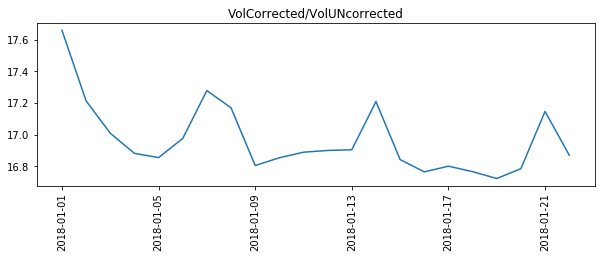

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 2 Pressure Daily_Date
2013-08-19 23:59:59   NaN
2013-08-21 23:59:59   NaN
Name: Pressure, dtype: float64
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 2 Temperature Daily_Date
2013-08-19 23:59:59   NaN
2013-08-21 23:59:59   NaN
Name: Temperature, dtype: float64


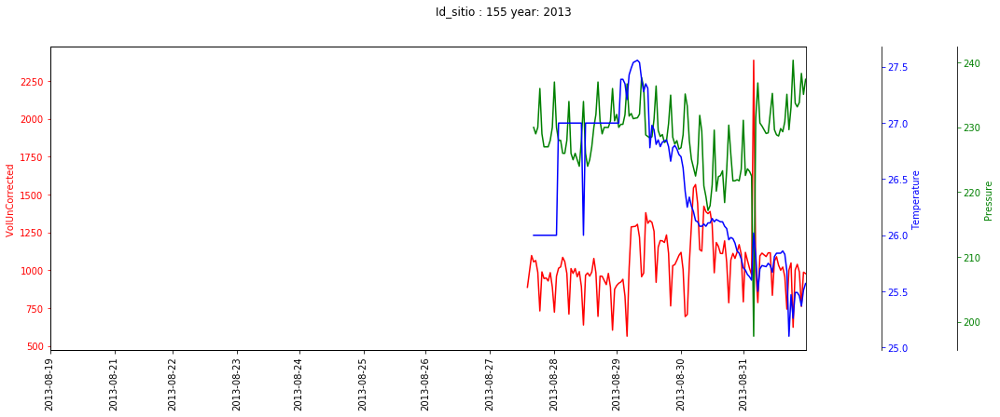

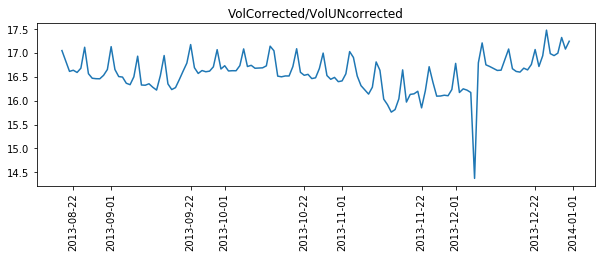

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


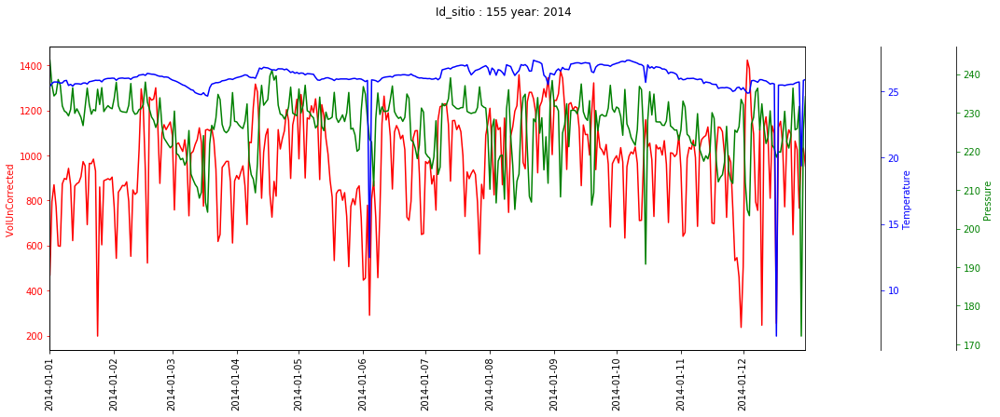

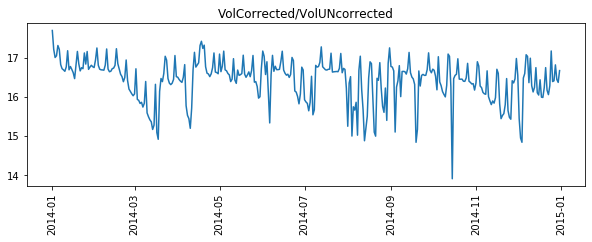

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


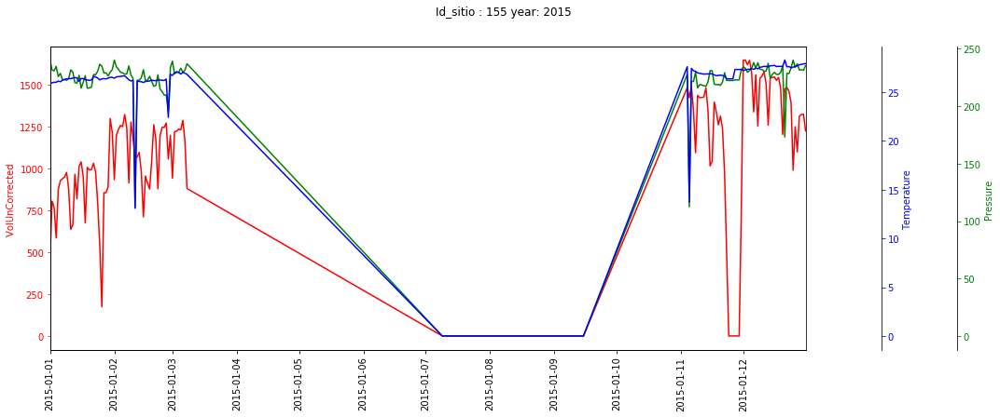

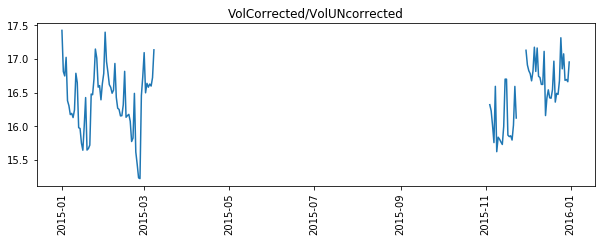

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


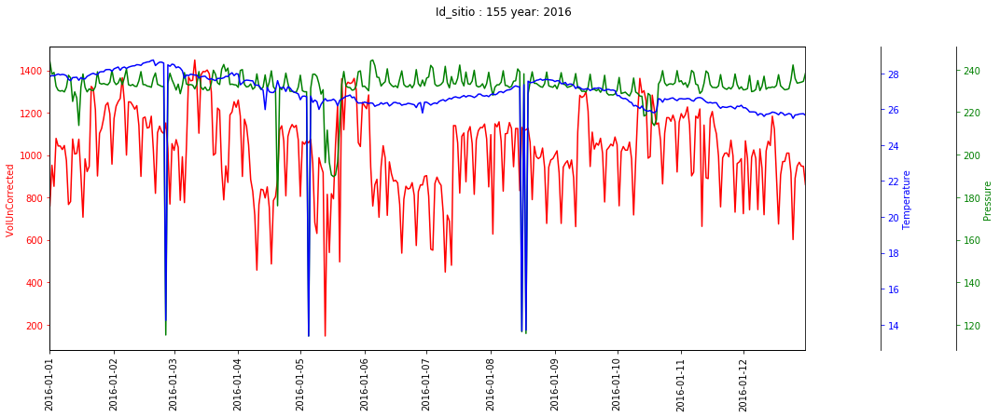

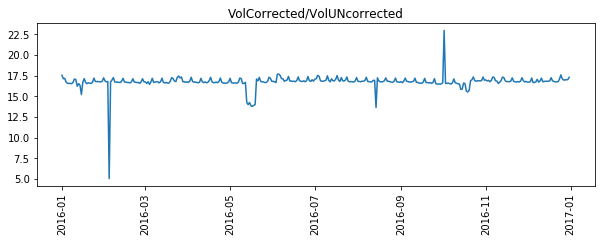

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


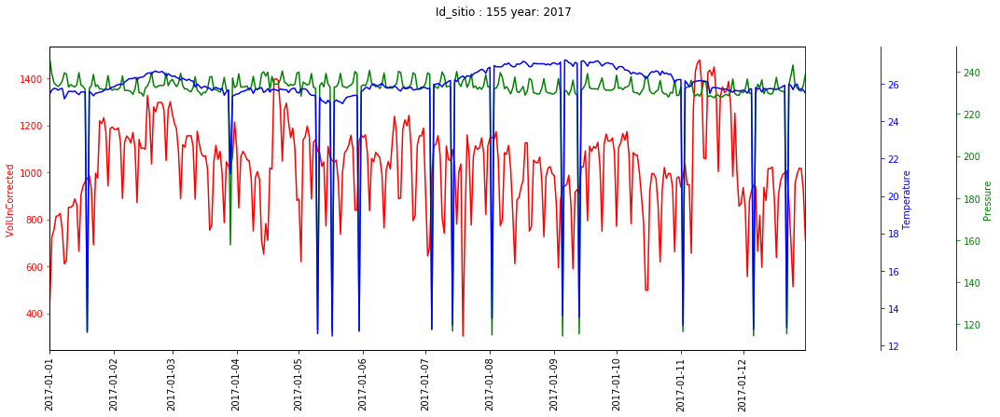

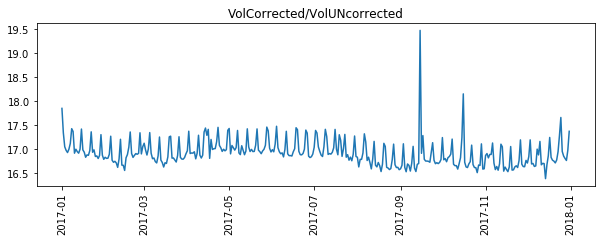

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


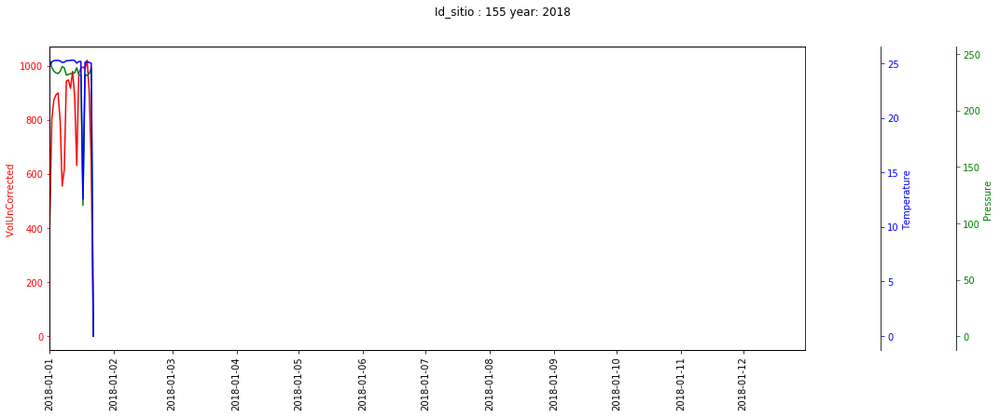

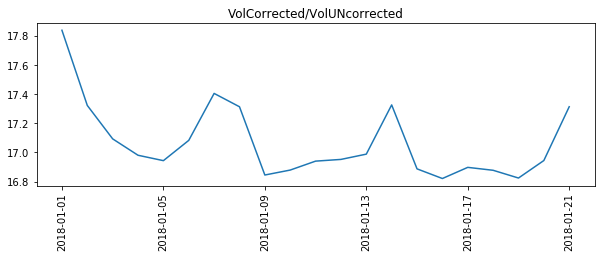

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 2 Pressure Daily_Date
2013-08-19 23:59:59   NaN
2013-08-21 23:59:59   NaN
Name: Pressure, dtype: float64
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 2 Temperature Daily_Date
2013-08-19 23:59:59   NaN
2013-08-21 23:59:59   NaN
Name: Temperature, dtype: float64


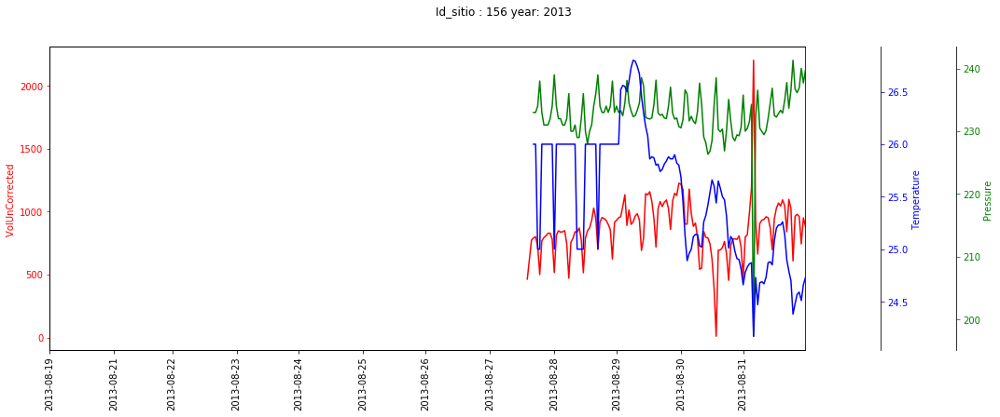

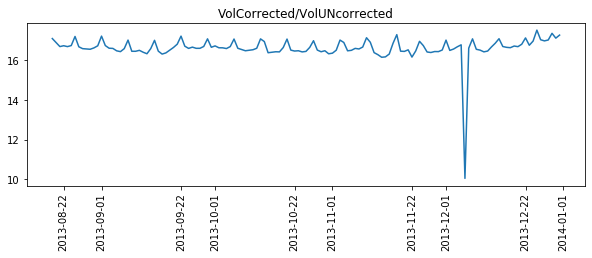

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


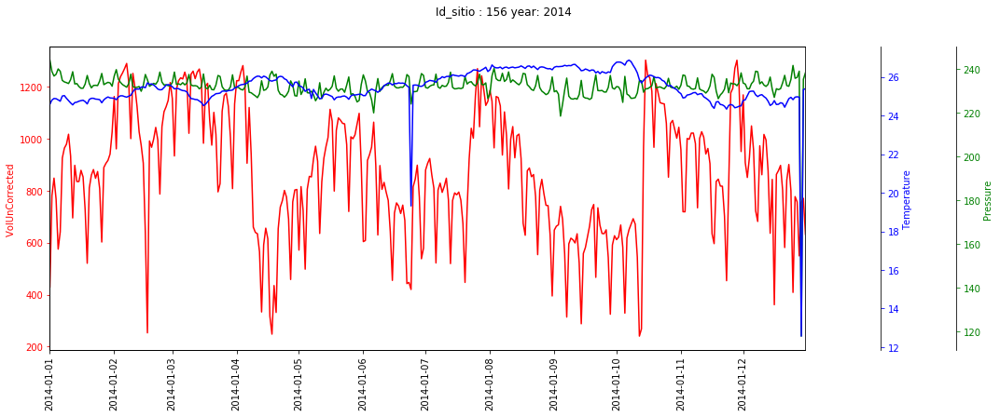

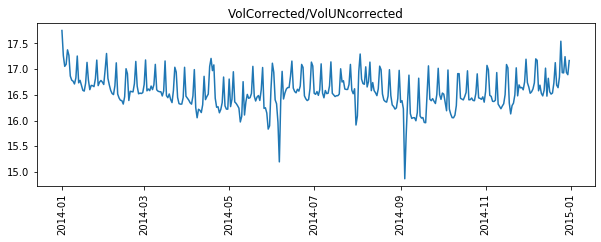

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


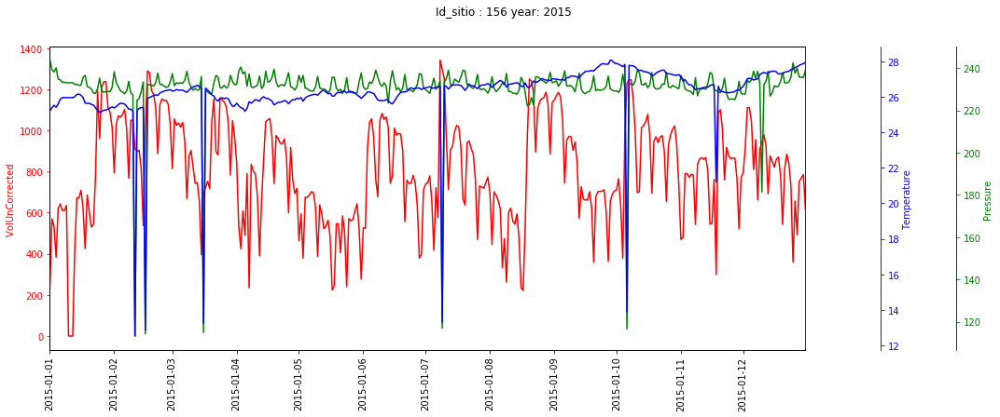

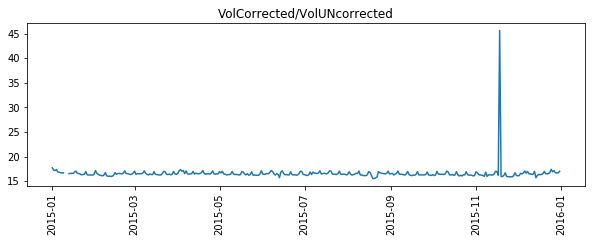

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


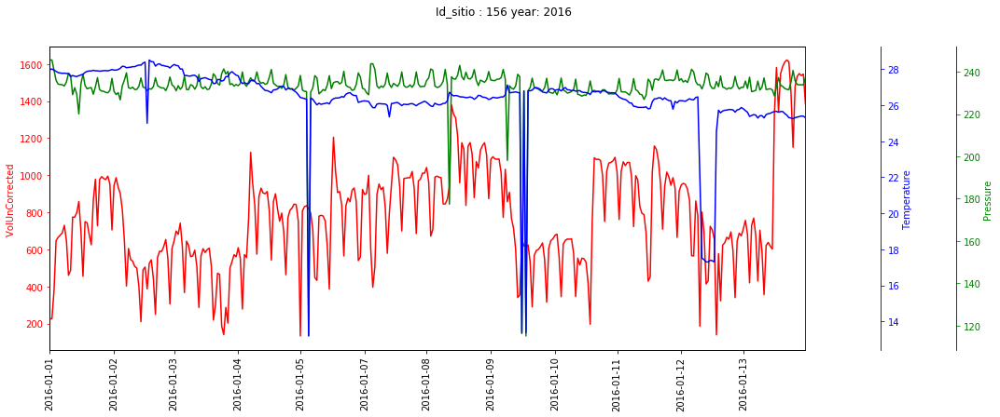

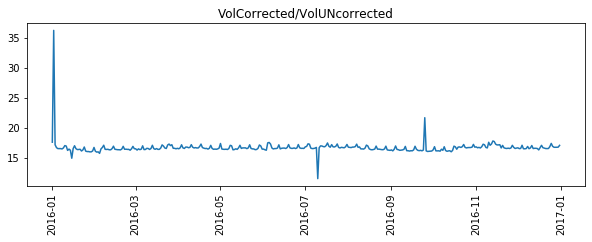

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


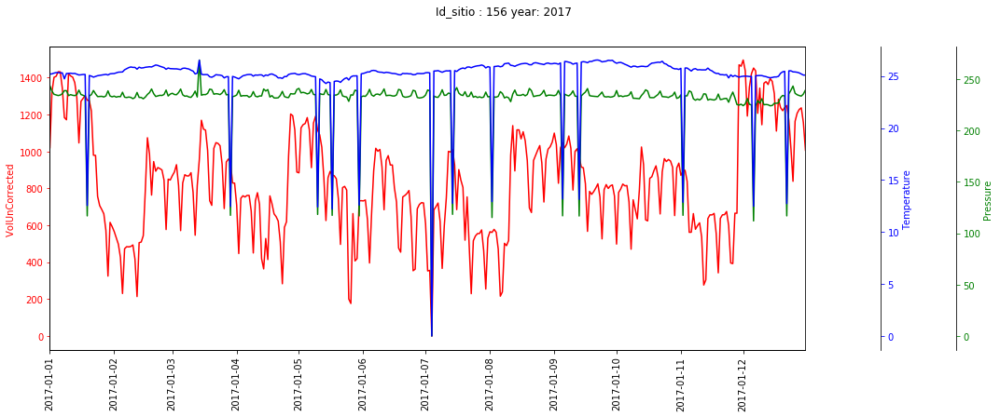

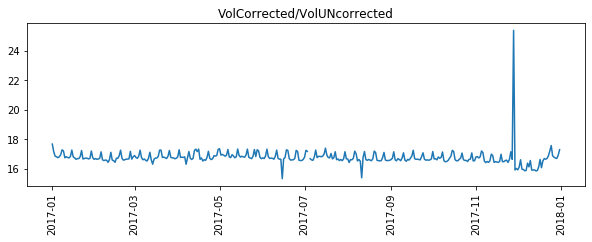

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


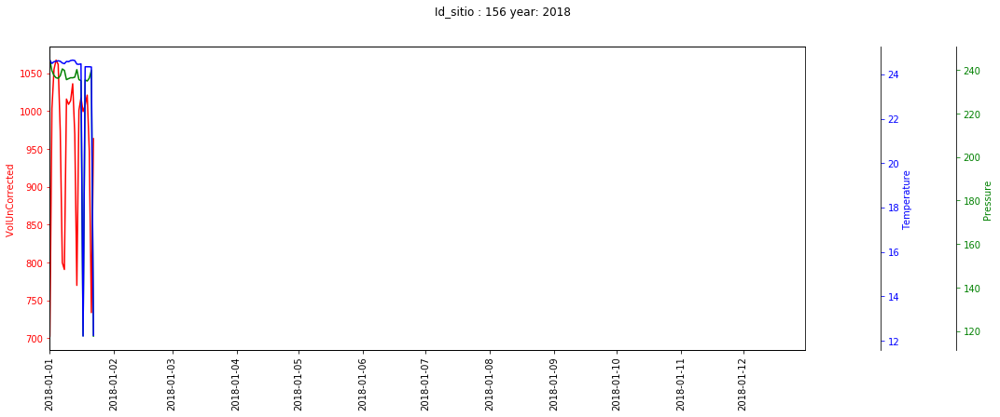

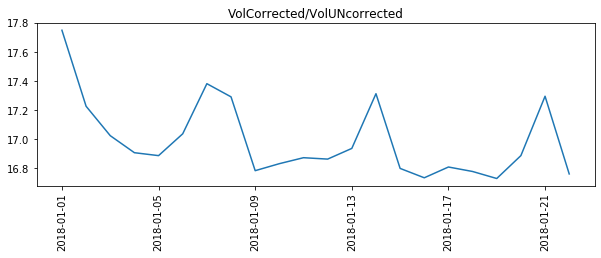

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 2 Pressure Daily_Date
2013-08-19 23:59:59   NaN
2013-08-21 23:59:59   NaN
Name: Pressure, dtype: float64
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 2 Temperature Daily_Date
2013-08-19 23:59:59   NaN
2013-08-21 23:59:59   NaN
Name: Temperature, dtype: float64


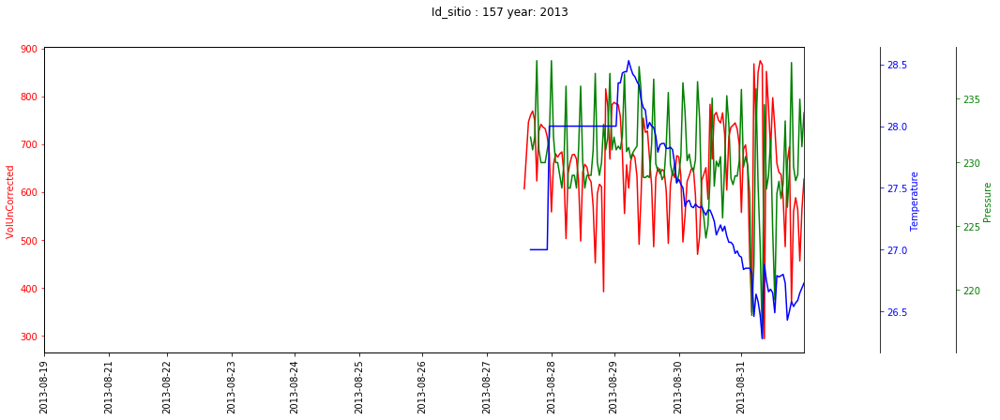

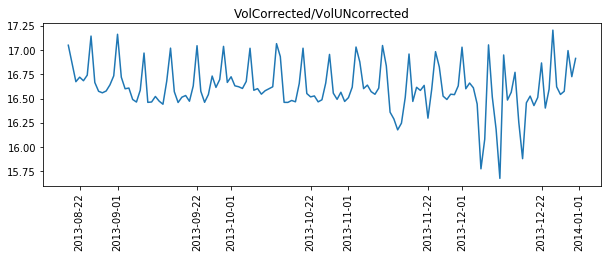

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


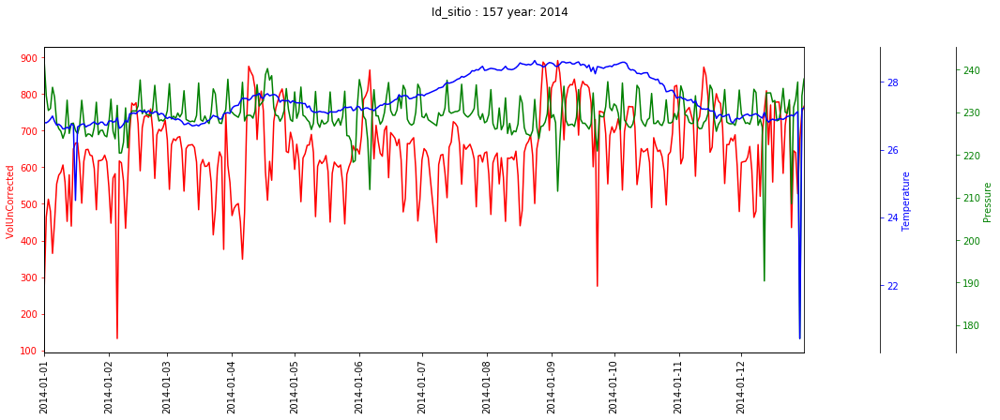

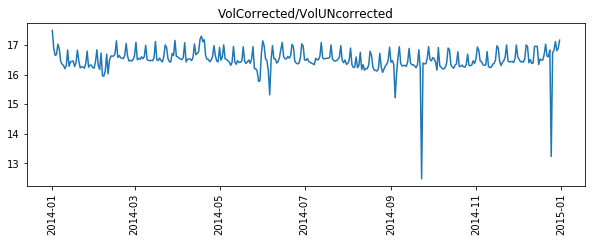

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


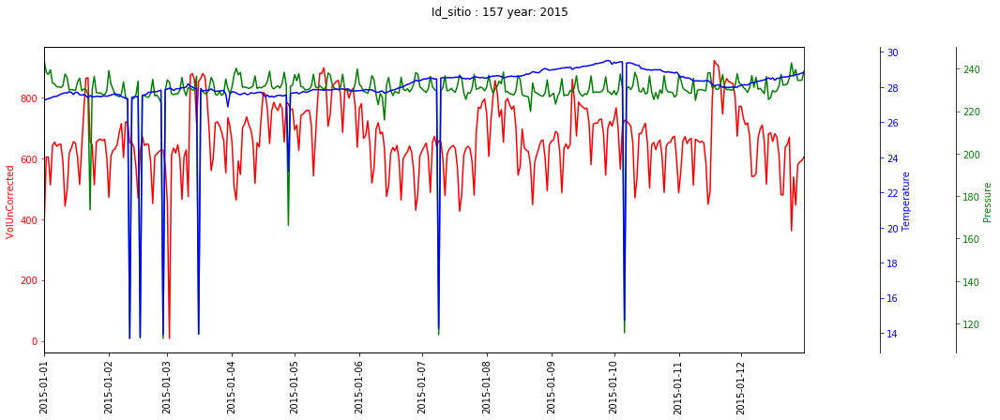

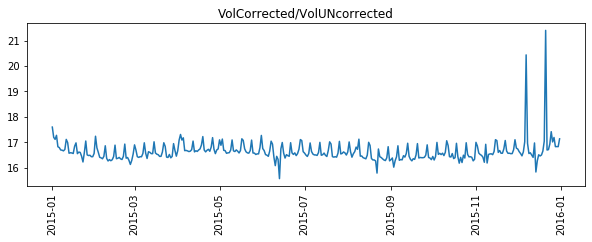

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


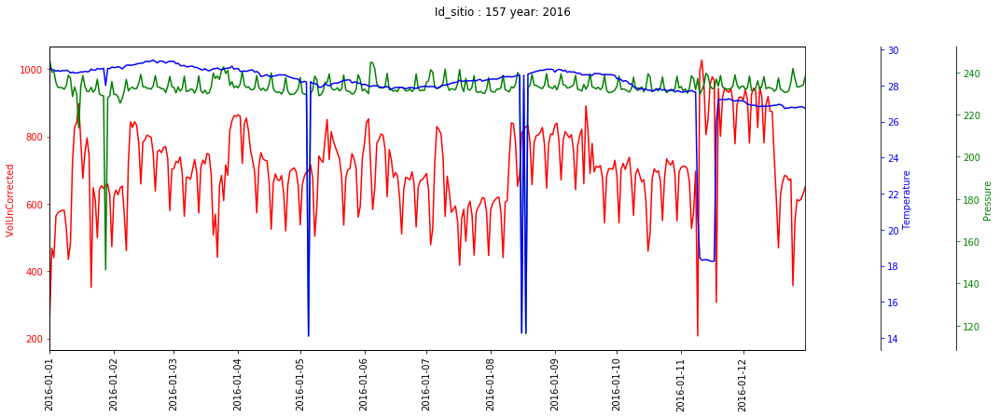

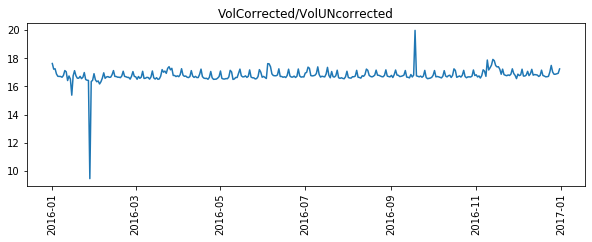

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


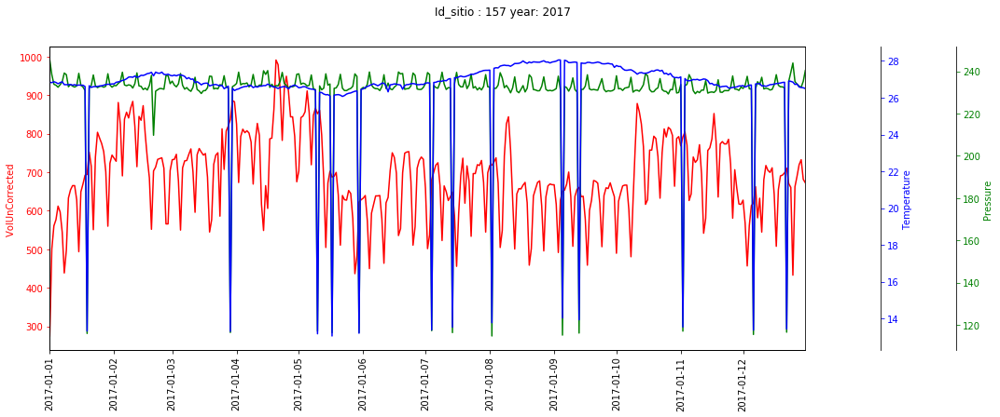

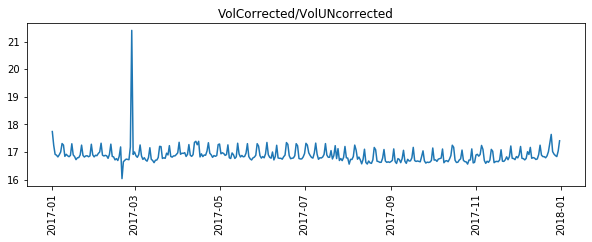

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


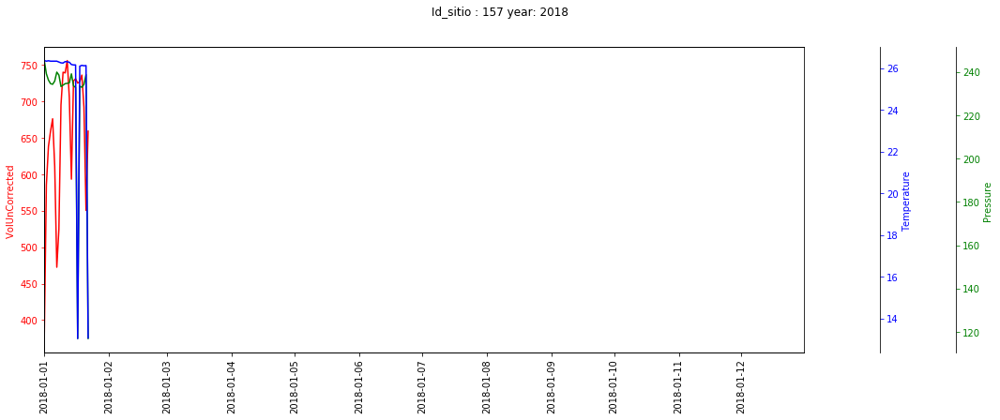

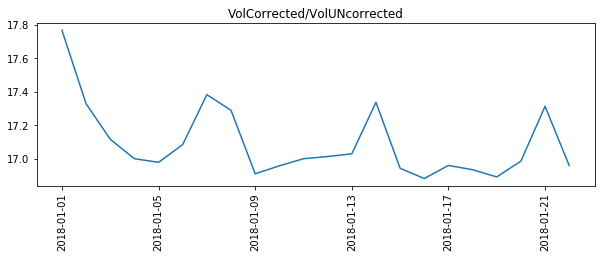

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 2 Pressure Daily_Date
2013-08-19 23:59:59   NaN
2013-08-21 23:59:59   NaN
Name: Pressure, dtype: float64
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 2 Temperature Daily_Date
2013-08-19 23:59:59   NaN
2013-08-21 23:59:59   NaN
Name: Temperature, dtype: float64


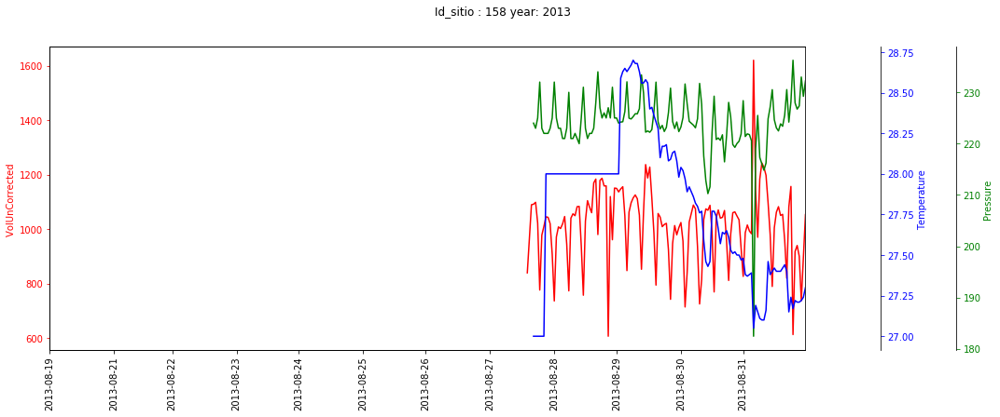

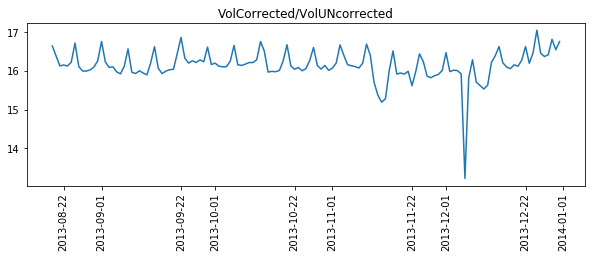

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


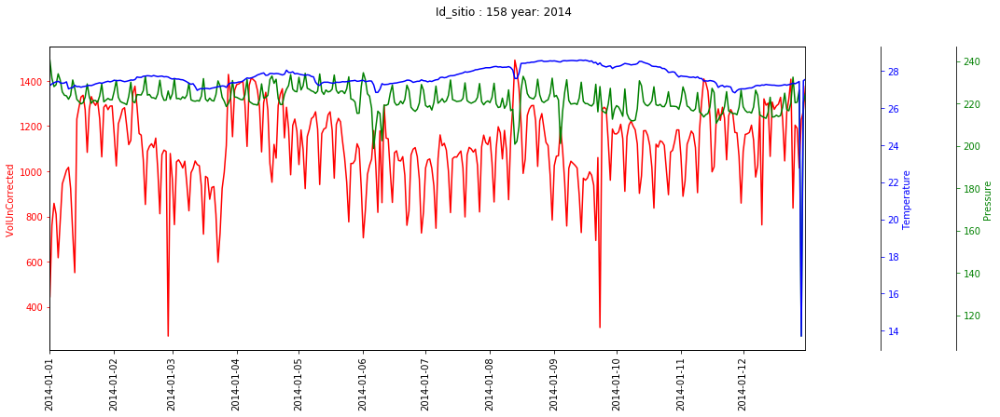

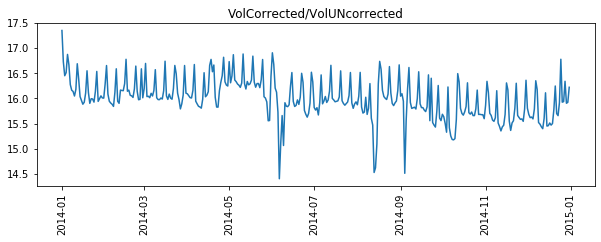

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


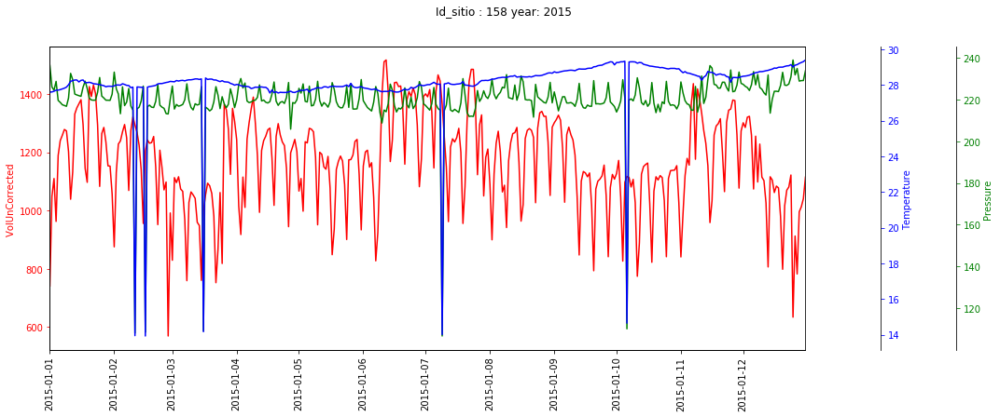

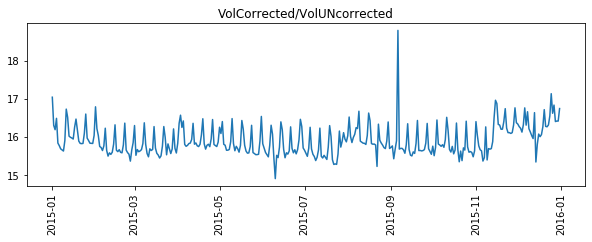

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


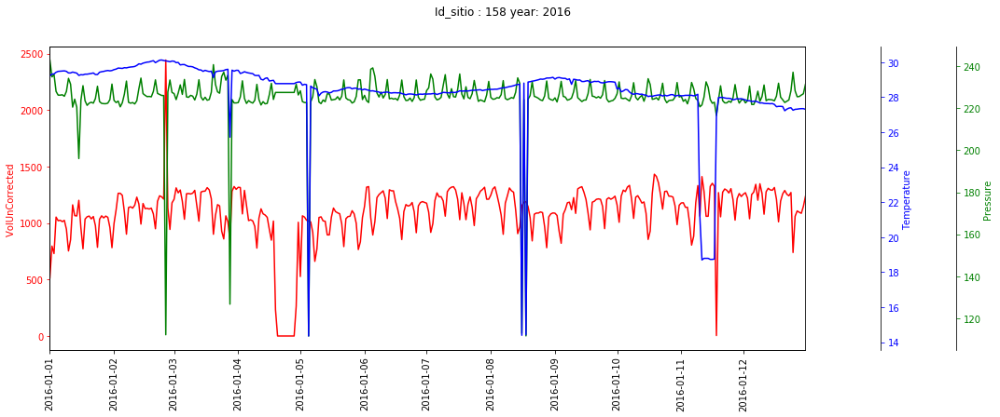

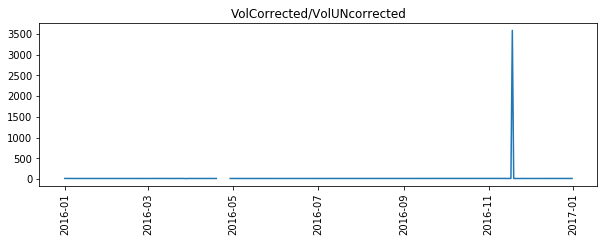

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


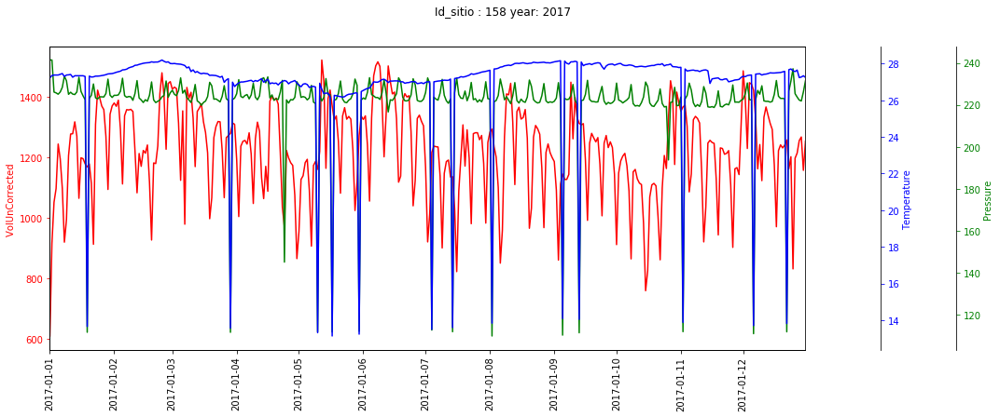

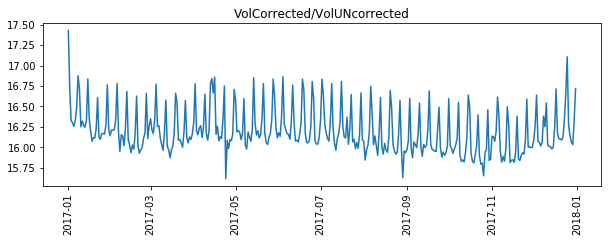

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


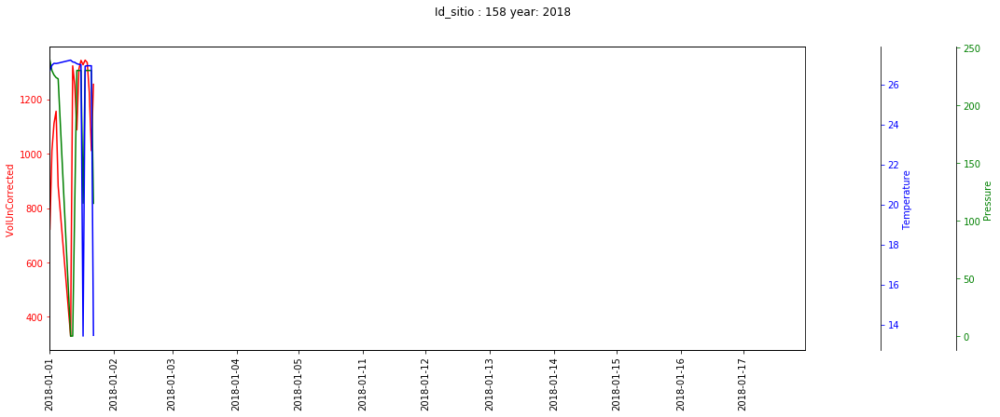

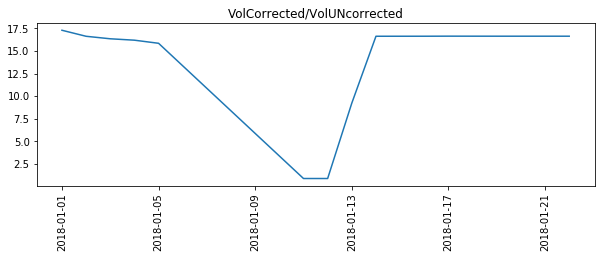

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 2 Pressure Daily_Date
2013-08-19 23:59:59   NaN
2013-08-21 23:59:59   NaN
Name: Pressure, dtype: float64
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 2 Temperature Daily_Date
2013-08-19 23:59:59   NaN
2013-08-21 23:59:59   NaN
Name: Temperature, dtype: float64


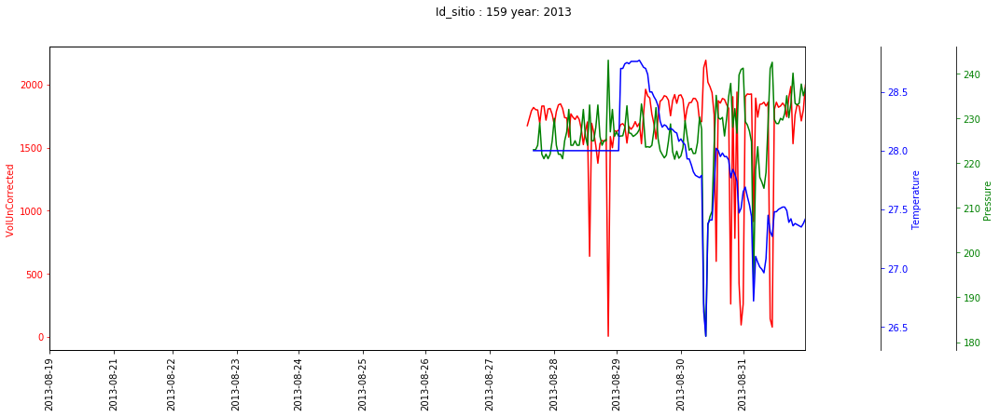

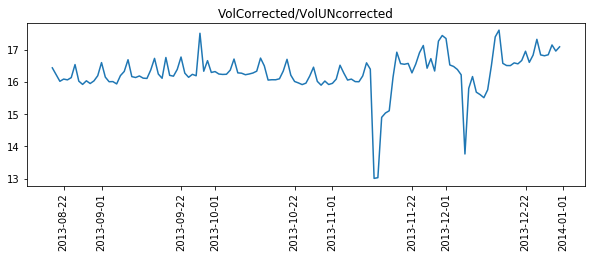

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


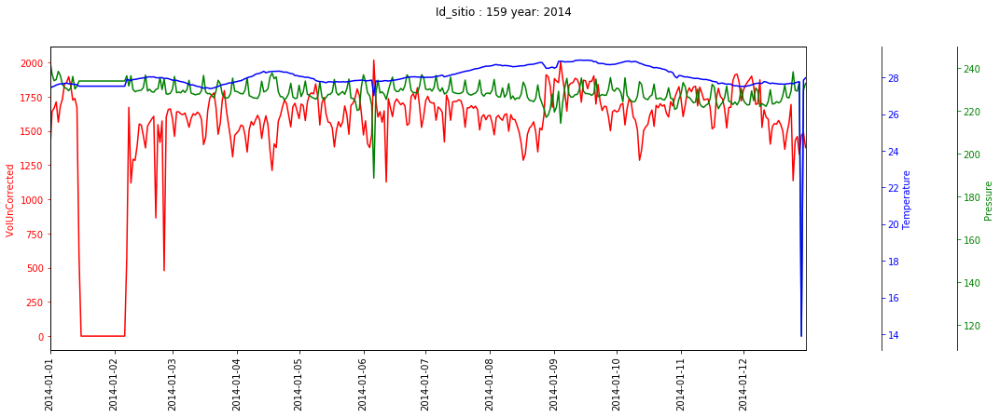

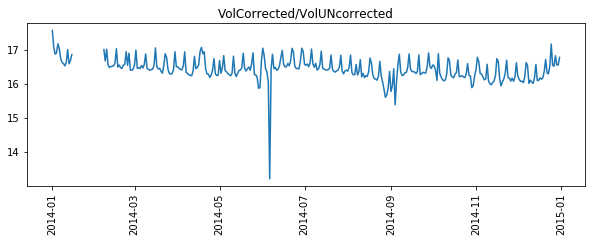

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


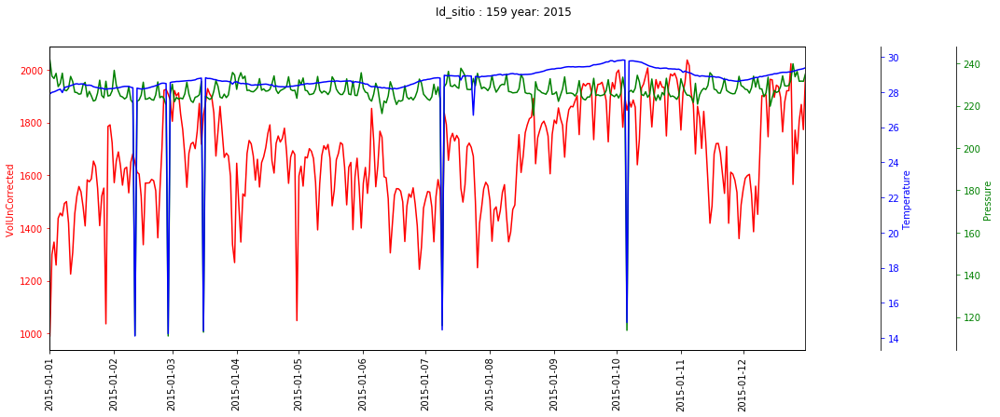

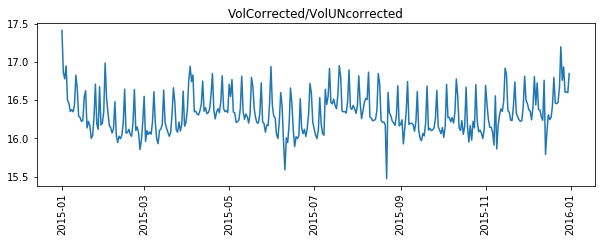

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


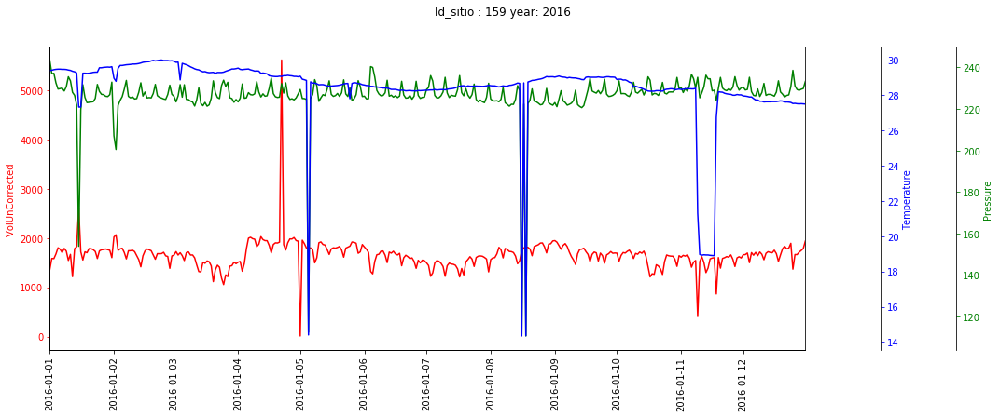

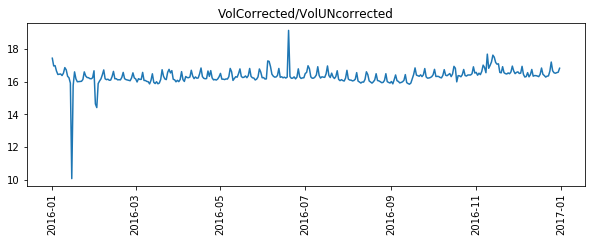

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


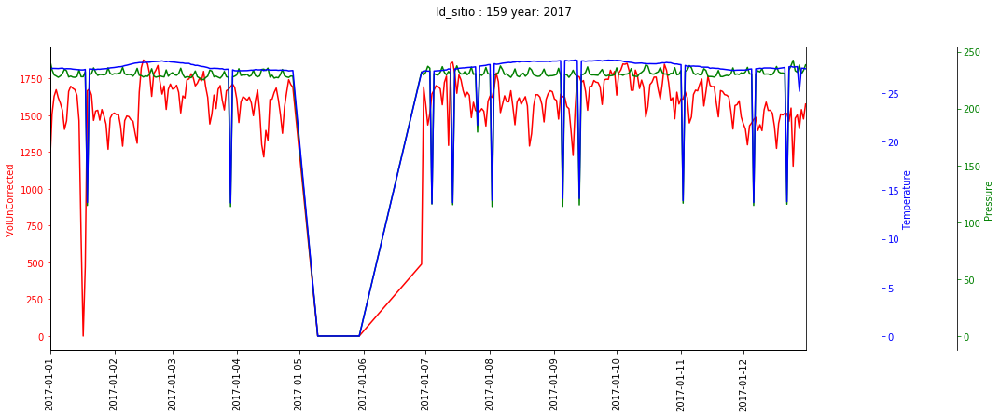

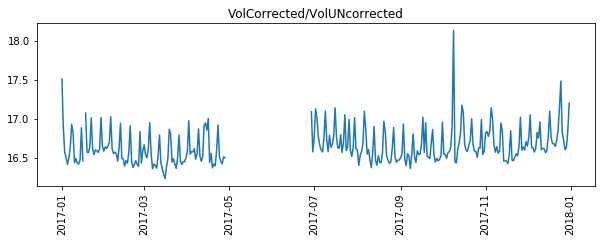

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


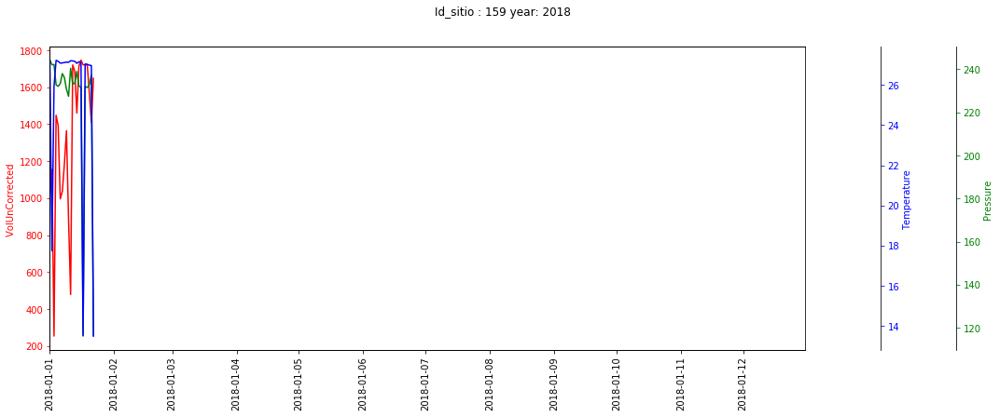

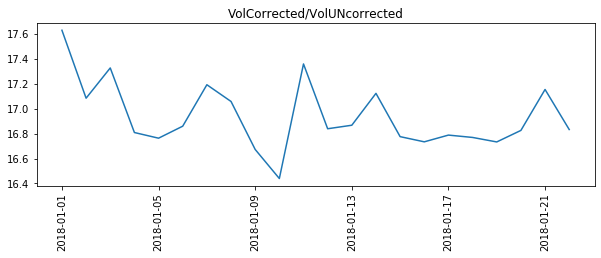

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


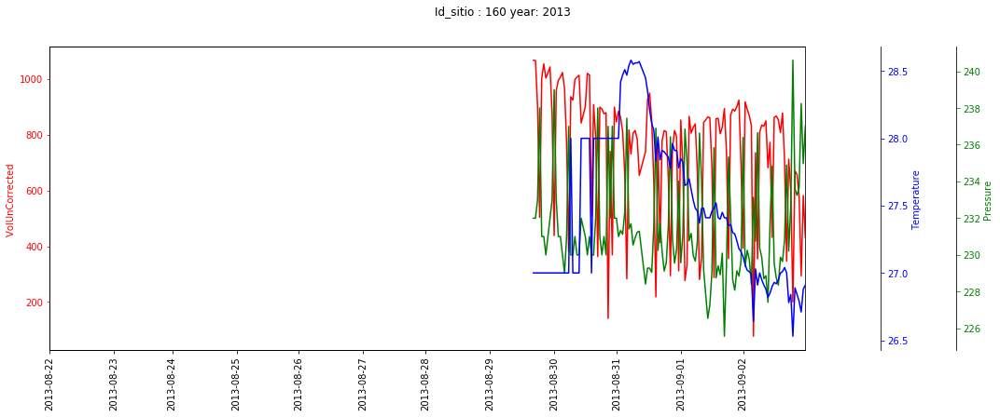

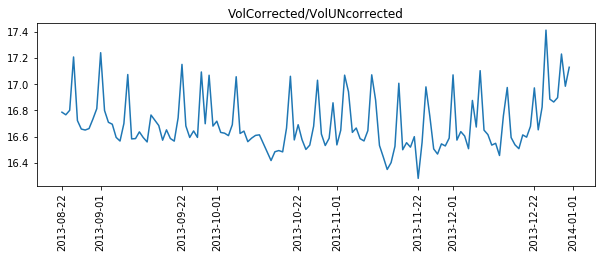

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


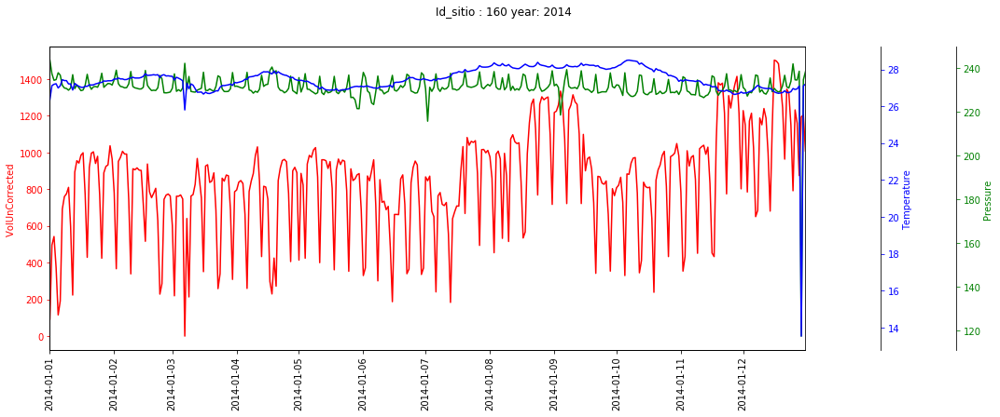

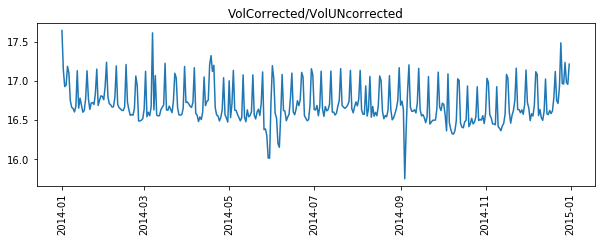

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


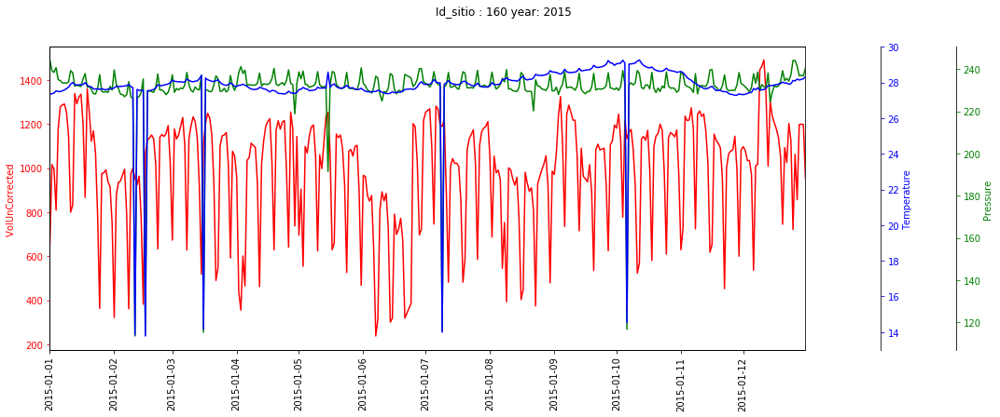

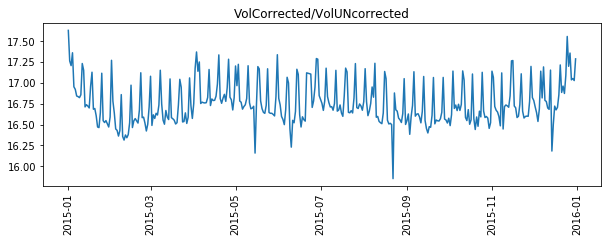

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


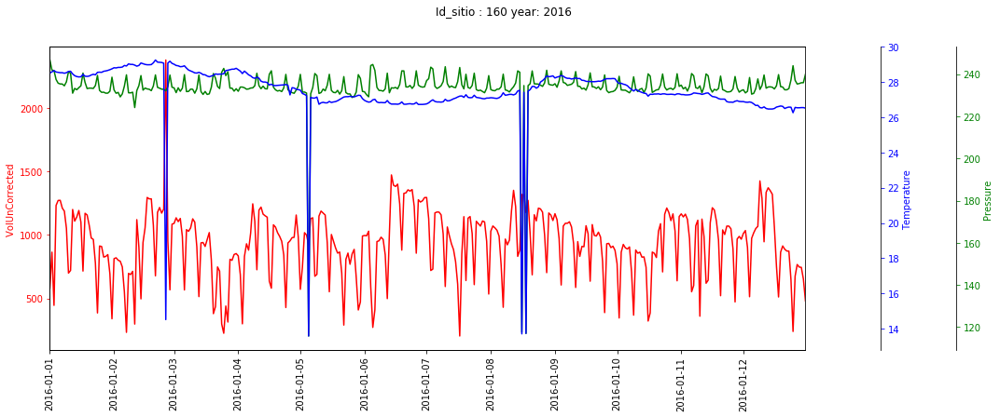

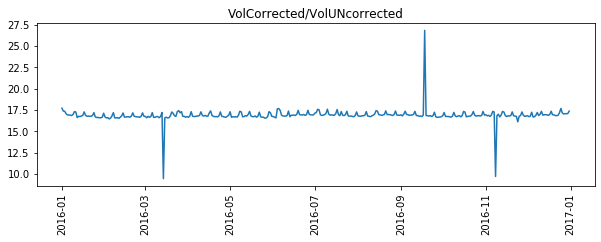

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


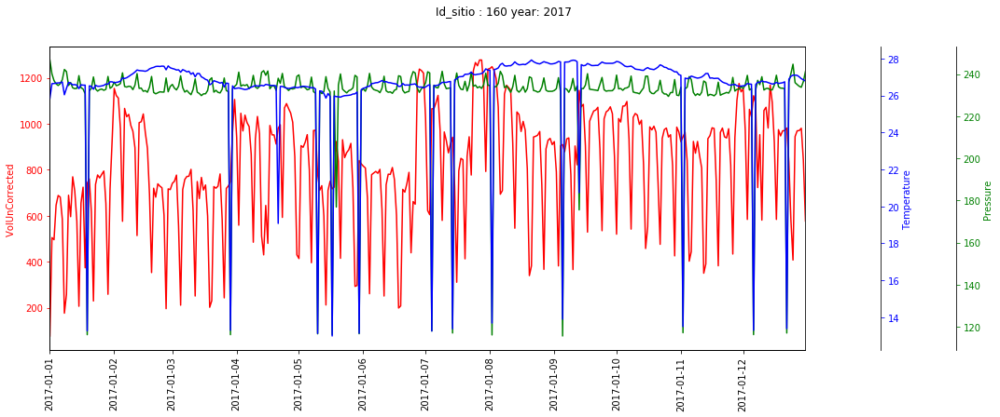

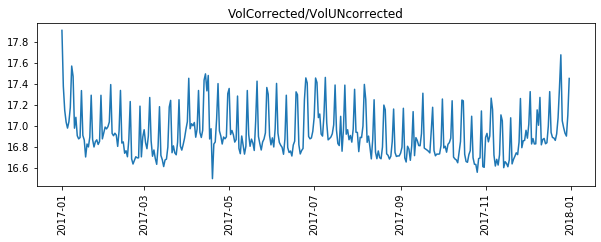

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


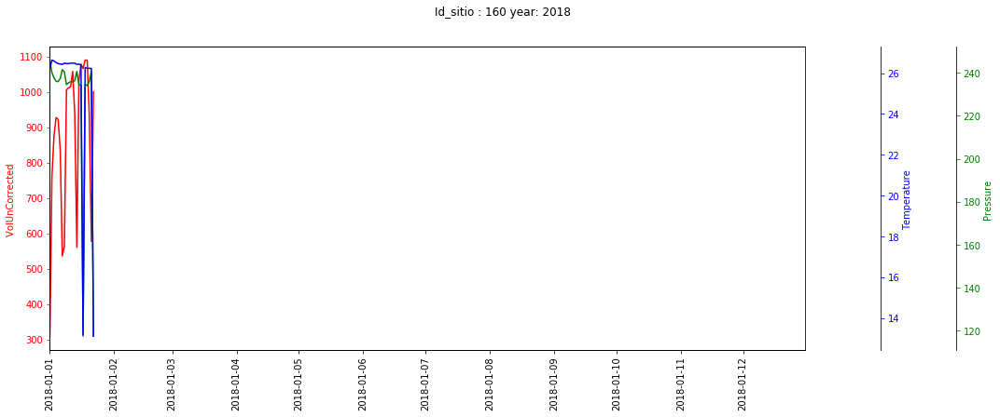

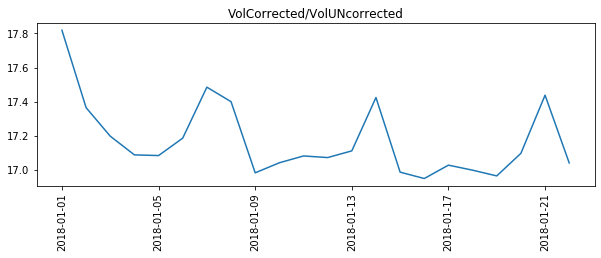

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 2 Pressure Daily_Date
2013-08-19 23:59:59   NaN
2013-08-21 23:59:59   NaN
Name: Pressure, dtype: float64
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 2 Temperature Daily_Date
2013-08-19 23:59:59   NaN
2013-08-21 23:59:59   NaN
Name: Temperature, dtype: float64


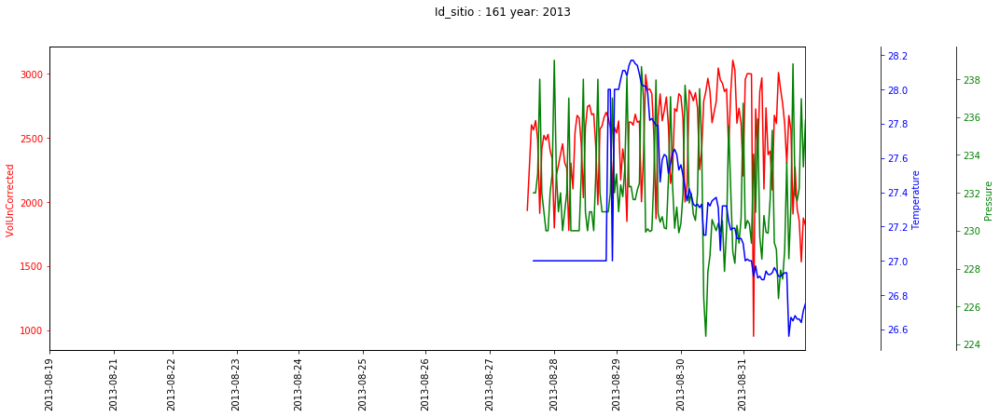

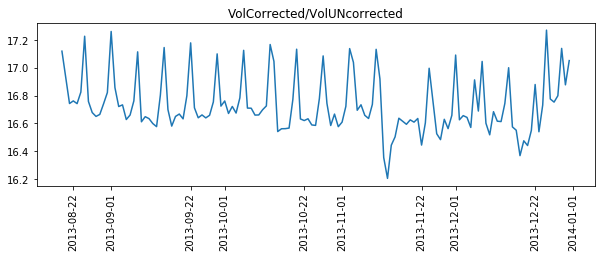

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


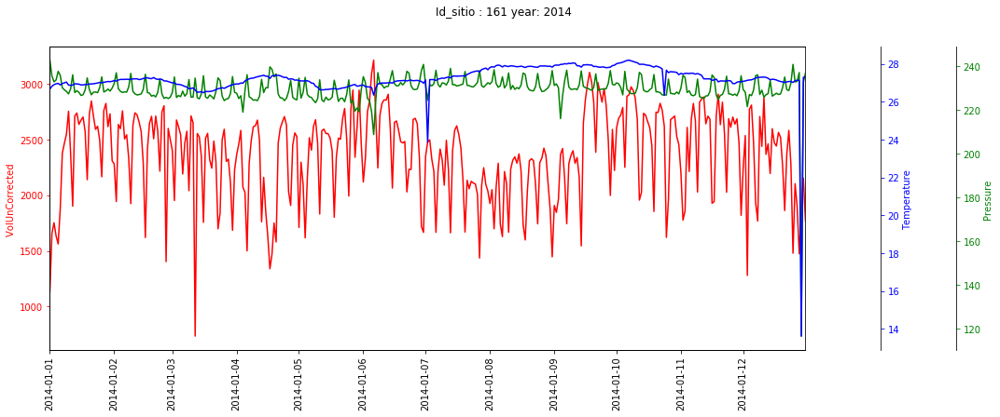

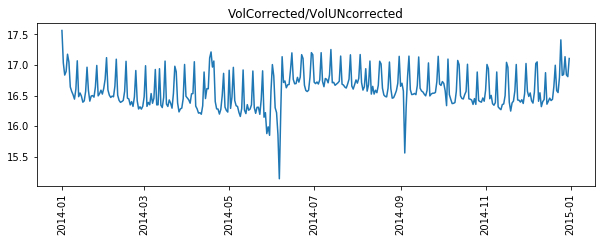

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


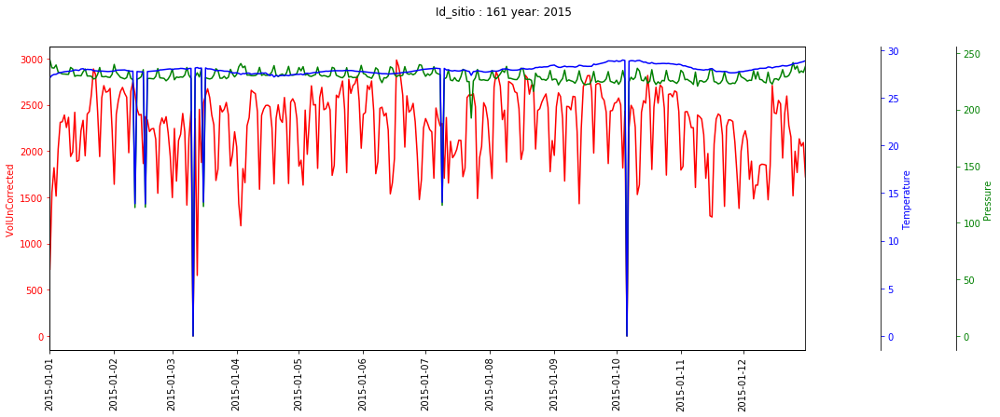

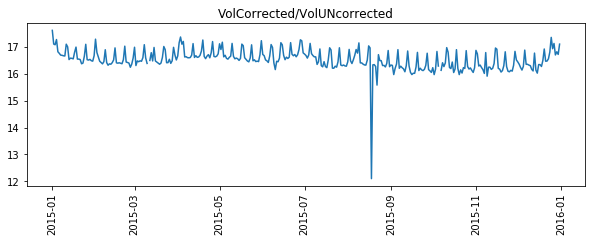

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


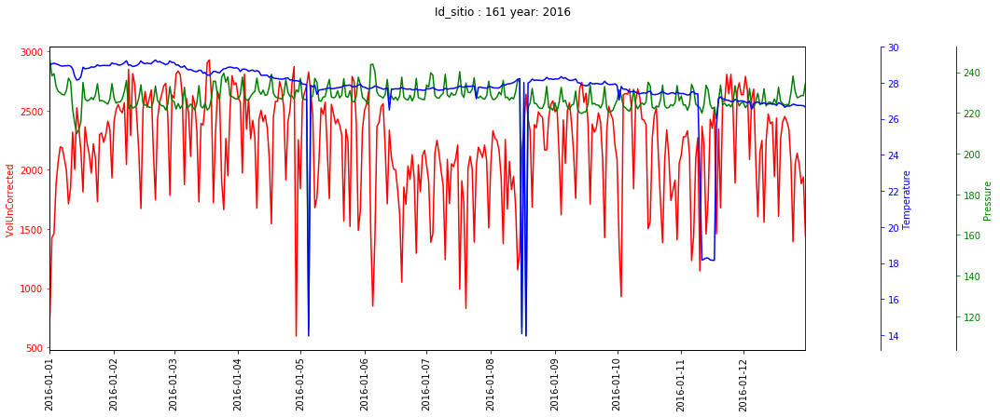

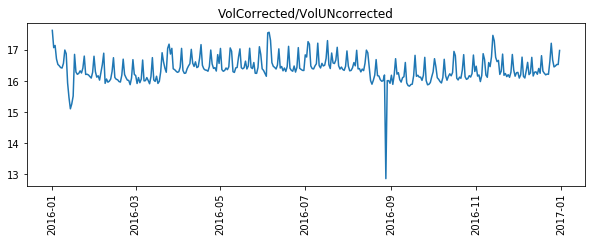

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


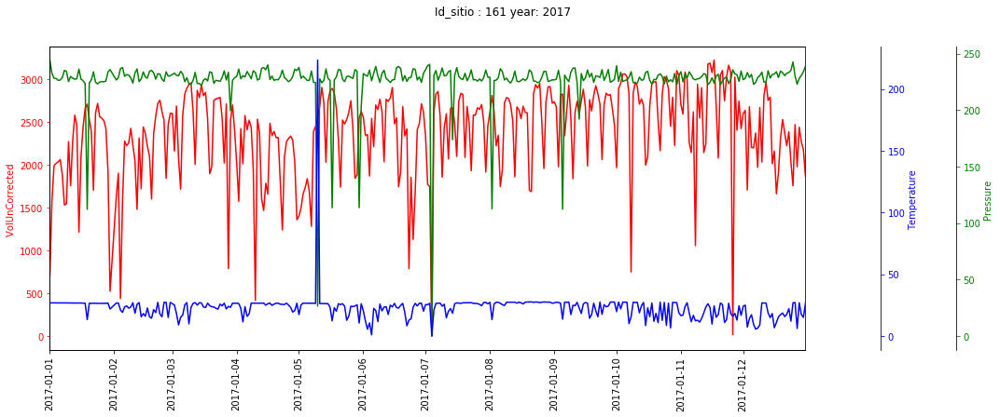

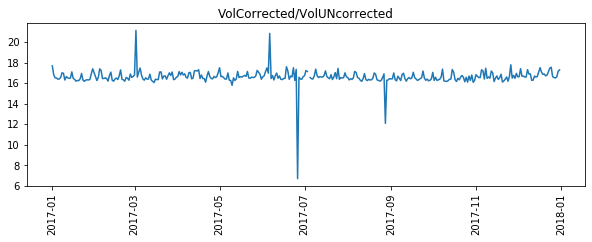

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


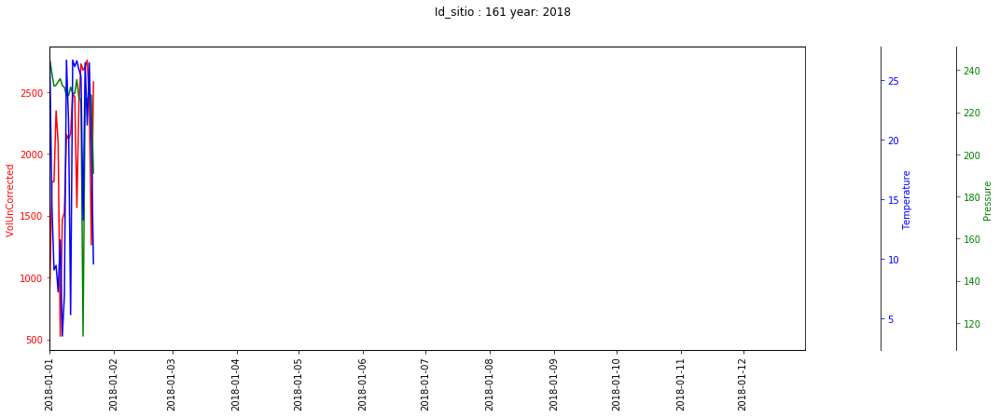

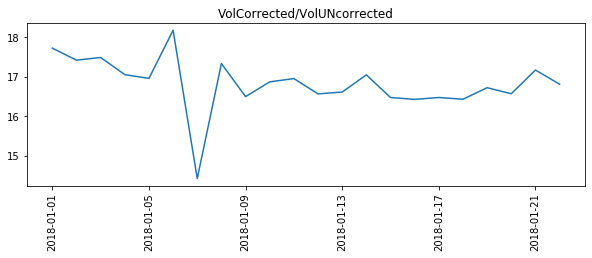

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 2 Pressure Daily_Date
2013-08-19 23:59:59   NaN
2013-08-21 23:59:59   NaN
Name: Pressure, dtype: float64
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 2 Temperature Daily_Date
2013-08-19 23:59:59   NaN
2013-08-21 23:59:59   NaN
Name: Temperature, dtype: float64


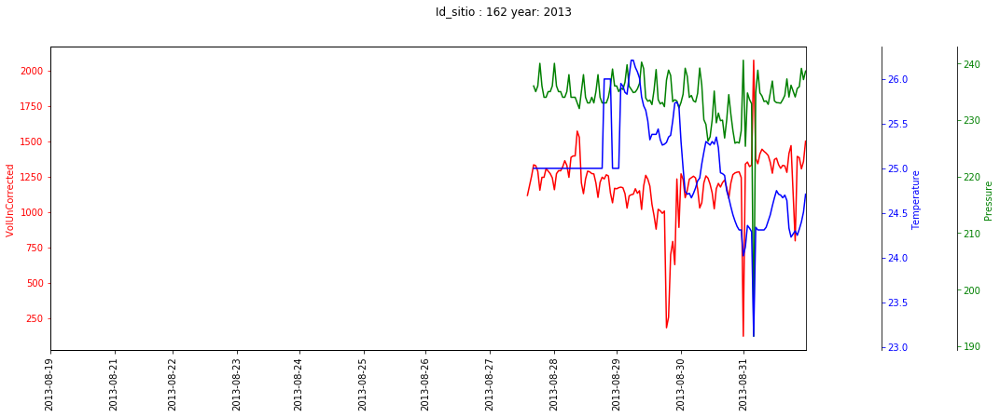

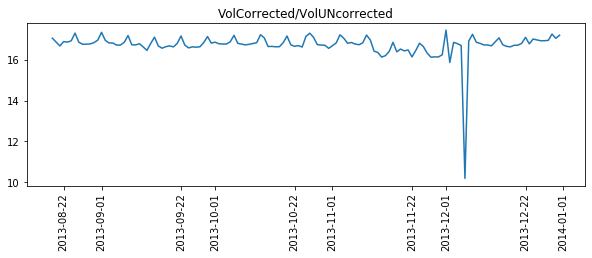

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


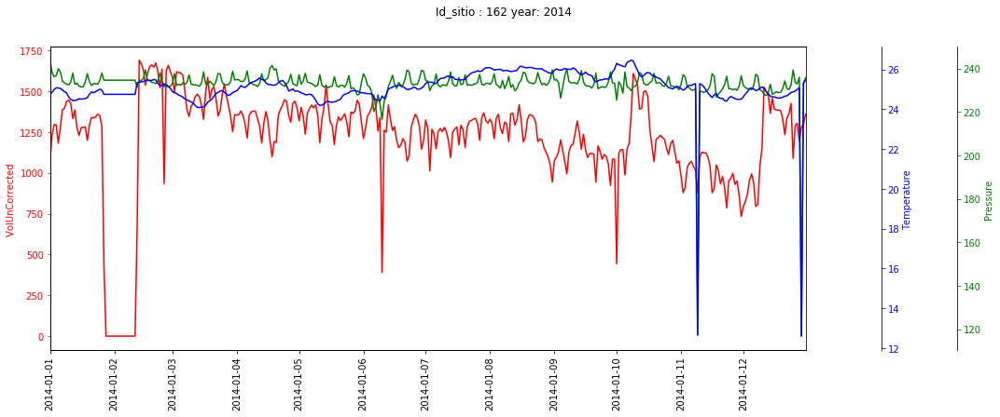

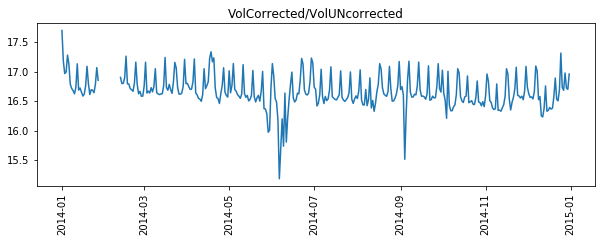

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


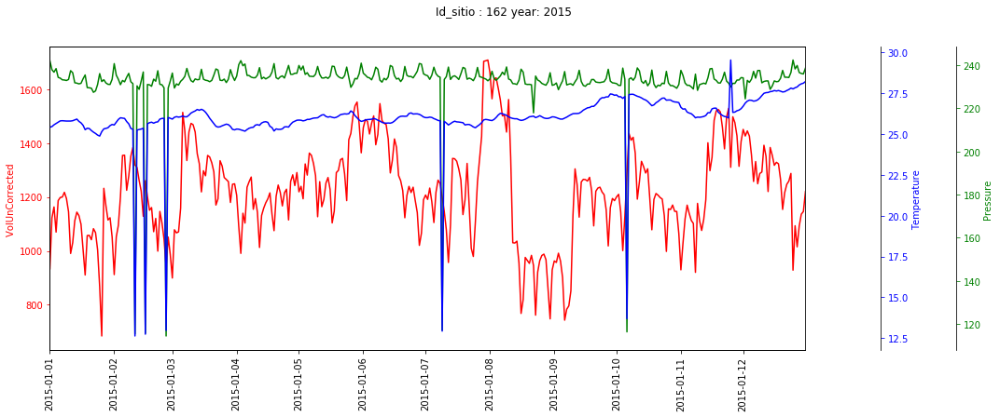

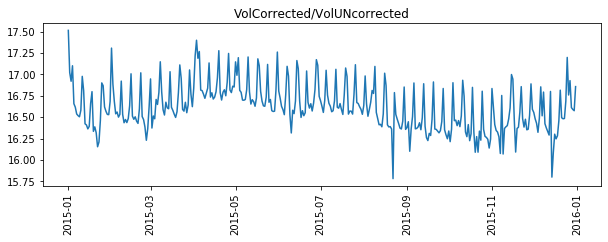

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


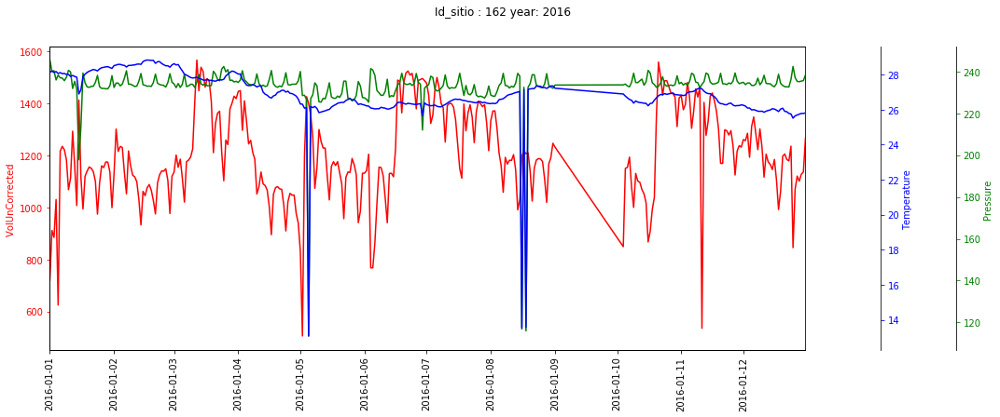

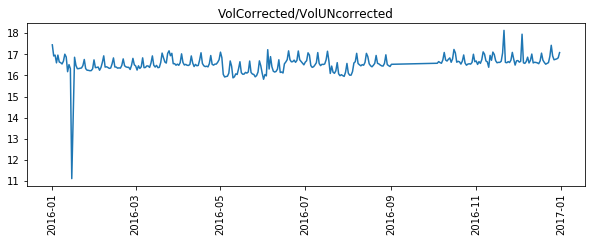

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


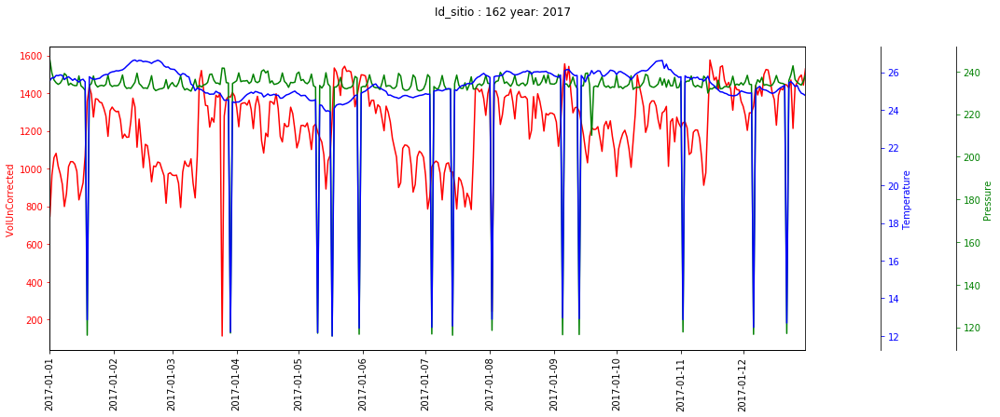

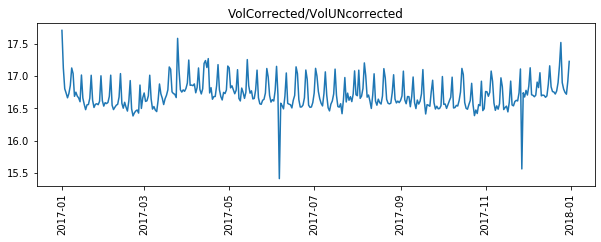

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


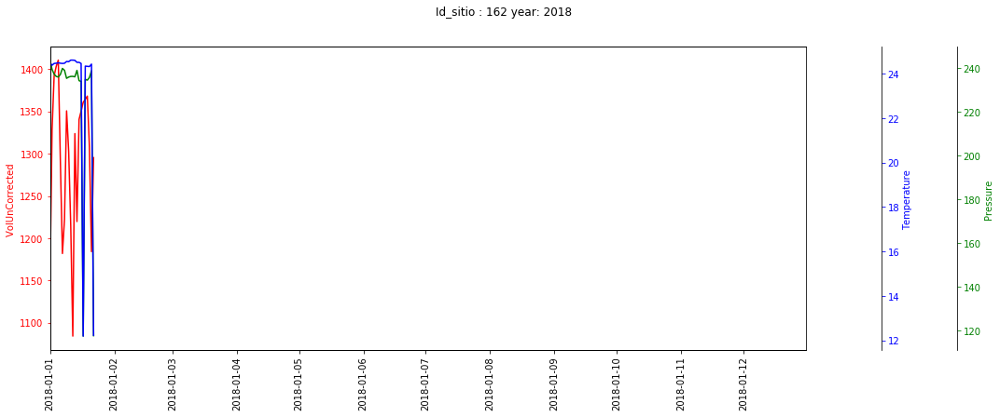

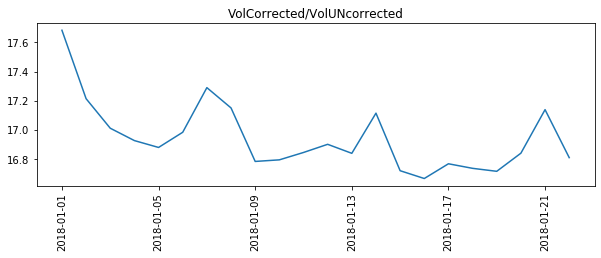

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 2 Pressure Daily_Date
2013-08-19 23:59:59   NaN
2013-08-21 23:59:59   NaN
Name: Pressure, dtype: float64
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 2 Temperature Daily_Date
2013-08-19 23:59:59   NaN
2013-08-21 23:59:59   NaN
Name: Temperature, dtype: float64


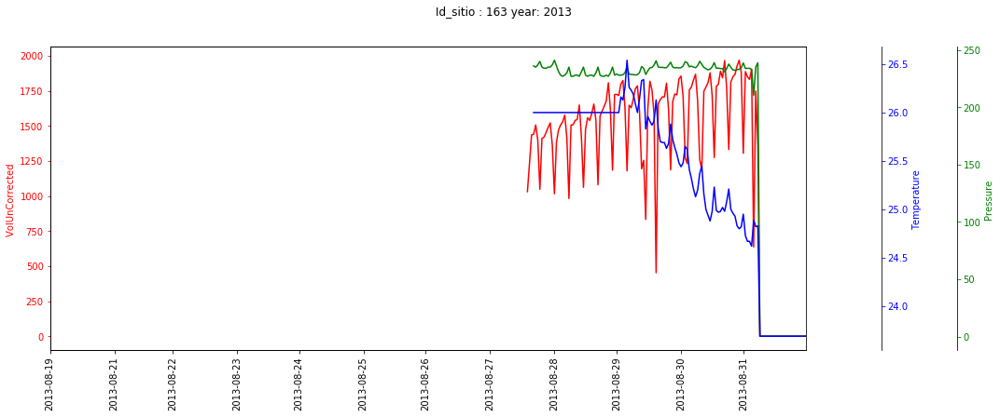

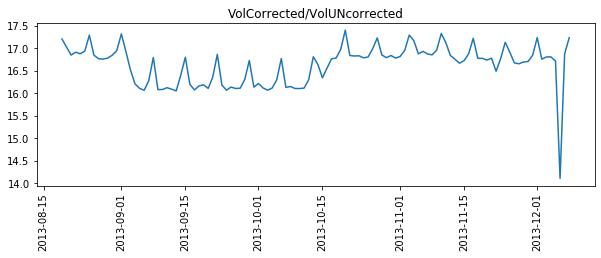

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


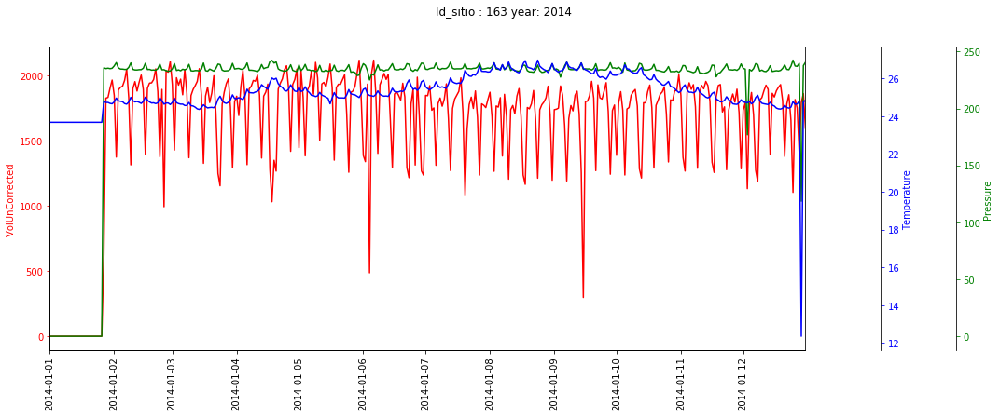

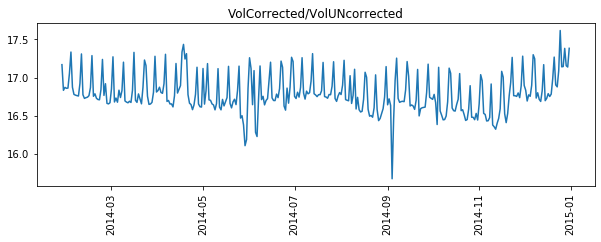

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


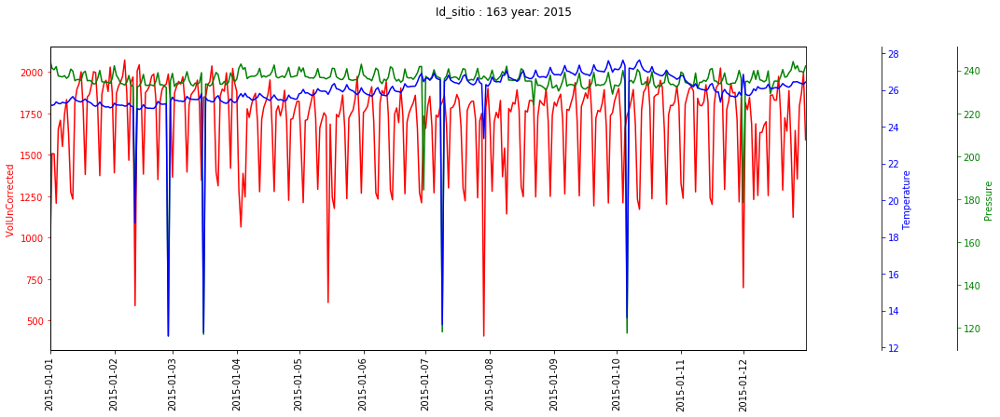

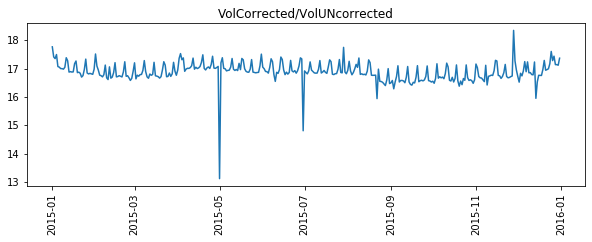

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


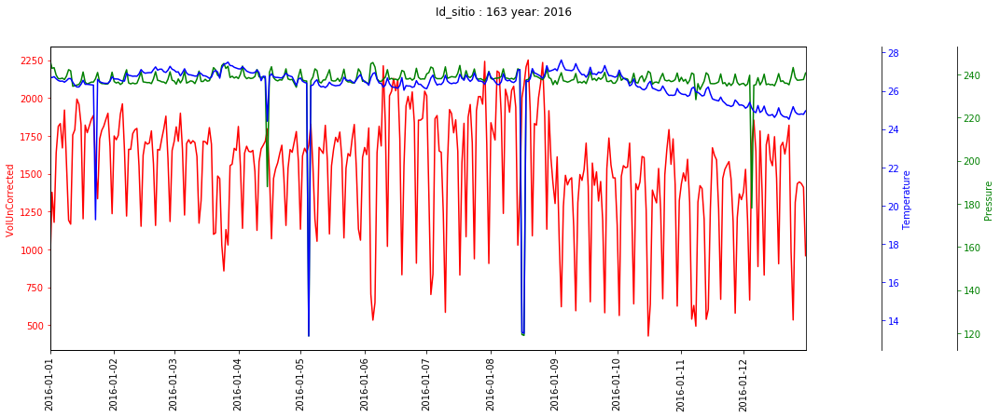

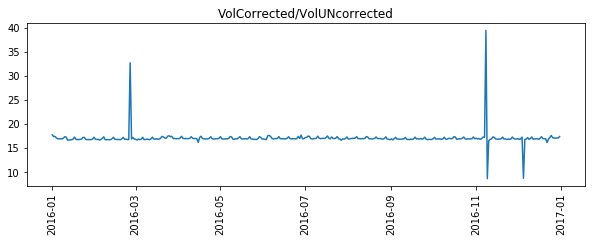

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


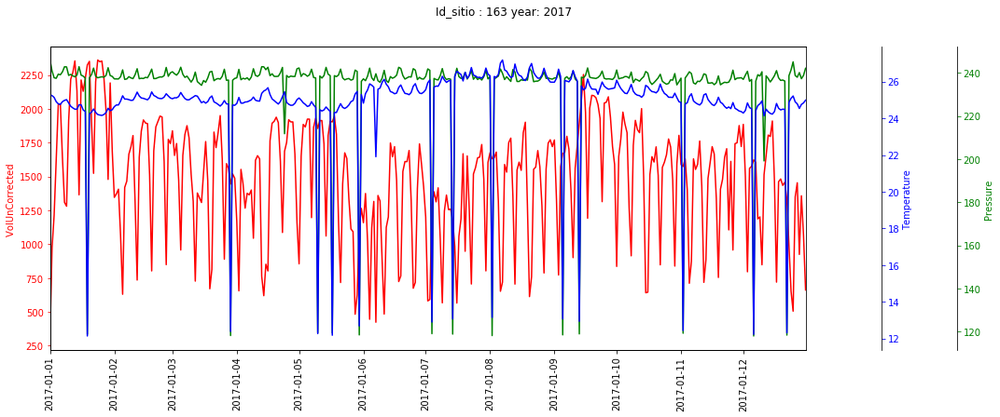

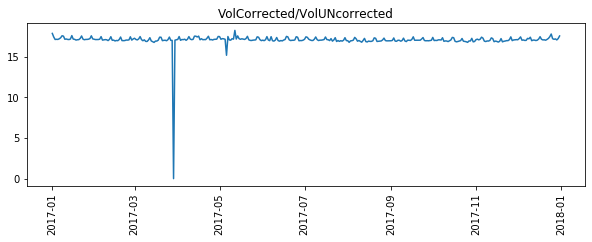

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


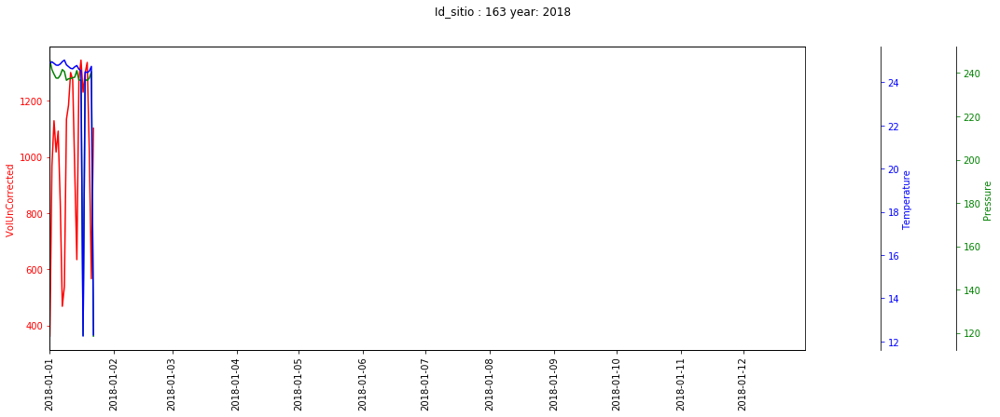

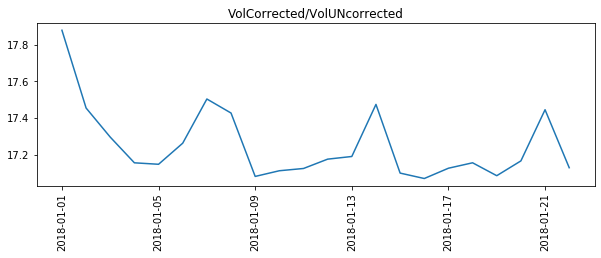

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 2 Pressure Daily_Date
2013-08-19 23:59:59   NaN
2013-08-21 23:59:59   NaN
Name: Pressure, dtype: float64
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 2 Temperature Daily_Date
2013-08-19 23:59:59   NaN
2013-08-21 23:59:59   NaN
Name: Temperature, dtype: float64


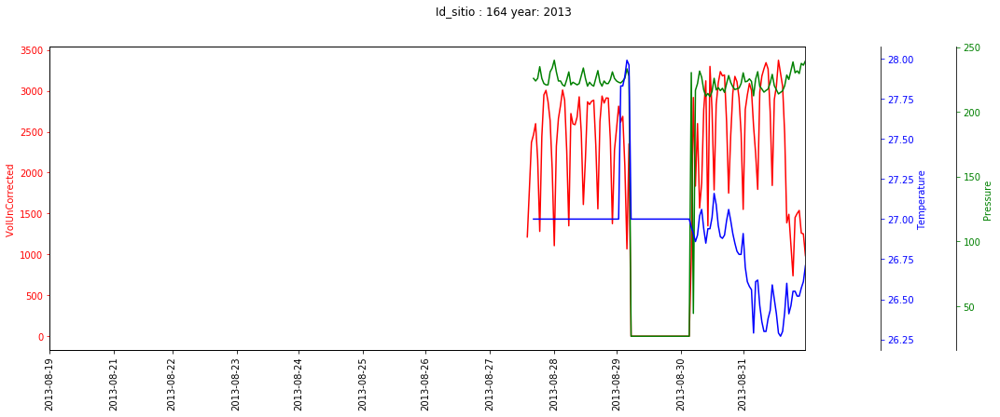

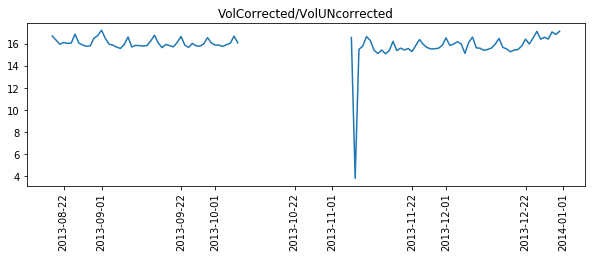

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


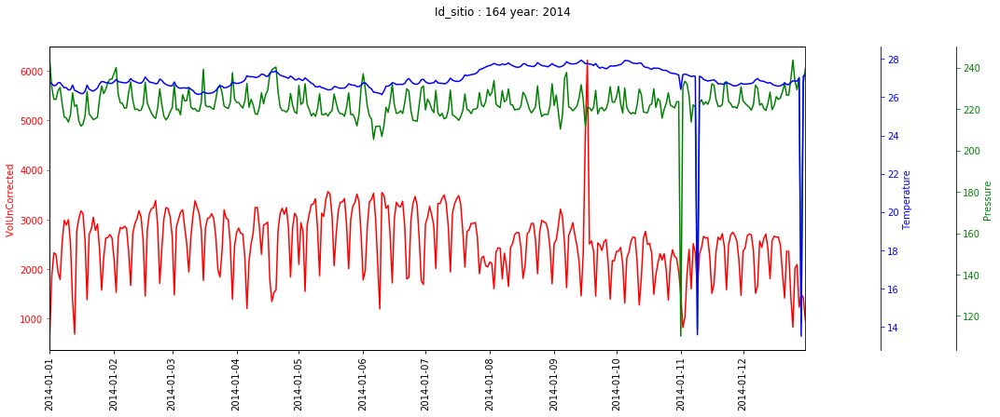

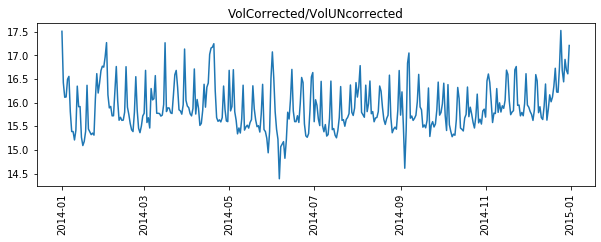

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


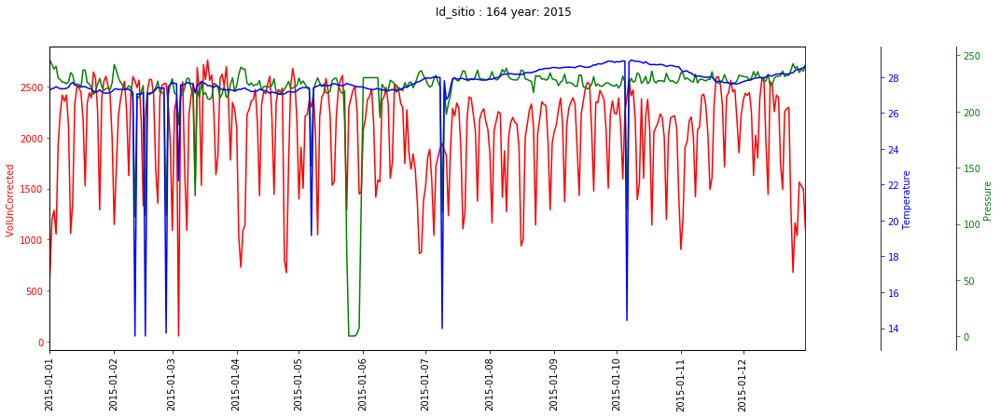

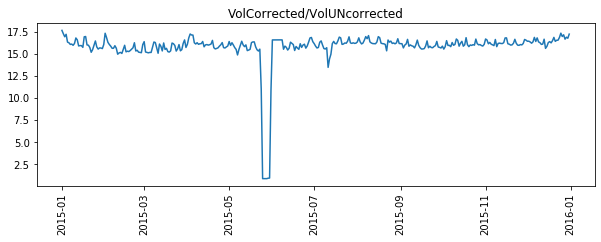

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


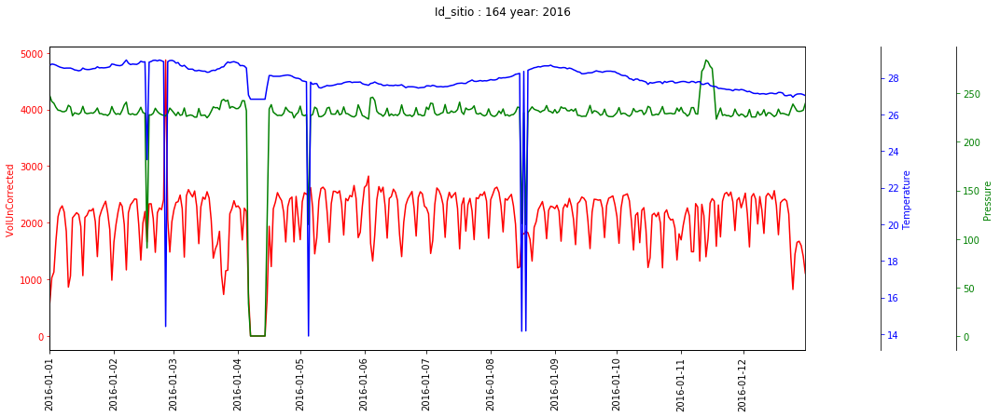

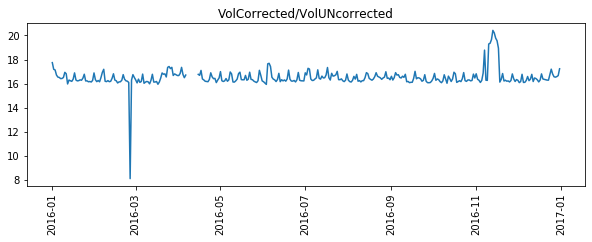

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


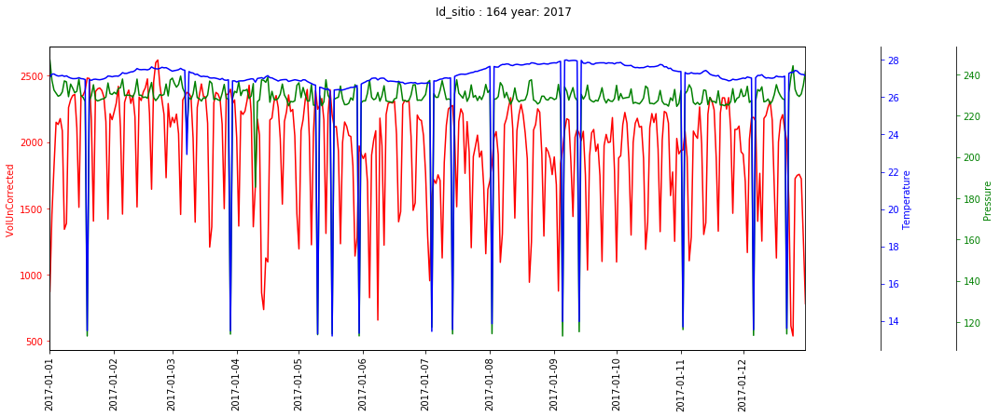

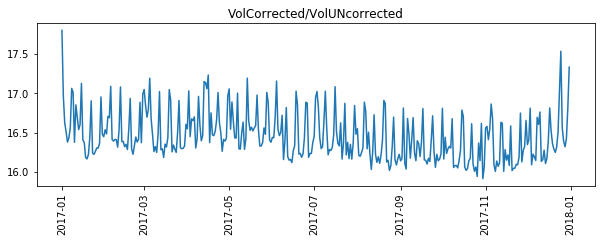

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


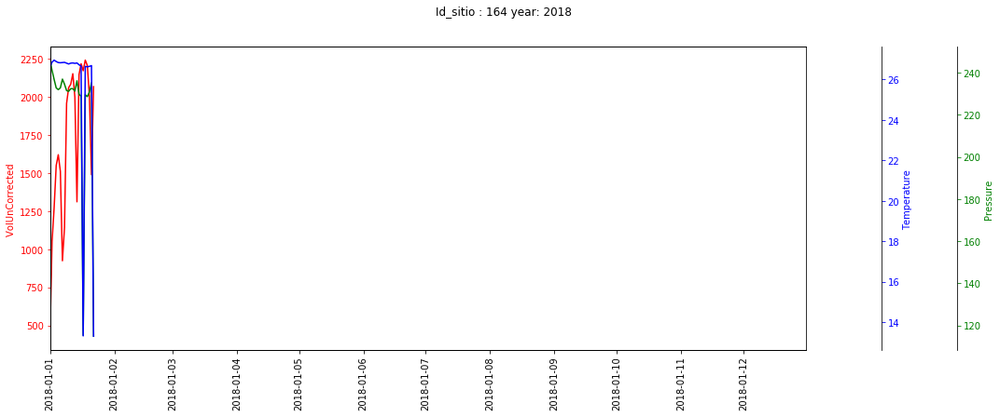

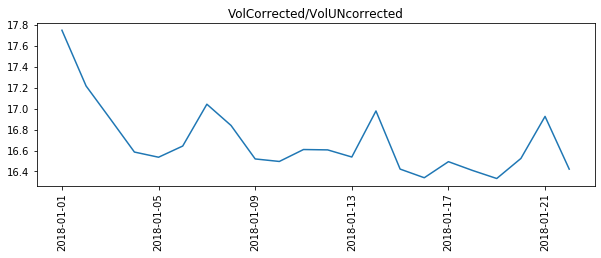

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 4 Pressure Daily_Date
2013-08-19 23:59:59   NaN
2013-08-21 23:59:59   NaN
2013-12-29 23:59:59   NaN
2013-12-30 23:59:59   NaN
Name: Pressure, dtype: float64
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 4 Temperature Daily_Date
2013-08-19 23:59:59   NaN
2013-08-21 23:59:59   NaN
2013-12-29 23:59:59   NaN
2013-12-30 23:59:59   NaN
Name: Temperature, dtype: float64


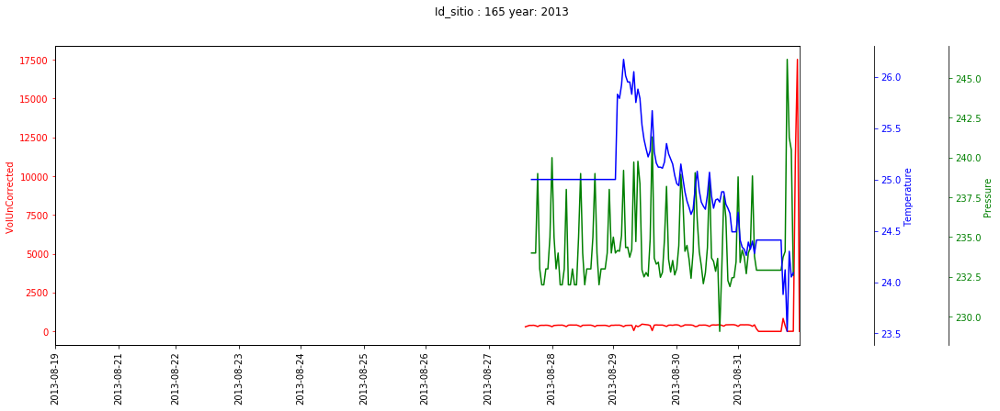

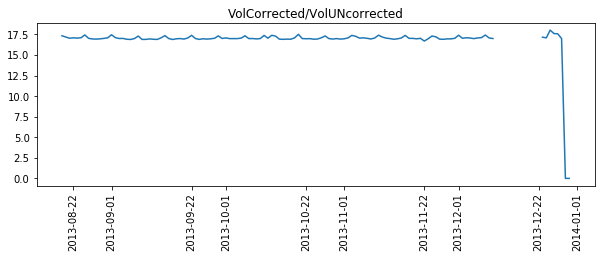

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


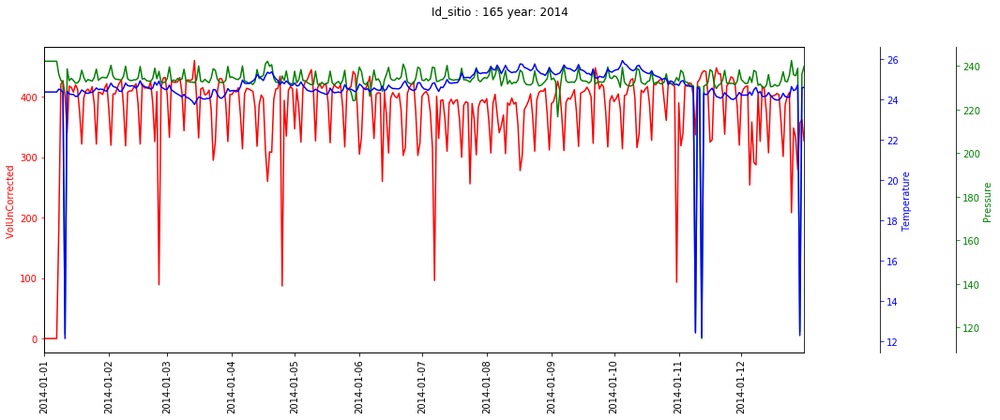

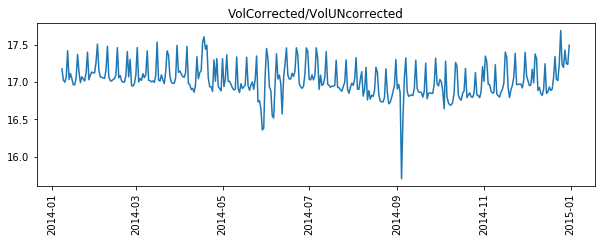

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


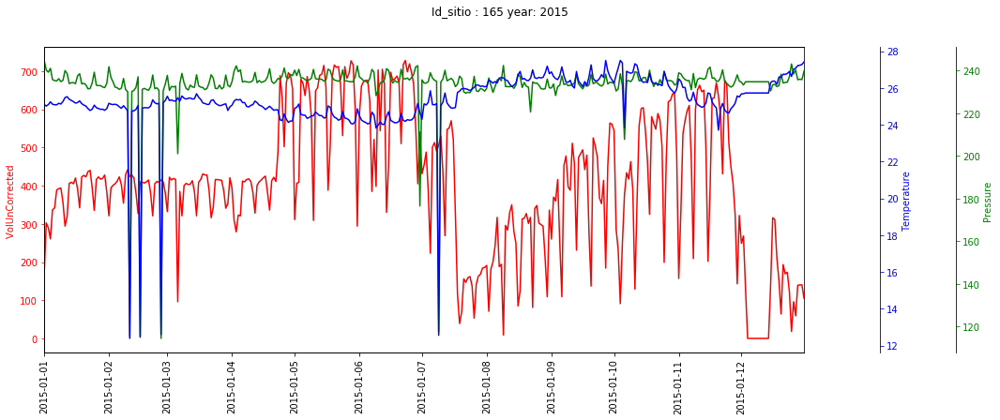

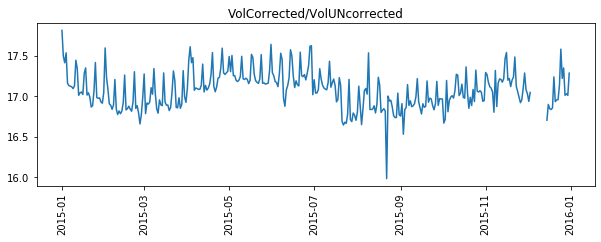

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


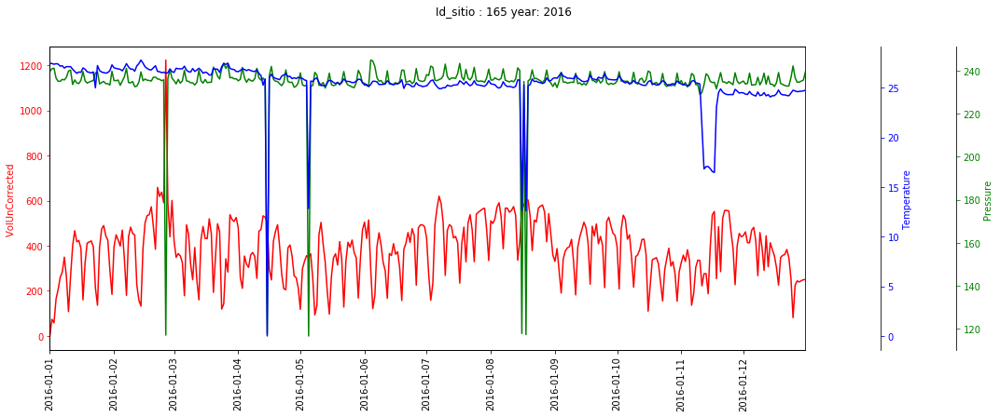

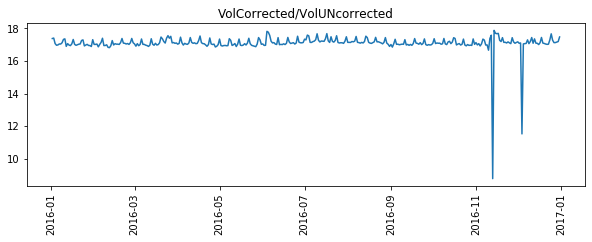

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


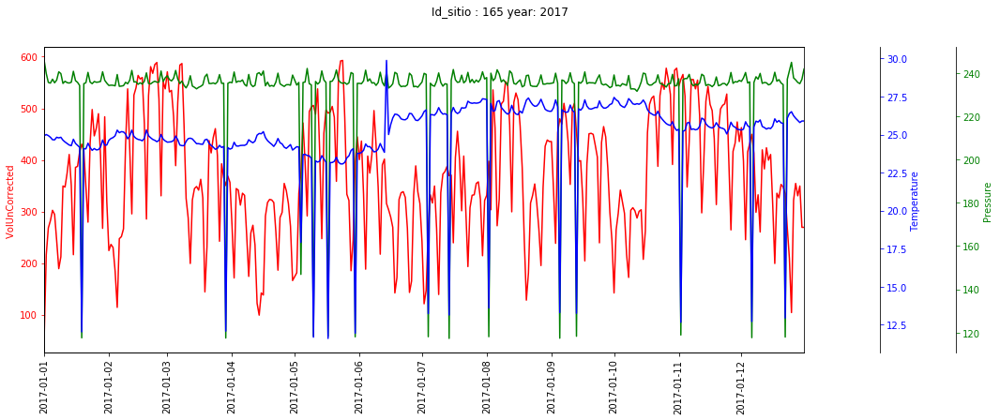

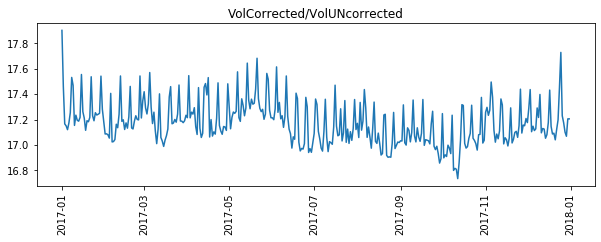

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


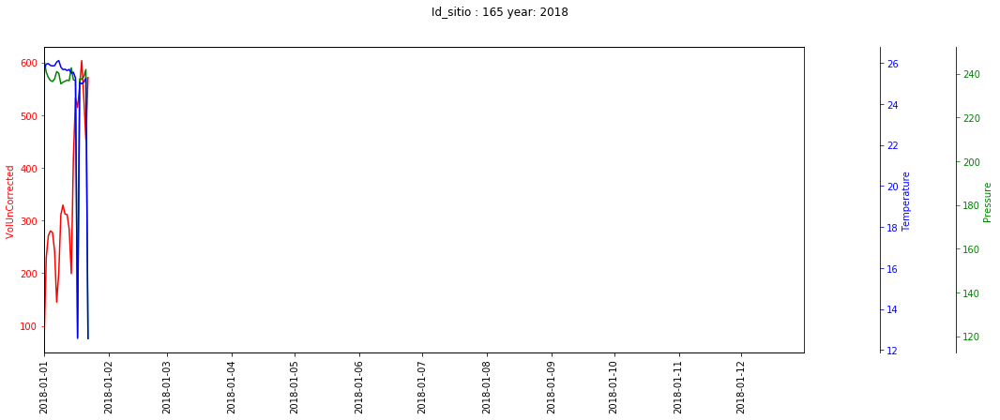

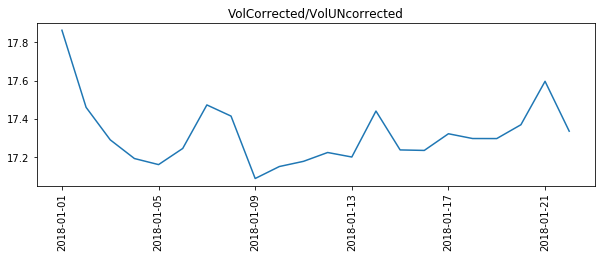

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 2 Pressure Daily_Date
2013-08-19 23:59:59   NaN
2013-08-21 23:59:59   NaN
Name: Pressure, dtype: float64
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 2 Temperature Daily_Date
2013-08-19 23:59:59   NaN
2013-08-21 23:59:59   NaN
Name: Temperature, dtype: float64


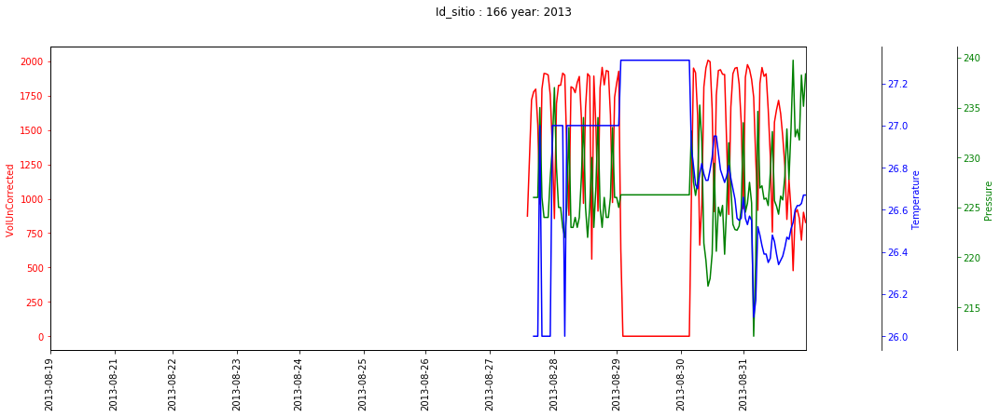

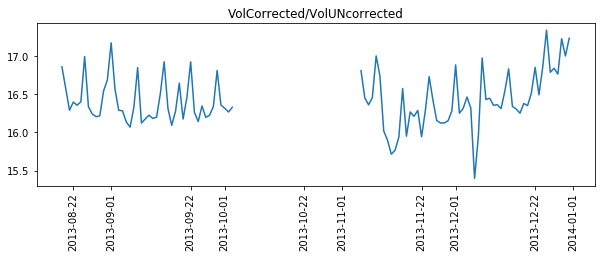

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


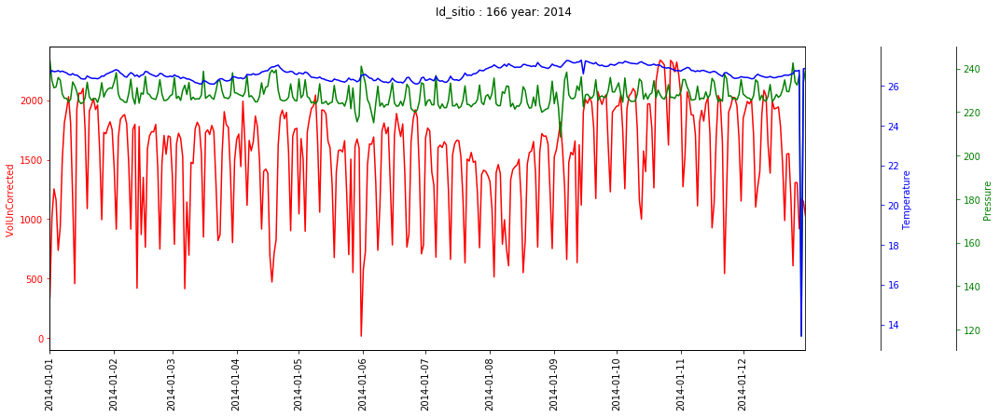

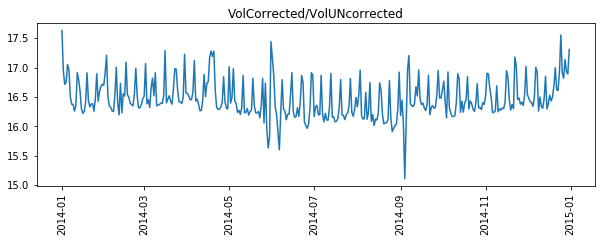

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


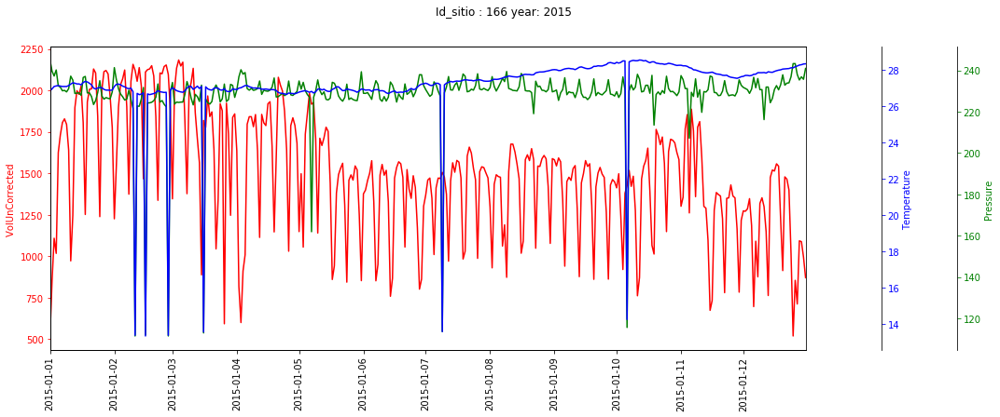

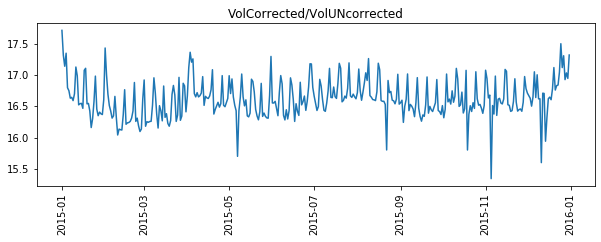

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


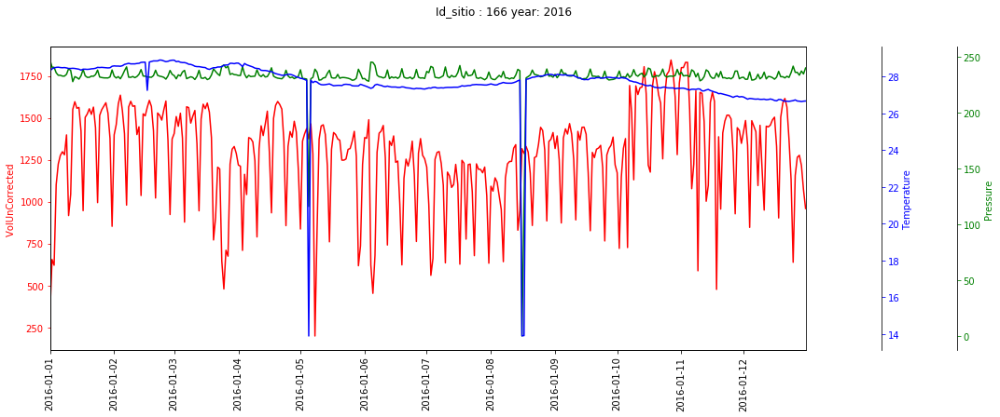

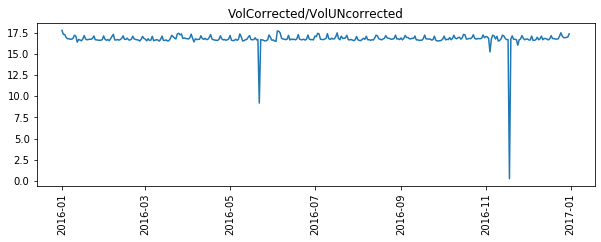

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


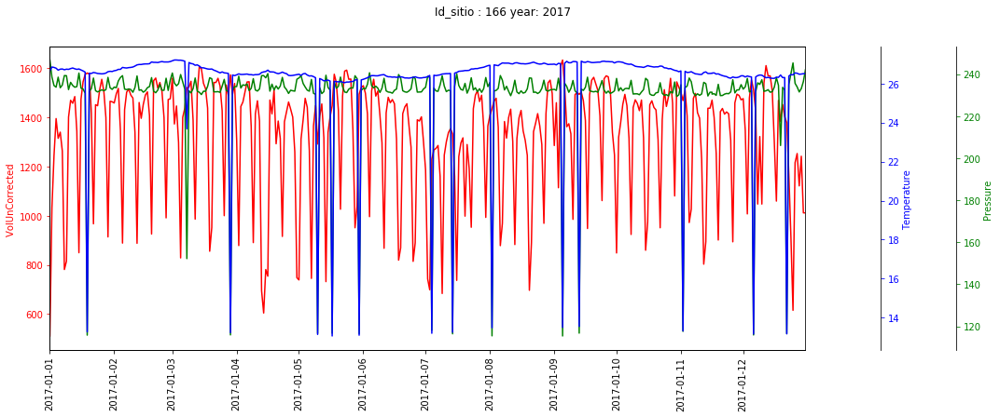

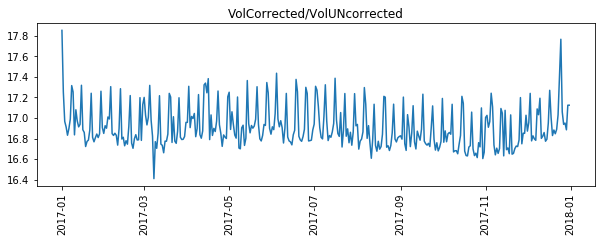

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


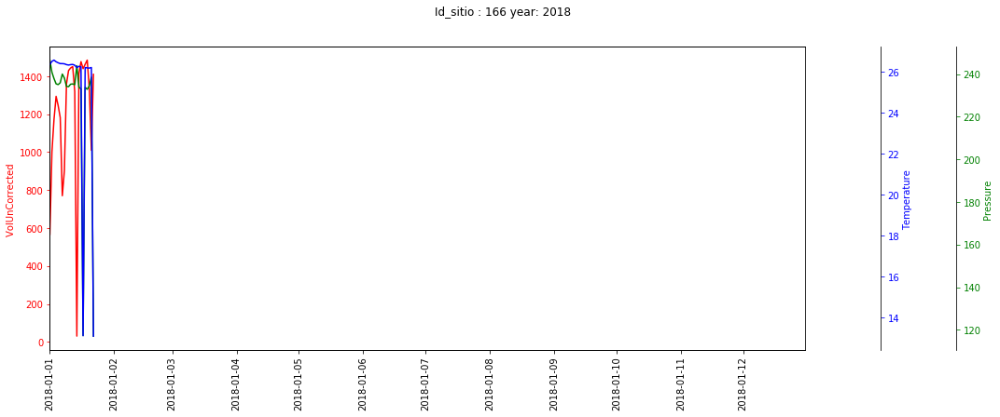

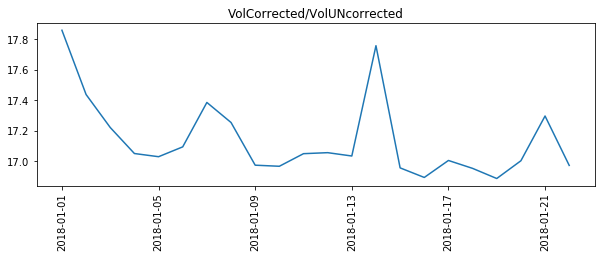

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 1 Pressure Daily_Date
2013-08-21 23:59:59   NaN
Name: Pressure, dtype: float64
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 1 Temperature Daily_Date
2013-08-21 23:59:59   NaN
Name: Temperature, dtype: float64


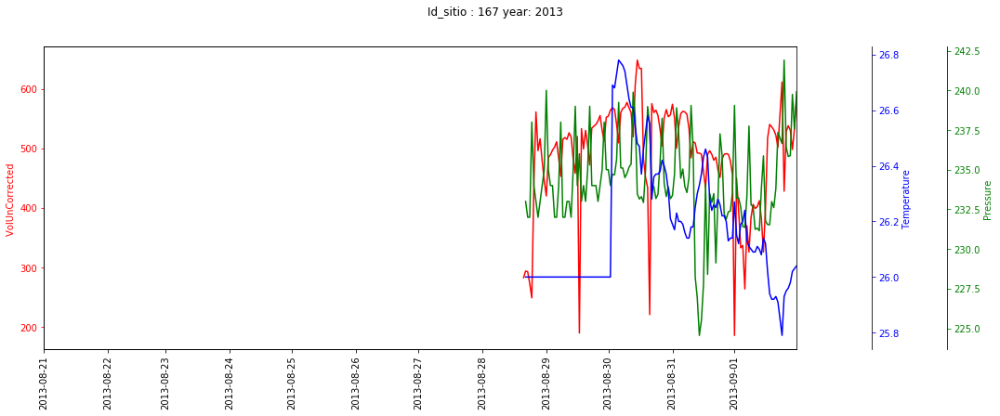

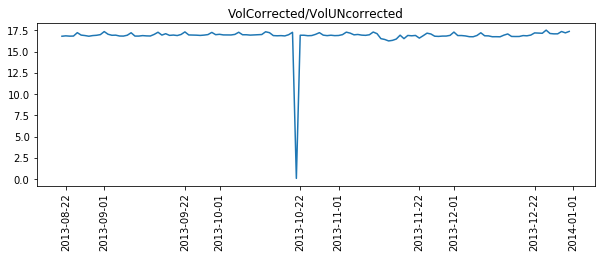

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


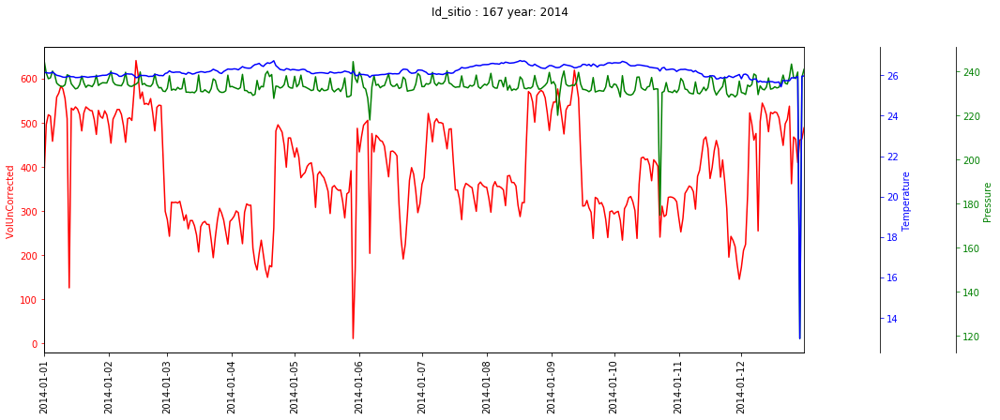

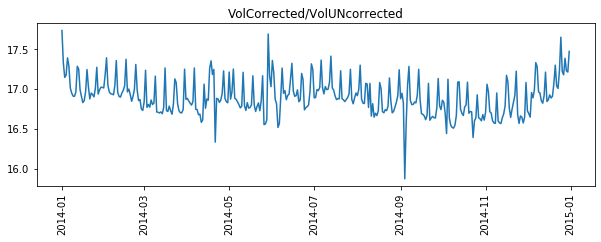

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


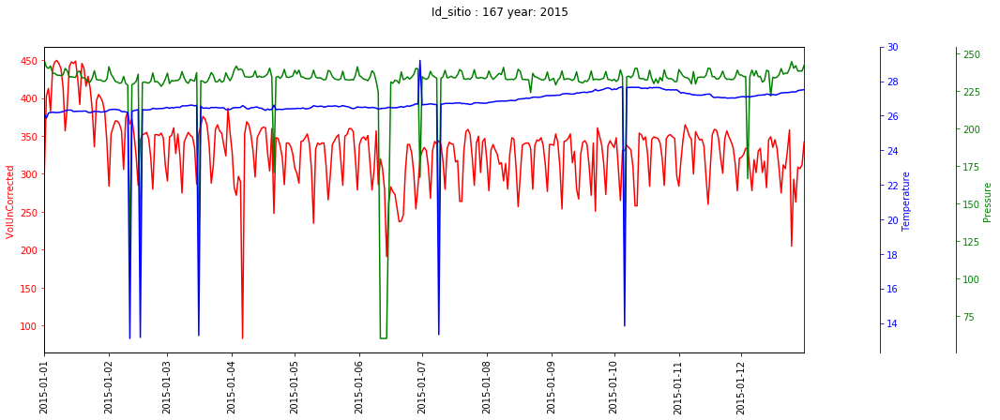

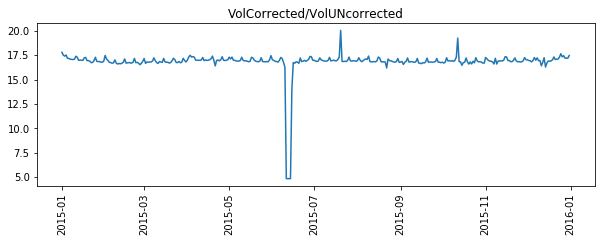

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


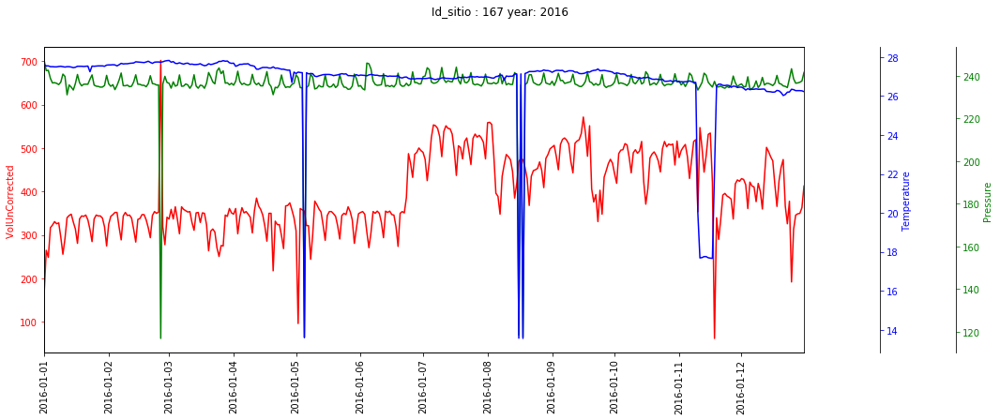

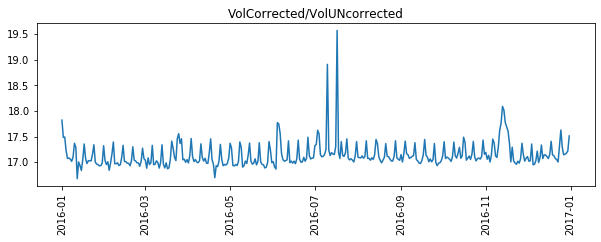

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


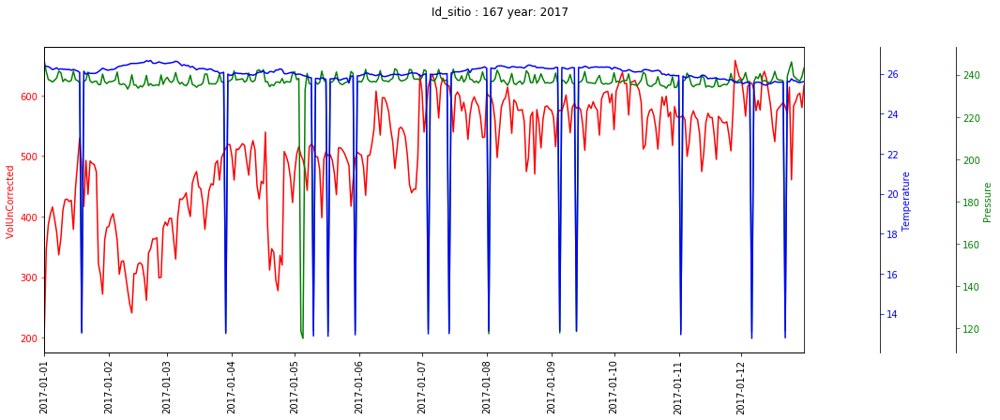

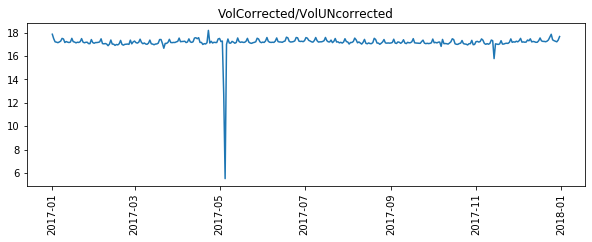

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


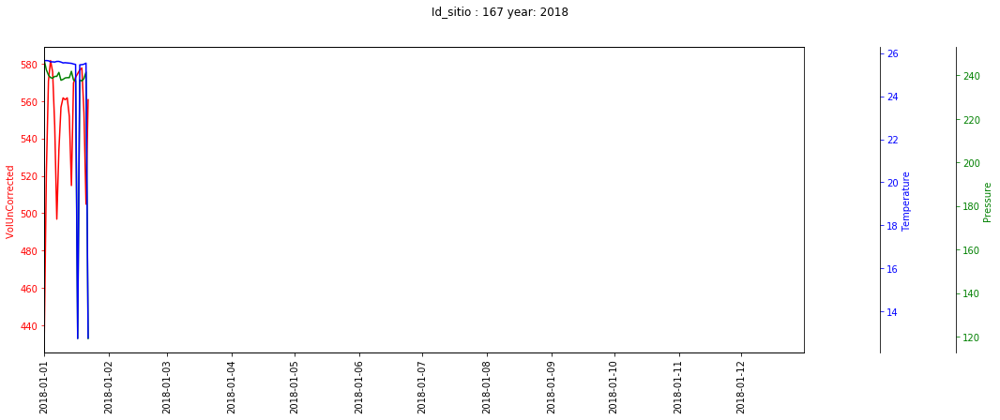

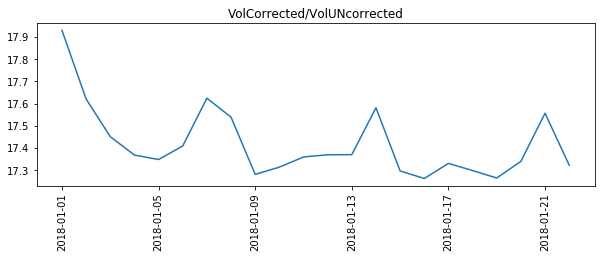

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 2 Pressure Daily_Date
2013-08-19 23:59:59   NaN
2013-08-21 23:59:59   NaN
Name: Pressure, dtype: float64
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 2 Temperature Daily_Date
2013-08-19 23:59:59   NaN
2013-08-21 23:59:59   NaN
Name: Temperature, dtype: float64


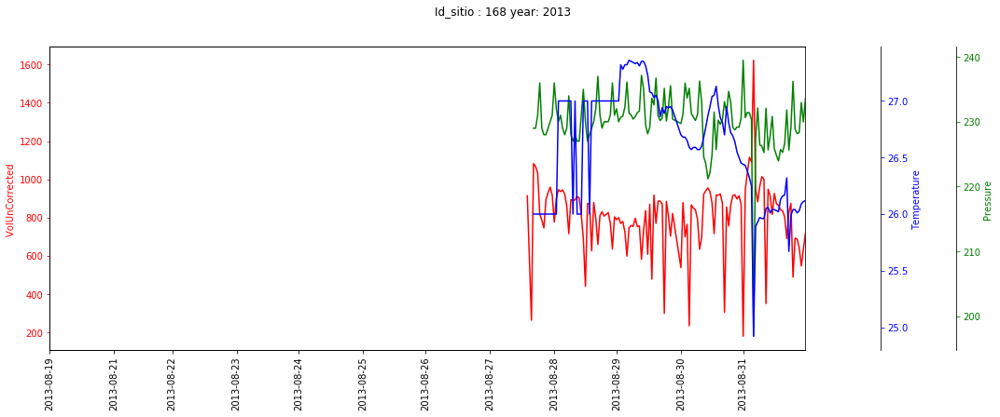

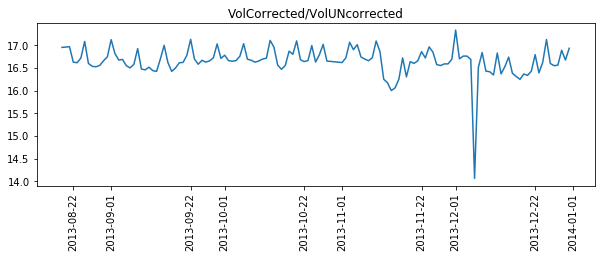

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


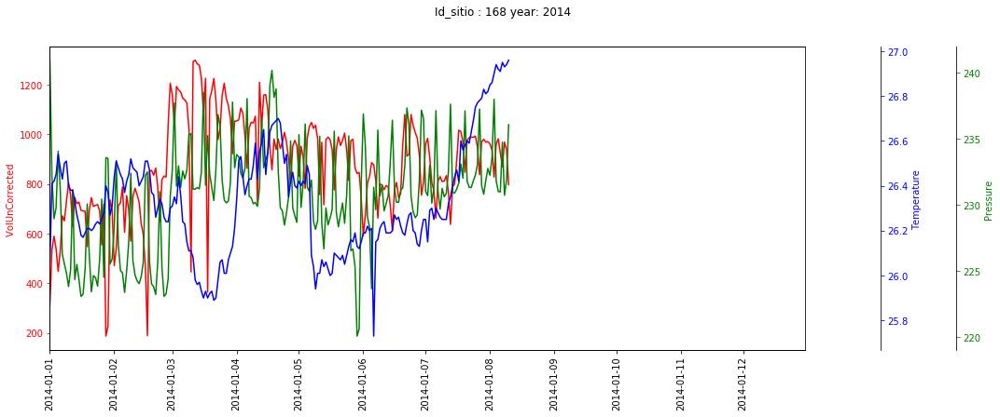

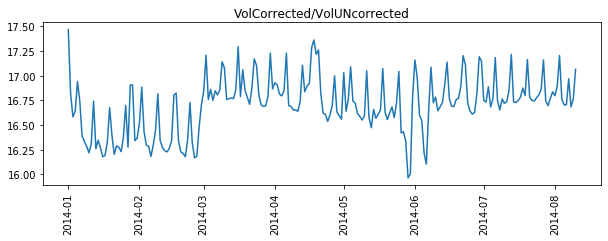

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


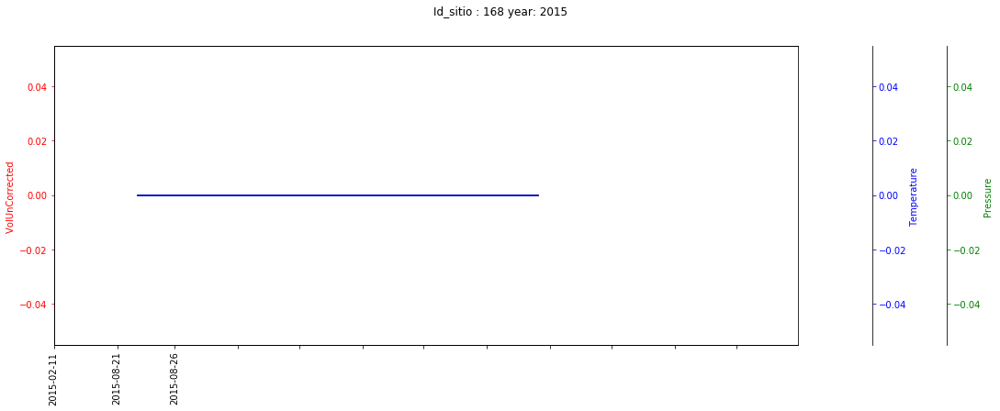

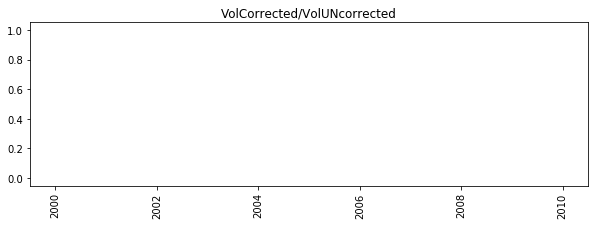

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


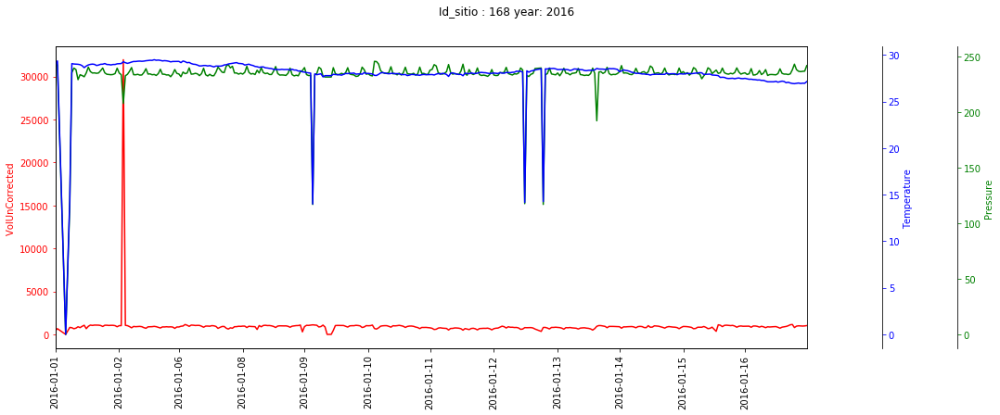

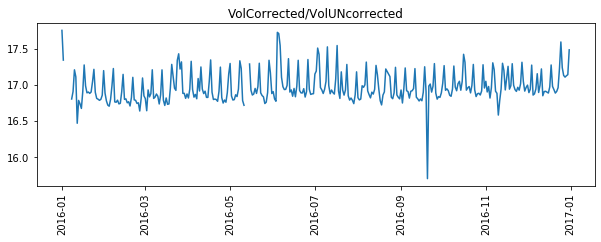

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


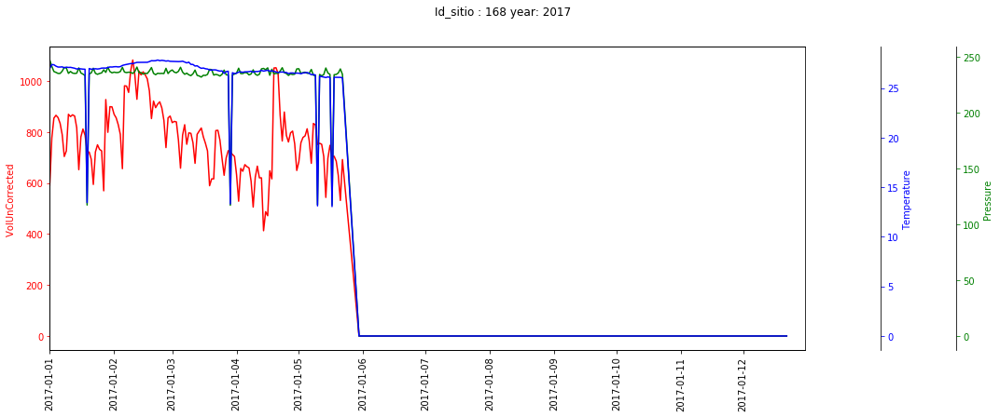

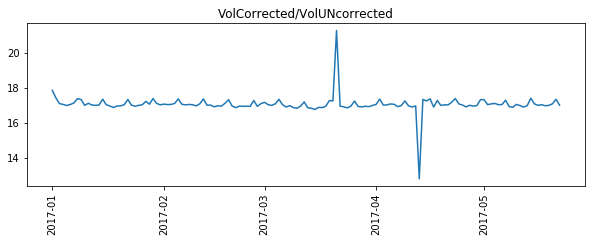

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


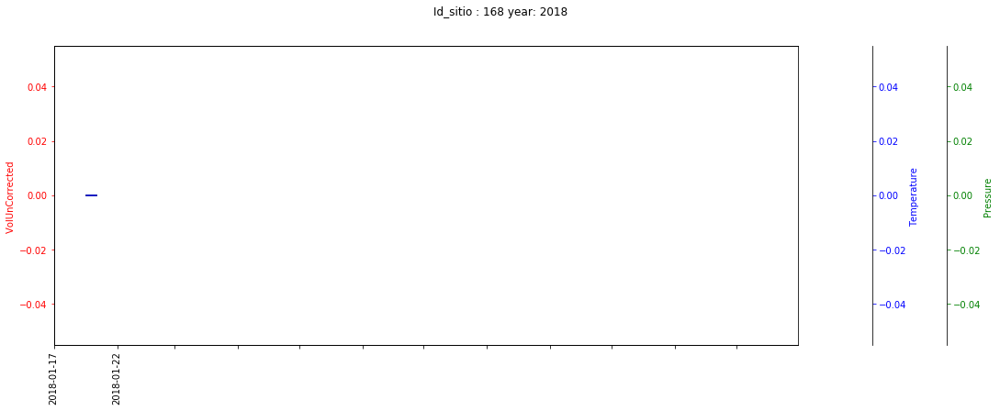

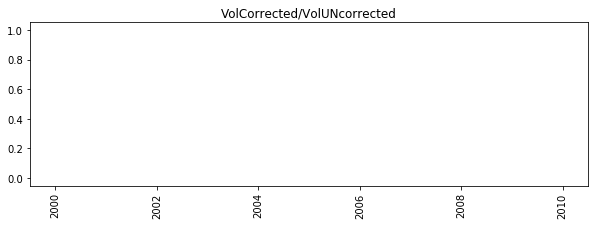

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 2 Pressure Daily_Date
2013-08-19 23:59:59   NaN
2013-08-21 23:59:59   NaN
Name: Pressure, dtype: float64
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 2 Temperature Daily_Date
2013-08-19 23:59:59   NaN
2013-08-21 23:59:59   NaN
Name: Temperature, dtype: float64


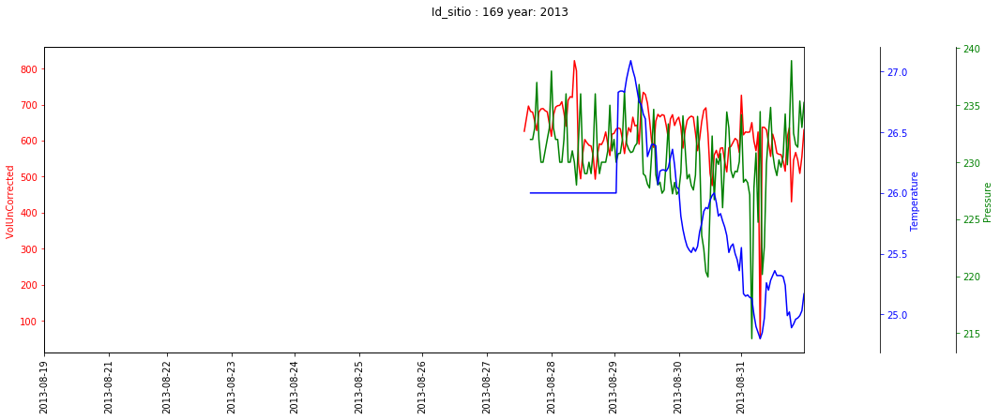

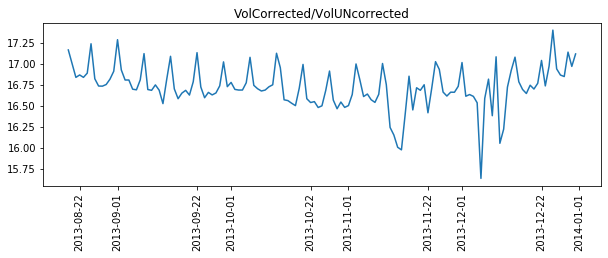

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


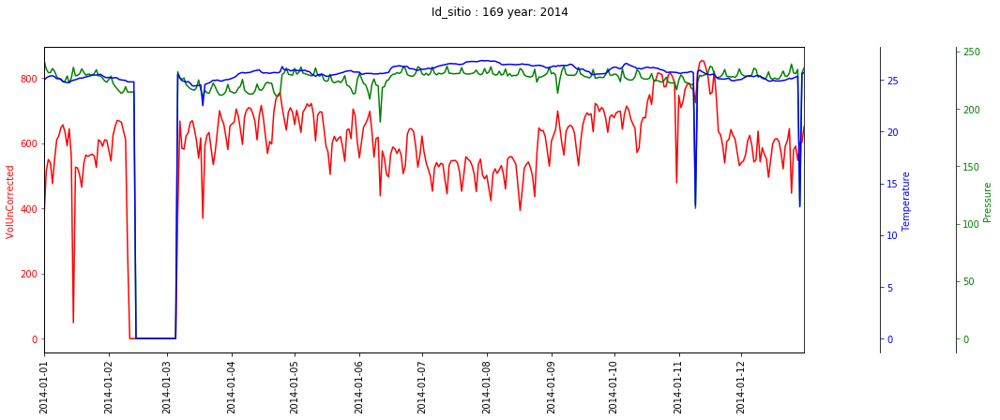

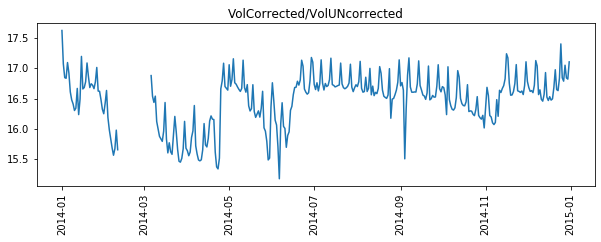

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


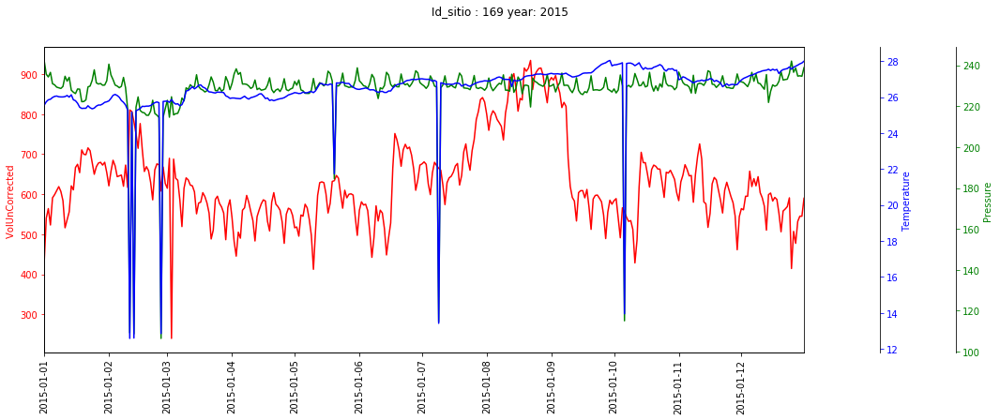

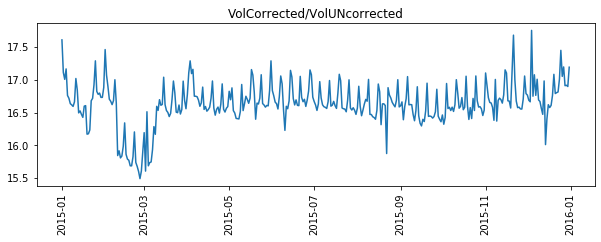

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


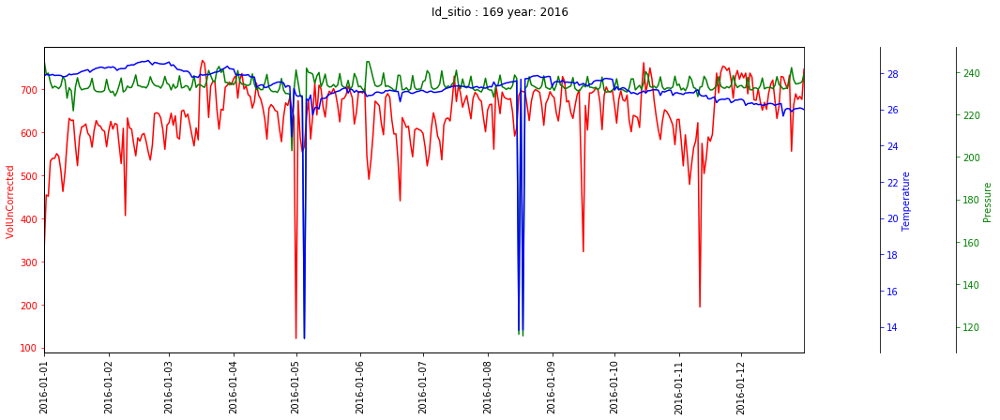

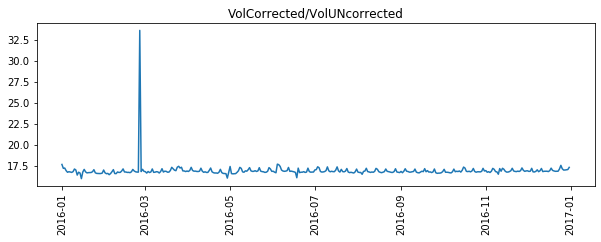

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


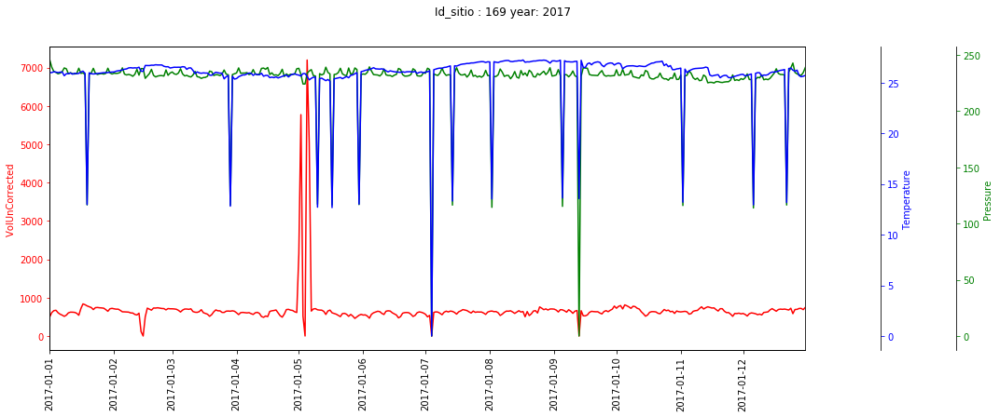

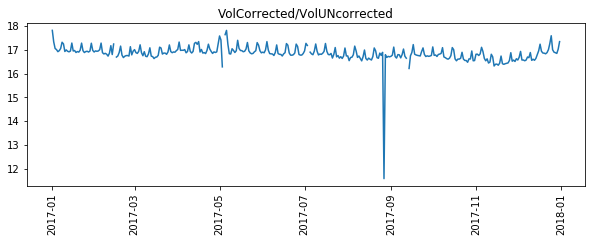

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


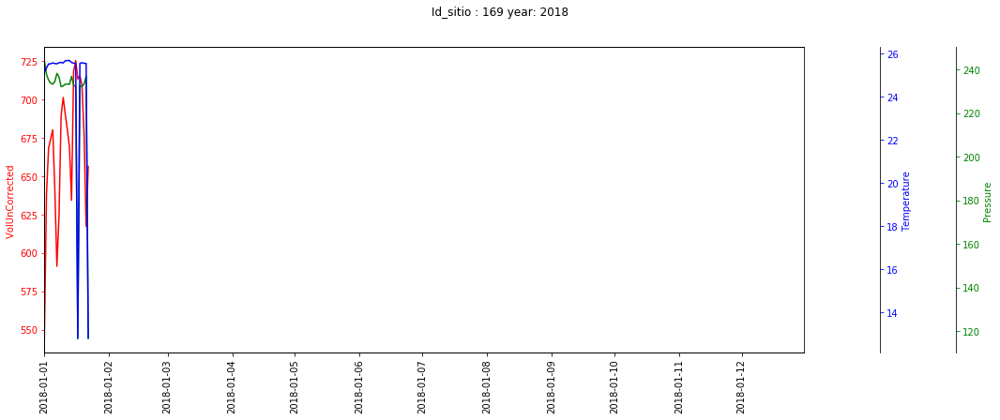

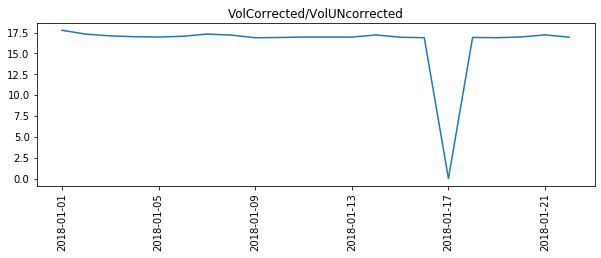

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 1 Pressure Daily_Date
2013-08-19 23:59:59   NaN
Name: Pressure, dtype: float64
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 1 Temperature Daily_Date
2013-08-19 23:59:59   NaN
Name: Temperature, dtype: float64


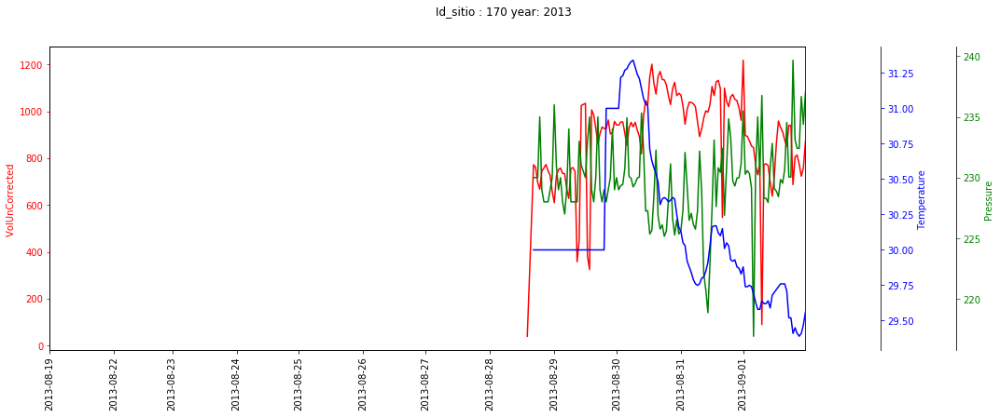

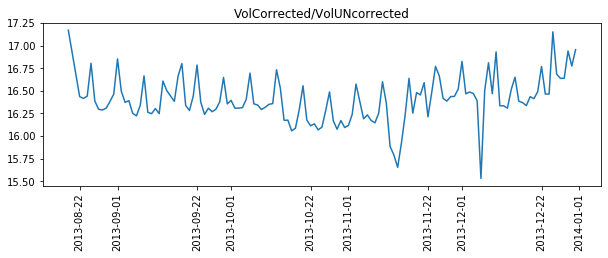

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


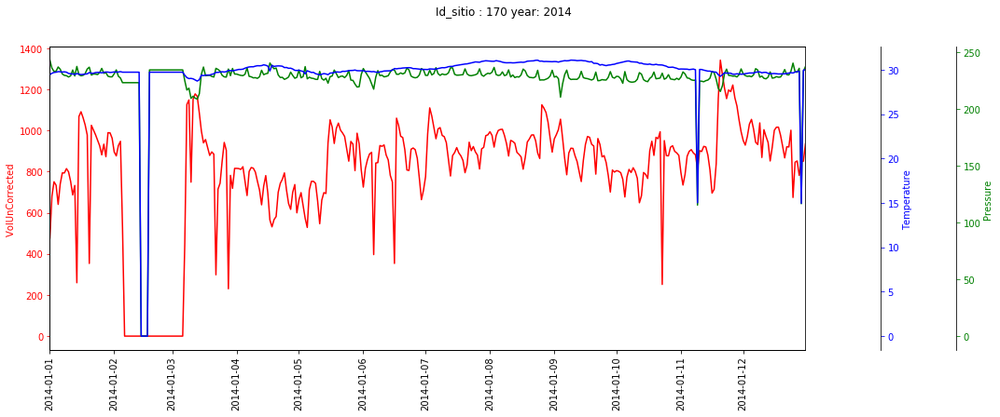

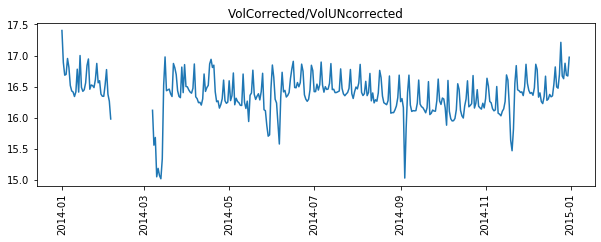

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


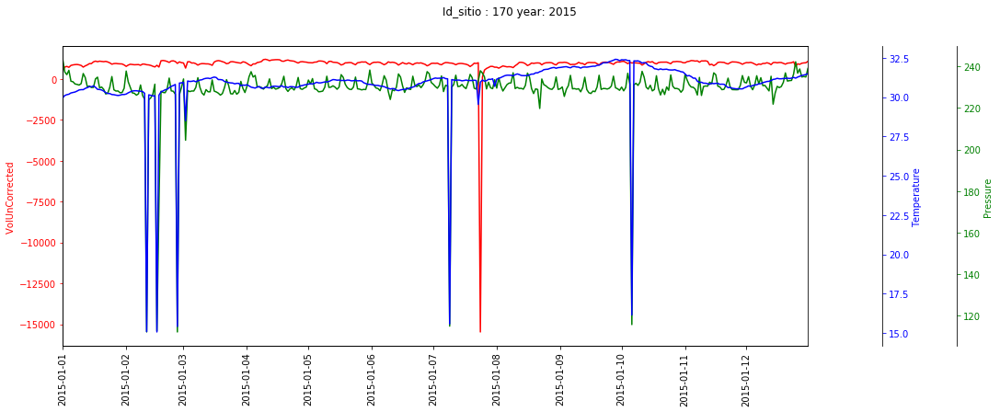

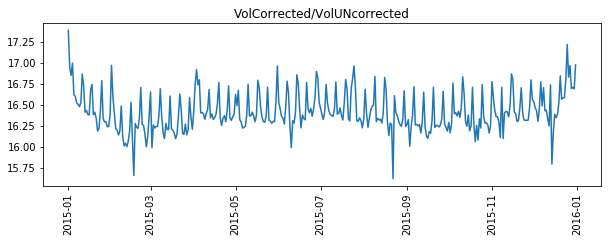

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


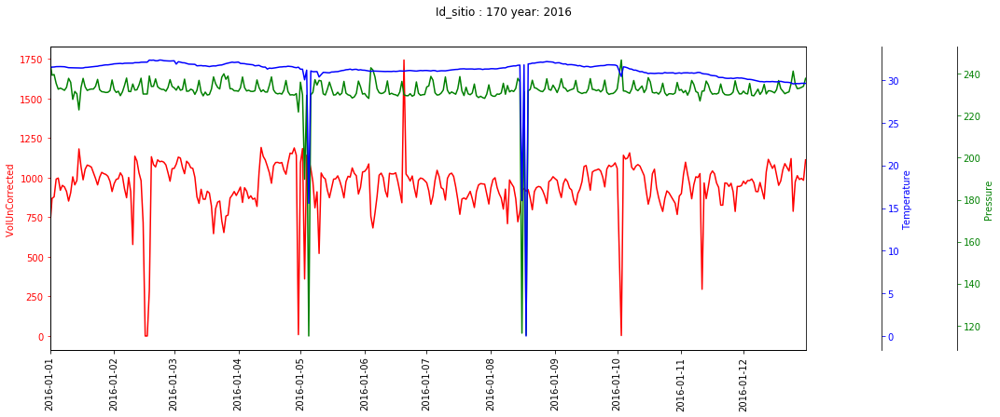

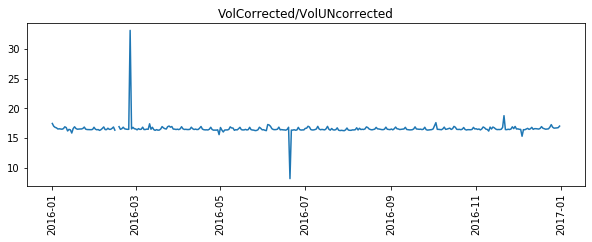

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


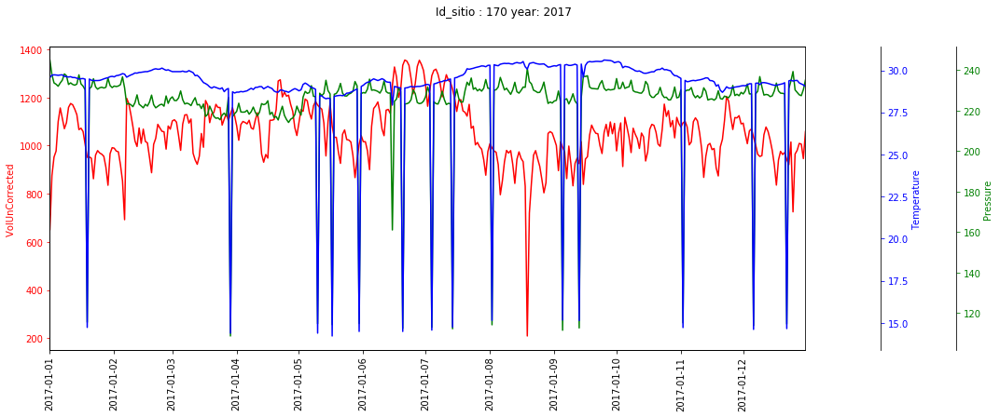

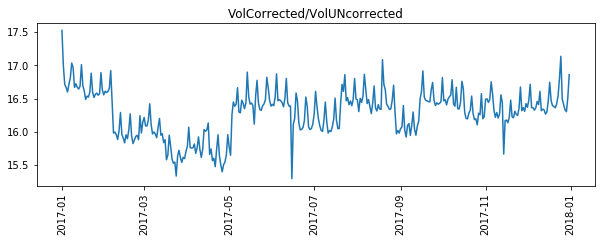

----------------------------------------------------------------------------------------------------
# de valores nulos en la serie VolUnCorrected : 0 VolUnCorrected Series([], Name: VolUnCorrected, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Pressure : 0 Pressure Series([], Name: Pressure, dtype: float64)
----------------------------------------------------------------------------------------------------
# de valores nulos en la serie Temperature : 0 Temperature Series([], Name: Temperature, dtype: float64)


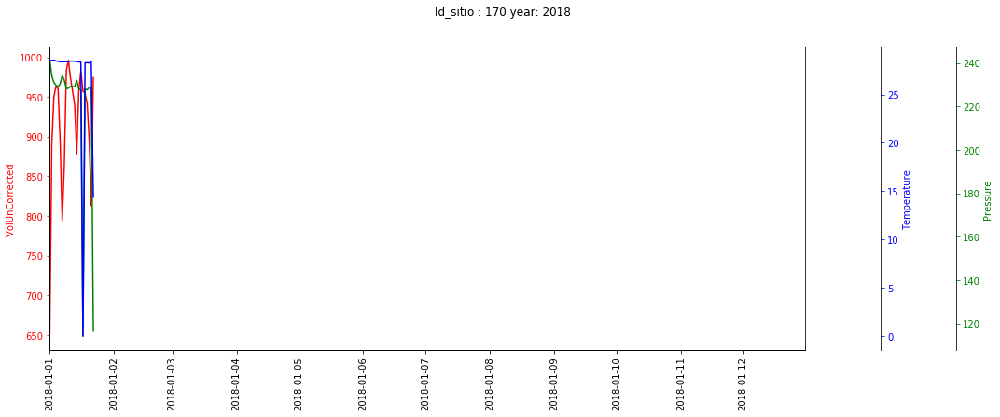

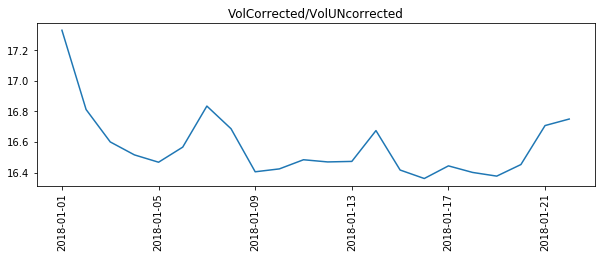

In [178]:
for id_sitio in range(151,171):
    for year in data['Daily_Date'].dt.year.unique():
        todo_en(id_sitio=id_sitio,year = year)

In [179]:
data.columns

Index(['id_sitio', 'corte_evento', 'Daily_Date', 'VolUnCorrected',
       'VolCorrected', 'Pressure', 'Temperature', 'MaxPressure',
       'MaxPressureTime', 'MinPressure', 'MinPressureTime', 'MaxFlow',
       'maxFlowTime', 'MinFlow', 'MinFlowTime', 'MaxTemp', 'maxTempTime',
       'MinTemp', 'MinTempTime', 'id_RTU', 'Day', 'Year'],
      dtype='object')